# TF Image Classification for Belle Epoque Posters: Cultural vs. Tourism vs. Retail

## PART 2 - The Tensorflow Model

**AUTHOR: CAMELIA CIOLAC**  
ciolac_c@inria-alumni.fr

In this mini-project we train a Tensorflow model to perform multiclass classification on images of old posters, dating from the Belle Epoque period in France.  The classifier is trained to predict if a given poster had a cultural focus (theater, exposition), promoted a touristic destination, or if it had a retail focus (product, store).   
The image set is gathered from various museums collections in France and target the late XIX century and early XX century.  
In the preprocessing stage we deduplicate images based on image hashing (fingerprinting) and we use OpenCV to remove bottom border when this contained museum -added metadata.  
For the model we use declarative ML (based on YAML config files) and several custom callbacks.  
In the end, we experiment with an ensemble of top best performing models, whose hyperparams are searched for automatically. 





In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
from IPython.core.display import display, HTML
#display(HTML("<style>.container { width:100% !important; }</style>"))

from matplotlib.pyplot import imshow
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.patches import Rectangle, Circle
from matplotlib.offsetbox import TextArea, DrawingArea, OffsetImage, AnnotationBbox
from mpl_toolkits import mplot3d
from mpl_toolkits.mplot3d import axes3d

import seaborn as sns

from pandas.plotting import parallel_coordinates

%matplotlib inline

In [ ]:
!sudo apt-get install tree > /dev/null 2>&1

!pip install -q keras-tuner

!pip install -q catboost
!pip install -q optunity

     |████████████████████████████████| 71kB 3.8MB/s 
     |████████████████████████████████| 65.8MB 46kB/s 
     |████████████████████████████████| 4.6MB 4.3MB/s 


Restart runtime now in Colab for the setup to be fully operational.

In [ ]:
import pandas as pd
import numpy as np
import math
import scipy.interpolate
import scipy.stats

from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import OneHotEncoder

from PIL import Image as pilim
import collections as coll

import pprint
from tabulate import tabulate

import glob
import json
import shutil
import time

import yaml

import contextlib

import unittest

import uuid

import re

#from annoy import AnnoyIndex
from scipy.spatial import distance

import operator
from itertools import groupby

import pickle
from shutil import copyfile

import kerastuner as kt

import catboost  as cb
print("catboost version:", cb.__version__)

import optunity as opty
print("optunity version:", opty.__version__)

import cv2
print("opencv version:", cv2.__version__)


catboost version: 0.24.4
optunity version: 1.0.0
opencv version: 4.1.2


In [ ]:
import os
#logging levels : 0 = INFO , 1 = WARN , 2 = ERROR, 3 = none (not used in TF2)
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2' 

import tensorflow as tf
from tensorflow.python.lib.io import file_io
import tensorflow_hub as hub
print("TF version:", tf.__version__)

#logging level for TF2
tf.get_logger().setLevel('ERROR')

#devices discovered by TF2
physical_devices = tf.config.list_physical_devices()
for pdev in physical_devices:
  print(pdev)

import tensorflow_addons as tfa

TF version: 2.4.0
PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU')
PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')


In [ ]:
#GPU info - NVIDIA System Management Interface
!nvidia-smi 

Sun Jan 17 11:04:11 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.27.04    Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   44C    P8    10W /  70W |     10MiB / 15079MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
import warnings

with warnings.catch_warnings():
    warnings.filterwarnings("ignore",category=DeprecationWarning)
    warnings.filterwarnings("ignore",category=FutureWarning)
    

#to mute SettingWithCopyWarning
pd.options.mode.chained_assignment = None

In [ ]:
#print options for pandas

pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)

In [ ]:
def utility_print_lists_columnized(long_list, num_cols_columnize = 5):
    """ columnize print of list of strings"""
    
    num_columns = num_cols_columnize
    num_rows = int(len(long_list)/num_columns) 

    list_aux = []
    for ii in range(num_rows):
        list_aux.append(long_list[num_columns * ii: num_columns *(ii+1)])

    list_aux.append(long_list[num_columns * num_rows:])

    print(tabulate(list_aux, tablefmt="plain"))

# Data Annotations

In [ ]:
FOLDER_IMAGES_CROP = "/content/gdrive/My Drive/belle_epoque/posters_cropped/"

In [ ]:
def read_annotations_to_dataframe(json_filepath):
    """read json of exported annotations into a pandas dataframe, 
       and extract the splits for train/valid/test into separate dataframes"""
    df_annot = pd.read_json(json_filepath, orient = "records")

    df_train = df_annot[df_annot["role"] == "train"]
    df_valid =  df_annot[df_annot["role"] == "valid"]
    df_test =  df_annot[df_annot["role"] == "test"]

    print("========================================")
    df_stats = df_annot.groupby(by=["role","label"])["filename"].count()
    print(df_stats)
    print("========================================")

    return df_train, df_valid, df_test

In [ ]:
filepath1 = "/content/gdrive/My Drive/belle_epoque/labels_affiches_train_valid_test.json"
df_train, df_valid, df_test = read_annotations_to_dataframe(json_filepath = filepath1)

df_train.head()

role   label  
test   culture     37
       retail      32
       tourism     11
train  culture    567
       retail     478
       tourism    163
valid  culture    142
       retail     120
       tourism     41
Name: filename, dtype: int64


,filename,annotations,label,role
0,eb28e21f-be7c-4035-91f4-de29c011d6e7.Meunier_Georges.jpg,[retail],retail,train
1,71f32ba3-fa92-432d-8fb9-8568e3720705.Cazaneuve_Edouard.jpg,[culture],culture,train
2,3e827ea4-210c-489b-b284-704e754bd0fc.Choubrac_Alfred.jpg,[culture],culture,train
3,d06f8bff-eac4-4423-9d78-2ee5b49a6ab7.jpg,[retail],retail,train
4,7babd914-655c-4871-9758-bfc307e11bdb.jpg,[retail],retail,train


## Visualize sample images per class and role

In [ ]:
def visualize_list_images(list_images, images_per_row = 5, list_titles = None):
    """ visualize a list of images into a grid with specified images per row, 
        and titles either from input list_titles or, if that's null, the filenames first 10 chars"""

    num_images_to_visualize =  len(list_images)
    num_rows = math.ceil(num_images_to_visualize/images_per_row )

    fig = plt.figure(figsize=(images_per_row  * 4,num_rows * 4))

    for ii in range(num_images_to_visualize):
        ax = fig.add_subplot(num_rows,images_per_row ,ii+1)
        jpgfile = list_images[ii]
        im = pilim.open(jpgfile)
        ax.imshow(im)

        if list_titles is not None:
            the_title = list_titles[ii]
            ax.set_title(the_title)
        else:
            filename = jpgfile.split("/")[-1]
            ax.set_title(filename[0:10] + "...")

    fig.tight_layout()


In [ ]:
def get_sample_per_class(df, label, sample_size = 5, flag_visualize = False):
    """ select a sample of images for a given label from a dataframe; optionally visualize these"""

    df_aux = df[df["label"] == label].sample(sample_size)
    list_files_sample = list(df_aux["filename"].values)

    if flag_visualize is True:
        l_aux = [FOLDER_IMAGES_CROP + el for el in list_files_sample]
        visualize_list_images(list_images = l_aux, images_per_row= 7)

    return list_files_sample

**CULTURE POSTERS**

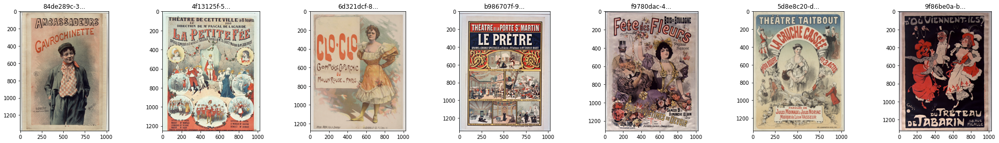

In [ ]:
ex_culture = get_sample_per_class(df = df_train, label = "culture",
                                  sample_size = 7, flag_visualize = True)

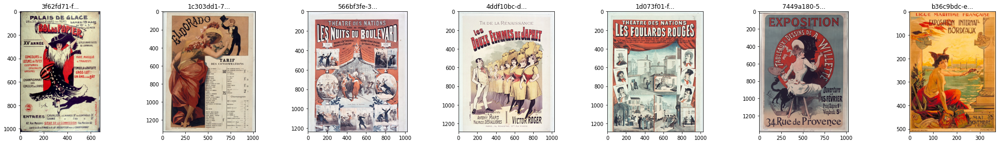

In [ ]:
ex_culture = get_sample_per_class(df = df_valid, label = "culture",
                                  sample_size = 7, flag_visualize = True)

**TOURISM POSTERS**

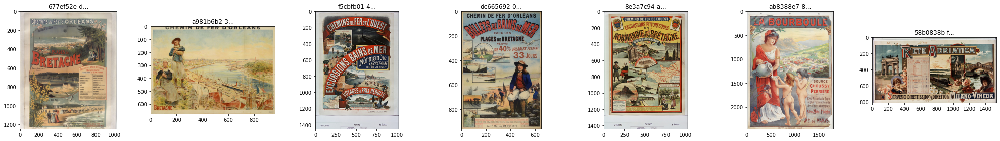

In [ ]:
ex_tourism = get_sample_per_class(df = df_train, label = "tourism",
                                  sample_size = 7, flag_visualize = True)

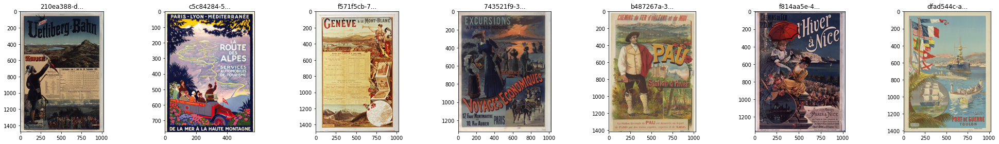

In [ ]:
ex_tourism = get_sample_per_class(df = df_valid, label = "tourism",
                                  sample_size = 7, flag_visualize = True)

**RETAIL POSTERS**

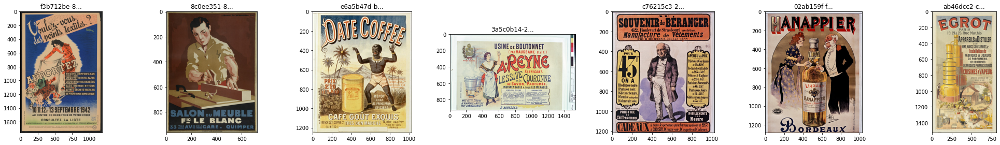

In [ ]:
ex_retail = get_sample_per_class(df = df_train, label = "retail",
                                  sample_size = 7, flag_visualize = True)

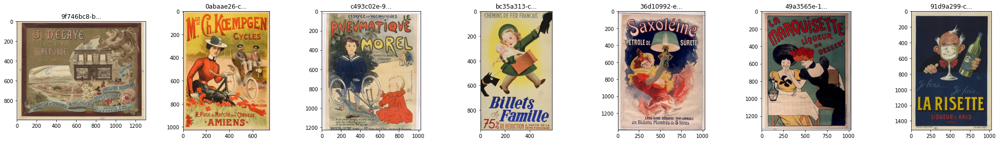

In [ ]:
ex_retail = get_sample_per_class(df = df_valid, label = "retail",
                                  sample_size = 7, flag_visualize = True)

We already observe some retail posters which are ressemble cultural ones

# Tensorflow preparations

## TF ImageDataGenerator with image augmentation

see docs at https://www.tensorflow.org/api_docs/python/tf/keras/preprocessing/image/ImageDataGenerator

In [ ]:
help(tf.keras.preprocessing.image.ImageDataGenerator.__init__)

Help on function __init__ in module tensorflow.python.keras.preprocessing.image:

__init__(self, featurewise_center=False, samplewise_center=False, featurewise_std_normalization=False, samplewise_std_normalization=False, zca_whitening=False, zca_epsilon=1e-06, rotation_range=0, width_shift_range=0.0, height_shift_range=0.0, brightness_range=None, shear_range=0.0, zoom_range=0.0, channel_shift_range=0.0, fill_mode='nearest', cval=0.0, horizontal_flip=False, vertical_flip=False, rescale=None, preprocessing_function=None, data_format=None, validation_split=0.0, dtype=None)
    Initialize self.  See help(type(self)) for accurate signature.



Note: in yaml, for boolean values are used yes/no

In [ ]:
%%writefile /tmp/imagegenerator_config1.yml
brightness: 
  min: 0.8
  max: 1.2
shift:
  vertical: 0.1
  horizontal: 0.1
flip:
  vertical: no
  horizontal: yes
batch_size: 8
  

Writing /tmp/imagegenerator_config1.yml


In [ ]:
class ImageGenYamlParser:
    def __init__(self, config_file_yaml):
        self.config_file_yaml = config_file_yaml

        #loading config from YAML file
        with open(self.config_file_yaml) as f:    
            self.config = yaml.load(f)

    def get_augm_brightness(self):
        tup = (self.config["brightness"]["min"], self.config["brightness"]["max"])
        return tup

    def get_augm_verticalshift(self):
        return self.config["shift"]["vertical"]

    def get_augm_horizontalshift(self):
        return self.config["shift"]["horizontal"]

    def get_augm_verticalflip(self):
        return self.config["flip"]["vertical"]

    def get_augm_horizontalflip(self):
        return self.config["flip"]["horizontal"]

    def get_batchsize(self):
        return self.config["batch_size"]


In [ ]:
#test case

class TestImageGenYamlParser(unittest.TestCase):

    config_file_yaml = "/tmp/imagegenerator_config1.yml"

    def test1(self):
        """ test1 - a numeric value from yaml"""
        imgen_yaml_parser = ImageGenYamlParser(self.config_file_yaml)
        batch_size = imgen_yaml_parser.get_batchsize()
        self.assertTrue(isinstance(batch_size, int), True)
        self.assertEqual(batch_size, 8)  

    def test2(self):
        """ test2 - a boolean value from yaml"""
        imgen_yaml_parser = ImageGenYamlParser(self.config_file_yaml)
        flip_vertical = imgen_yaml_parser.get_augm_verticalflip()
        self.assertTrue(isinstance(flip_vertical, bool), True)
        self.assertEqual(flip_vertical, False)  

    def test3(self):
        """ test3 - a tuple value"""  
        imgen_yaml_parser = ImageGenYamlParser(self.config_file_yaml)
        brightness = imgen_yaml_parser.get_augm_brightness()
        self.assertTrue(isinstance(brightness, tuple), True)
        self.assertEqual(len(brightness), 2)  
        self.assertEqual(brightness[0], 0.8)
        self.assertEqual(brightness[1], 1.2)


unittest.main(argv=[''], verbosity=1, exit=False)

...
----------------------------------------------------------------------
Ran 3 tests in 0.009s

OK


In [ ]:
def create_augmented_image_generators(df_train, df_valid, config_file_yaml):
    """ creates 2 image geerators from pandas dataframes, 
        with augmentation parsed from yaml config file"""

    imgen_yaml_parser = ImageGenYamlParser(config_file_yaml)

    #on training data, do image augmentation
    #    - brightness of 1.0 is no augmentation in brightness
    #class_mode categorical, means it will use OHE(one-hot encoding) for labels
    #rescale=1/255 is not set, since we manage resizing as paty of the model
    datagen_train = tf.keras.preprocessing.image.ImageDataGenerator(
                        brightness_range = imgen_yaml_parser.get_augm_brightness(),
                        height_shift_range = imgen_yaml_parser.get_augm_verticalshift(), 
                        width_shift_range = imgen_yaml_parser.get_augm_horizontalshift(), 
                        fill_mode="constant", cval = 255.0, # how to fill aftter shift 
                        horizontal_flip = imgen_yaml_parser.get_augm_verticalflip(),
                        vertical_flip = imgen_yaml_parser.get_augm_verticalflip()
                    )

    #target_size is not set, since we manage resizing as paty of the model
    train_data_generator = datagen_train.flow_from_dataframe(
                        dataframe = df_train, 
                        directory = FOLDER_IMAGES_CROP, 
                        x_col = "filename", 
                        y_col = "label", 
                        class_mode = "categorical", 
                        color_mode = 'rgb',
                        batch_size = imgen_yaml_parser.get_batchsize(),
                        seed = 13,
                        shuffle = True)


    #on validation data, no augmentation
    #rescale=1/255 is not set, since we manage resizing as paty of the model
    datagen_valid = tf.keras.preprocessing.image.ImageDataGenerator( )

    #target_size is not set, since we manage resizing as paty of the model
    valid_data_generator = datagen_valid.flow_from_dataframe(
                        dataframe = df_valid, 
                        directory = FOLDER_IMAGES_CROP, 
                        x_col = "filename", 
                        y_col = "label", 
                        class_mode = "categorical", 
                        color_mode = 'rgb',
                        batch_size = imgen_yaml_parser.get_batchsize(),
                        seed = 13,
                        shuffle = True)

    return train_data_generator, valid_data_generator

In [ ]:
train_data_generator, valid_data_generator = create_augmented_image_generators(df_train, df_valid,
                                                                               config_file_yaml = "/tmp/imagegenerator_config1.yml")

Found 1208 validated image filenames belonging to 3 classes.
Found 303 validated image filenames belonging to 3 classes.


In [ ]:
train_data_generator.reset()
valid_data_generator.reset()

In [ ]:
def consume_image_generator_for_debug(image_data_generator):
    """consume the generator to see how data will look like at the input of the model"""

    fig = plt.figure(figsize=(8 * 4, 6))

    candid_batch = next(image_data_generator)

    print("batch index:", image_data_generator.batch_index)
    print("batch size:", image_data_generator.batch_size)


    print("----------------------------------------------------------")

    #candid_batch is a tuple of (images, ys)
    print("candid_batch[0].shape = ", candid_batch[0].shape)
    print("candid_batch[1].shape = ", candid_batch[1].shape)


    for ii in range(8):
        ax = fig.add_subplot(1,8,ii+1)
        im = candid_batch[0][ii]
        the_label = candid_batch[1][ii]
        print(im.shape, " ==> ", " ||| example pixels:", im[0][0][0:10])
        ax.imshow(np.array( im, dtype=np.uint8), alpha = 1)
        ax.set_title(the_label)


    fig.tight_layout()

batch index: 1
batch size: 8
----------------------------------------------------------
candid_batch[0].shape =  (8, 256, 256, 3)
candid_batch[1].shape =  (8, 3)
(256, 256, 3)  ==>   ||| example pixels: [255. 255. 255.]
(256, 256, 3)  ==>   ||| example pixels: [213. 213. 213.]
(256, 256, 3)  ==>   ||| example pixels: [255. 255. 255.]
(256, 256, 3)  ==>   ||| example pixels: [210. 207. 200.]
(256, 256, 3)  ==>   ||| example pixels: [255. 255. 255.]
(256, 256, 3)  ==>   ||| example pixels: [255. 255. 255.]
(256, 256, 3)  ==>   ||| example pixels: [227. 227. 227.]
(256, 256, 3)  ==>   ||| example pixels: [255. 255. 255.]


/usr/local/lib/python3.6/dist-packages/matplotlib/text.py:1165: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


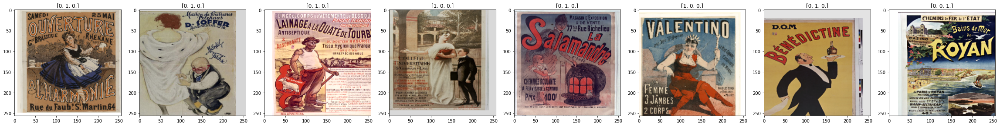

In [ ]:
consume_image_generator_for_debug(image_data_generator = train_data_generator)


batch index: 1
batch size: 8
----------------------------------------------------------
candid_batch[0].shape =  (8, 256, 256, 3)
candid_batch[1].shape =  (8, 3)
(256, 256, 3)  ==>   ||| example pixels: [204. 205. 200.]
(256, 256, 3)  ==>   ||| example pixels: [229. 217. 195.]
(256, 256, 3)  ==>   ||| example pixels: [252. 247. 244.]
(256, 256, 3)  ==>   ||| example pixels: [239. 246. 239.]
(256, 256, 3)  ==>   ||| example pixels: [227. 216. 196.]
(256, 256, 3)  ==>   ||| example pixels: [248. 249. 243.]
(256, 256, 3)  ==>   ||| example pixels: [243. 243. 235.]
(256, 256, 3)  ==>   ||| example pixels: [150. 137. 163.]


/usr/local/lib/python3.6/dist-packages/matplotlib/text.py:1165: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


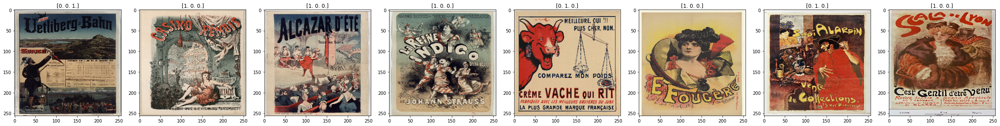

In [ ]:
consume_image_generator_for_debug(image_data_generator = valid_data_generator)


In [ ]:
#note:  the mapping respects the lexicographic order of label names
dict_decode = train_data_generator.class_indices
print(dict_decode)

print("\nAccordingly, the OHE will be:\n")
num_classes = len(dict_decode)
for k,v in dict_decode.items():
    k_ohe = np.zeros(num_classes)
    k_ohe[v] = 1
    print(k.ljust(10), " -->", k_ohe)


dict_decode_inv = {v:k for k,v in dict_decode.items()}
print("\n", dict_decode_inv)

{'culture': 0, 'retail': 1, 'tourism': 2}

Accordingly, the OHE will be:

culture     --> [1. 0. 0.]
retail      --> [0. 1. 0.]
tourism     --> [0. 0. 1.]

 {0: 'culture', 1: 'retail', 2: 'tourism'}


In [ ]:
#optionally - consume it entirely to ensure no issues (here, if we used validate_filenames=False, we can see which files cannot be read)
num_iter = train_data_generator.samples//train_data_generator.batch_size
train_data_generator.reset()

for ii in range(num_iter):
    try:
        candid_batch = next(train_data_generator)
    except Exception as e:
        print(e)


## Download pretrained feature vectors models

Note: we'll use feature vectors from pretrained ResNetv2 50 ( on ImageNet dataset) and we implement support for 2 options:
- use the model from TFHub 
- use the model from tf.keras.applications

**Option 1: Model from TFHub loaded into a KerasLayer:**

In [ ]:
!wget --spider https://tfhub.dev/google/imagenet/resnet_v2_50/feature_vector/4?tf-hub-format=compressed

Spider mode enabled. Check if remote file exists.
--2021-01-15 09:51:46--  https://tfhub.dev/google/imagenet/resnet_v2_50/feature_vector/4?tf-hub-format=compressed
Resolving tfhub.dev (tfhub.dev)... 74.125.20.100, 74.125.20.101, 74.125.20.113, ...
Connecting to tfhub.dev (tfhub.dev)|74.125.20.100|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://storage.googleapis.com/tfhub-modules/google/imagenet/resnet_v2_50/feature_vector/4.tar.gz [following]
Spider mode enabled. Check if remote file exists.
--2021-01-15 09:51:46--  https://storage.googleapis.com/tfhub-modules/google/imagenet/resnet_v2_50/feature_vector/4.tar.gz
Resolving storage.googleapis.com (storage.googleapis.com)... 74.125.142.128, 108.177.98.128, 74.125.195.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|74.125.142.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 87742681 (84M) [application/x-tar]
Remote file exists.



In [ ]:
!mkdir -p /tmp/tfhub_models/resnet_v2_50
!curl -L "https://tfhub.dev/google/imagenet/resnet_v2_50/feature_vector/4?tf-hub-format=compressed" | tar -zxvC /tmp/tfhub_models/resnet_v2_50

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
./
./assets/
./saved_model.pb
./variables/
./variables/variables.index
./variables/variables.data-00000-of-00001
100 83.6M  100 83.6M    0     0  45.3M      0  0:00:01  0:00:01 --:--:-- 67.8M


In [ ]:
!mkdir -p /tmp/tfhub_models/inceptionv3
!curl -L "https://tfhub.dev/google/imagenet/inception_v3/feature_vector/4?tf-hub-format=compressed" | tar -zxvC /tmp/tfhub_models/inceptionv3

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
./
./assets/
./saved_model.pb
./variables/
./variables/variables.index
./variables/variables.data-00000-of-00001
100 77.3M  100 77.3M    0     0  42.2M      0  0:00:01  0:00:01 --:--:-- 58.1M


In [ ]:
!mkdir -p /tmp/tfhub_models/inception_resnet_v2
!curl -L "https://tfhub.dev/google/imagenet/inception_resnet_v2/feature_vector/4?tf-hub-format=compressed" | tar -zxvC /tmp/tfhub_models/inception_resnet_v2

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0./
./assets/
./saved_model.pb
./variables/
./variables/variables.index
./variables/variables.data-00000-of-00001
100  193M  100  193M    0     0  59.1M      0  0:00:03  0:00:03 --:--:-- 68.5M


In [ ]:
!tree --du -h  /tmp/tfhub_models

/tmp/tfhub_models
├── [214M]  inception_resnet_v2
│   ├── [4.0K]  assets
│   ├── [6.1M]  saved_model.pb
│   └── [207M]  variables
│       ├── [207M]  variables.data-00000-of-00001
│       └── [ 16K]  variables.index
├── [ 85M]  inceptionv3
│   ├── [4.0K]  assets
│   ├── [2.3M]  saved_model.pb
│   └── [ 83M]  variables
│       ├── [ 83M]  variables.data-00000-of-00001
│       └── [7.1K]  variables.index
└── [ 91M]  resnet_v2_50
    ├── [4.0K]  assets
    ├── [1.4M]  saved_model.pb
    └── [ 90M]  variables
        ├── [ 90M]  variables.data-00000-of-00001
        └── [5.0K]  variables.index

 390M used in 9 directories, 9 files


In [ ]:
#sidenote: how to load it to inspect its layers structure
embedder1 = hub.KerasLayer("/tmp/tfhub_models/resnet_v2_50",
                          trainable = False,
                          arguments = dict(return_endpoints=True)  #see https://github.com/tensorflow/hub/issues/453
                         )

print("-------------------------------------------------------------------")
utility_print_lists_columnized([el for el in dir(embedder1) if el[0] != "_"])

-------------------------------------------------------------------
activity_regularizer  add_loss             add_metric            add_update                add_variable
add_weight            apply                build                 built                     call
compute_dtype         compute_mask         compute_output_shape  compute_output_signature  count_params
dtype                 dtype_policy         dynamic               from_config               get_config
get_input_at          get_input_mask_at    get_input_shape_at    get_losses_for            get_output_at
get_output_mask_at    get_output_shape_at  get_updates_for       get_weights               inbound_nodes
input                 input_mask           input_shape           input_spec                losses
metrics               name                 name_scope            non_trainable_variables   non_trainable_weights
outbound_nodes        output               output_mask           output_shape              resolved_objec

In [ ]:
inp_ = tf.keras.layers.Input((224, 224, 3))
outp_ = embedder1(inp_)
for k, v in sorted(outp_.items()):
    # v is instance of tf.python.keras.engine.keras_tensor.KerasTensor
    print(str(k).ljust(60), v.shape, v.dtype)

default                                                      (None, 2048) <dtype: 'float32'>
resnet_v2_50/block1                                          (None, 28, 28, 256) <dtype: 'float32'>
resnet_v2_50/block1/unit_1/bottleneck_v2                     (None, 56, 56, 256) <dtype: 'float32'>
resnet_v2_50/block1/unit_1/bottleneck_v2/conv1               (None, 56, 56, 64) <dtype: 'float32'>
resnet_v2_50/block1/unit_1/bottleneck_v2/conv2               (None, 56, 56, 64) <dtype: 'float32'>
resnet_v2_50/block1/unit_1/bottleneck_v2/conv3               (None, 56, 56, 256) <dtype: 'float32'>
resnet_v2_50/block1/unit_1/bottleneck_v2/shortcut            (None, 56, 56, 256) <dtype: 'float32'>
resnet_v2_50/block1/unit_2/bottleneck_v2                     (None, 56, 56, 256) <dtype: 'float32'>
resnet_v2_50/block1/unit_2/bottleneck_v2/conv1               (None, 56, 56, 64) <dtype: 'float32'>
resnet_v2_50/block1/unit_2/bottleneck_v2/conv2               (None, 56, 56, 64) <dtype: 'float32'>
resnet_v2_5

**OPTION 2: Use tf.keras.applications**

note: to download and use weights from cached files, we get the urls from WEIGHTS_PATH_NO_TOP in:

https://github.com/tensorflow/tensorflow/blob/master/tensorflow/python/keras/applications/resnet.py  
https://github.com/tensorflow/tensorflow/blob/master/tensorflow/python/keras/applications/inception_v3.py  
https://github.com/tensorflow/tensorflow/blob/master/tensorflow/python/keras/applications/inception_resnet_v2.py  


In [ ]:
!wget --spider https://storage.googleapis.com/tensorflow/keras-applications/resnet/resnet50v2_weights_tf_dim_ordering_tf_kernels_notop.h5

Spider mode enabled. Check if remote file exists.
--2021-01-15 09:52:04--  https://storage.googleapis.com/tensorflow/keras-applications/resnet/resnet50v2_weights_tf_dim_ordering_tf_kernels_notop.h5
Resolving storage.googleapis.com (storage.googleapis.com)... 74.125.20.128, 74.125.195.128, 74.125.142.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|74.125.20.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 94668760 (90M) [application/octet-stream]
Remote file exists.



In [ ]:
!mkdir -p /tmp/tfhub_models/apps
!wget -P /tmp/tfhub_models/apps  https://storage.googleapis.com/tensorflow/keras-applications/resnet/resnet50v2_weights_tf_dim_ordering_tf_kernels_notop.h5

--2021-01-15 09:52:07--  https://storage.googleapis.com/tensorflow/keras-applications/resnet/resnet50v2_weights_tf_dim_ordering_tf_kernels_notop.h5
Resolving storage.googleapis.com (storage.googleapis.com)... 142.250.107.128, 74.125.20.128, 74.125.195.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|142.250.107.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 94668760 (90M) [application/octet-stream]
Saving to: ‘/tmp/tfhub_models/apps/resnet50v2_weights_tf_dim_ordering_tf_kernels_notop.h5’

resnet50v2_weights_ 100%[===================>]  90.28M   160MB/s    in 0.6s    

2021-01-15 09:52:08 (160 MB/s) - ‘/tmp/tfhub_models/apps/resnet50v2_weights_tf_dim_ordering_tf_kernels_notop.h5’ saved [94668760/94668760]



In [ ]:
!wget -P /tmp/tfhub_models/apps  https://storage.googleapis.com/tensorflow/keras-applications/inception_v3/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5

--2021-01-15 09:52:09--  https://storage.googleapis.com/tensorflow/keras-applications/inception_v3/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5
Resolving storage.googleapis.com (storage.googleapis.com)... 74.125.142.128, 108.177.98.128, 74.125.195.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|74.125.142.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 87910968 (84M) [application/octet-stream]
Saving to: ‘/tmp/tfhub_models/apps/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5’

inception_v3_weight 100%[===================>]  83.84M   179MB/s    in 0.5s    

2021-01-15 09:52:09 (179 MB/s) - ‘/tmp/tfhub_models/apps/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5’ saved [87910968/87910968]



In [ ]:
!wget -P /tmp/tfhub_models/apps  https://storage.googleapis.com/tensorflow/keras-applications/inception_resnet_v2/inception_resnet_v2_weights_tf_dim_ordering_tf_kernels_notop.h5

--2021-01-15 09:52:10--  https://storage.googleapis.com/tensorflow/keras-applications/inception_resnet_v2/inception_resnet_v2_weights_tf_dim_ordering_tf_kernels_notop.h5
Resolving storage.googleapis.com (storage.googleapis.com)... 142.250.107.128, 74.125.20.128, 74.125.195.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|142.250.107.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 219055592 (209M) [application/octet-stream]
Saving to: ‘/tmp/tfhub_models/apps/inception_resnet_v2_weights_tf_dim_ordering_tf_kernels_notop.h5’

inception_resnet_v2 100%[===================>] 208.91M   274MB/s    in 0.8s    

2021-01-15 09:52:11 (274 MB/s) - ‘/tmp/tfhub_models/apps/inception_resnet_v2_weights_tf_dim_ordering_tf_kernels_notop.h5’ saved [219055592/219055592]



In [ ]:
!tree --du -h  /tmp/tfhub_models/apps

/tmp/tfhub_models/apps
├── [209M]  inception_resnet_v2_weights_tf_dim_ordering_tf_kernels_notop.h5
├── [ 84M]  inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5
└── [ 90M]  resnet50v2_weights_tf_dim_ordering_tf_kernels_notop.h5

 383M used in 0 directories, 3 files


In [ ]:
#sidenote: how to load it to inspect its layers structure
#note: we use cached .h5 file with weights (otherwise we could download them dynamically with wights = "imagenet")
embedder2 = tf.keras.applications.ResNet50V2(include_top = False, 
                                             input_shape = (224, 224, 3),
                                             weights = "/tmp/tfhub_models/apps/resnet50v2_weights_tf_dim_ordering_tf_kernels_notop.h5",
                                             pooling='avg')

print("-------------------------------------------------------------------")
utility_print_lists_columnized([el for el in dir(embedder2) if el[0] != "_"])

-------------------------------------------------------------------
activity_regularizer  add_loss                  add_metric             add_update           add_variable
add_weight            apply                     build                  built                call
compile               compiled_loss             compiled_metrics       compute_dtype        compute_mask
compute_output_shape  compute_output_signature  count_params           distribute_strategy  dtype
dtype_policy          dynamic                   evaluate               evaluate_generator   fit
fit_generator         from_config               get_config             get_input_at         get_input_mask_at
get_input_shape_at    get_layer                 get_losses_for         get_output_at        get_output_mask_at
get_output_shape_at   get_updates_for           get_weights            history              inbound_nodes
input                 input_mask                input_names            input_shape          input_spec
i

This time we have access to the layers structure of the model and set which layers to be trainable. Initially all are trainable:

In [ ]:
for lay in embedder2.layers[0:10]:
    print(str(lay.name).ljust(25), " -->", lay.trainable, "  |||  ",  lay.output_shape , "  |||  ", type(lay))
    
print("...")

for lay in embedder2.layers[-10:]:
    print(str(lay.name).ljust(25), " -->", lay.trainable, "  |||  ",  lay.output_shape , "  |||  ", type(lay))

input_2                    --> True   |||   [(None, 224, 224, 3)]   |||   <class 'tensorflow.python.keras.engine.input_layer.InputLayer'>
conv1_pad                  --> True   |||   (None, 230, 230, 3)   |||   <class 'tensorflow.python.keras.layers.convolutional.ZeroPadding2D'>
conv1_conv                 --> True   |||   (None, 112, 112, 64)   |||   <class 'tensorflow.python.keras.layers.convolutional.Conv2D'>
pool1_pad                  --> True   |||   (None, 114, 114, 64)   |||   <class 'tensorflow.python.keras.layers.convolutional.ZeroPadding2D'>
pool1_pool                 --> True   |||   (None, 56, 56, 64)   |||   <class 'tensorflow.python.keras.layers.pooling.MaxPooling2D'>
conv2_block1_preact_bn     --> True   |||   (None, 56, 56, 64)   |||   <class 'tensorflow.python.keras.layers.normalization_v2.BatchNormalization'>
conv2_block1_preact_relu   --> True   |||   (None, 56, 56, 64)   |||   <class 'tensorflow.python.keras.layers.core.Activation'>
conv2_block1_1_conv        --> True

In [ ]:
for lay in embedder2.layers:
    lay.trainable = False

for lay in embedder2.layers[-10:]:
    print(str(lay.name).ljust(25), " -->", lay.trainable)

conv5_block3_1_relu        --> False
conv5_block3_2_pad         --> False
conv5_block3_2_conv        --> False
conv5_block3_2_bn          --> False
conv5_block3_2_relu        --> False
conv5_block3_3_conv        --> False
conv5_block3_out           --> False
post_bn                    --> False
post_relu                  --> False
avg_pool                   --> False


**Create a config file with the input size required by each model we support:**

In [ ]:
!ls /tmp/tfhub_models

apps  inception_resnet_v2  inceptionv3	resnet_v2_50


In [ ]:
%%writefile /tmp/models_inputs_config.yml
resnet_v2_50:
  target_size: [224,224]
inceptionv3:
  target_size: [299,299]
inception_resnet_v2:
  target_size: [299,299]

Writing /tmp/models_inputs_config.yml


In [ ]:
def get_model_inputsize(model_name):
    """ parse a yaml config file to extract the tuple of integers
        representing input size for the selcted model name"""

    config_file_yaml = "/tmp/models_inputs_config.yml"

    #loading config from YAML file
    with open(config_file_yaml) as f:    
        config = yaml.load(f)
    
    if model_name in config.keys():
        #convert list to tuple
        target_size = tuple(config[model_name]["target_size"])
        return target_size
    else:
        raise Exception("model name {} not supported yet".format(model_name))

In [ ]:
#test case

class TestModelInputSize(unittest.TestCase):

    def test1(self):
        """ test1 - a supported model"""
        target_size = get_model_inputsize(model_name = "inceptionv3")  
        self.assertTrue(isinstance(target_size, tuple), True)
        self.assertEqual(len(target_size), 2)  
        self.assertEqual(target_size[0], 299)
        self.assertEqual(target_size[1], 299)

    def test2(self):
        """ test2 - un unsupported model"""  
        with self.assertRaises(Exception) as context:
            target_size = get_model_inputsize(model_name = "inceptionv5") 

        self.assertTrue('not supported yet' in str(context.exception))


unittest.main(argv=[''], verbosity=1, exit=False)

.....
----------------------------------------------------------------------
Ran 5 tests in 0.016s

OK


--------------------

# Tensorflow Models 

## Custom Metrics and Callbacks

### List of metrics (including custom metrics)

In [ ]:
#recap - how it works
#note: the output matrix size (here 2x2) depends on the number of disinct values in the reunion of y_tr and y_pr
y_tr = [2, 0, 2, 2, 0, 2]
y_pr = [0, 0, 2, 2, 0, 2]
print(confusion_matrix(y_tr, y_pr))

print("-------------------------------------------------")

#if we want to take into account the labels and have matrix 3x3, even if label 1 is missing in y_tr and y_pr, we specify:
print(confusion_matrix(y_tr, y_pr, labels = [0,1,2]))
 

[[2 0]
 [1 3]]
-------------------------------------------------
[[2 0 0]
 [0 0 0]
 [1 0 3]]


In [ ]:
class MyConfussionMatrixMetric(tf.keras.metrics.Metric):

    def __init__(self, name="confussmatrix", num_classes = 3, **kwargs):
        super(MyConfussionMatrixMetric, self).__init__(name=name, **kwargs)
        self.num_classes = num_classes
        self.labels = list(range(self.num_classes))
        self.confuss_matrix = np.zeros(shape = (self.num_classes, self.num_classes))

    def update_state(self, y_true, y_pred, sample_weight=None):
        batch_y_true_cl = tf.argmax(y_true, axis=1)
        batch_y_pred_cl = tf.argmax(y_pred, axis=1)
        #convert tensor --> numpy array . For this to be possible (i.e. eager execution mode), when we compile model, we need to put there run_eagerly=True
        batch_y_true_cl_arr = batch_y_true_cl.numpy()
        batch_y_pred_cl_arr = batch_y_pred_cl.numpy()
        batch_confuss_matrix = confusion_matrix(batch_y_true_cl_arr, batch_y_pred_cl_arr, labels = self.labels)
        self.confuss_matrix = self.confuss_matrix + batch_confuss_matrix

    def result(self):
        return self.confuss_matrix

    def reset_states(self):
        self.confuss_matrix = np.zeros(shape = (self.num_classes, self.num_classes))

Recap:

For each class compute:

- `Precision = TP / (TP + FP)`  
e.g. "What proportion of images classified as 'retail poster' was really a 'retail poster'?"  
Best scenario: Precision = 1, means no false positive, i.e. no cultural or touristic poster was misclassified as retail poster.  



- `Recall = TP / (TP + FN)`  
e.g. "What proportion of all real 'retail posters' was classified as 'retail poster'?"  
Best scenario: Recall = 1, means no false negatives, i.e, no retail posters were misclassified as being touristic or cultural.  



- `F1_score = 2 * (Precision * Recall) / (Precision + Recall)`

Global macro-averaging for 3 classes - simply averages the F1_score values computer per class:   
 `F1_macro = (F1_score_class0 + F1_score_class1 + F1_score_class2)/3`

Global micro-averaging for 3 classes - computes TP, FP, FN for each class, then sums across classes, e.g.:

`TP_all = TP_class0 + TP_class1 + TP_class2`

then, with TP_all, FP_all, FN_all  get computed Precision_all, Recall_all and lastly F1_score_all


Area under curve (AUC), with values in range [0, 1], "is as the probability that the model ranks a random positive example more highly than a random negative example". 



In [ ]:
#note: tf.keras.metrics.Precision and tf.keras.metrics.Recall assume model's output is expressed in probabilities (output1_probab below), not in logits 

list_metrics = [tf.keras.metrics.CategoricalAccuracy(name = "Acc"),
                MyConfussionMatrixMetric(num_classes = 3),
                tf.keras.metrics.Precision(class_id = 0, name="prec_culture"),  
                tf.keras.metrics.Recall(class_id = 0, name = "rec_culture"),
                tf.keras.metrics.Precision(class_id = 1, name="prec_retail"),  
                tf.keras.metrics.Recall(class_id = 1, name = "rec_retail"),
                tf.keras.metrics.Precision(class_id = 2, name="prec_tourism"),  
                tf.keras.metrics.Recall(class_id = 2, name = "rec_tourism"),
                tfa.metrics.F1Score(num_classes=num_classes, average= "micro", name ="f1_micro"),
                tfa.metrics.F1Score(num_classes=num_classes, average= "macro", name ="f1_macro"),
                tf.keras.metrics.AUC(curve="ROC", multi_label=False, name = "auc")                 
                ]

In [ ]:
list_metrics_names = [el.name for el in list_metrics]
print(list_metrics_names)

['Acc', 'confussmatrix', 'prec_culture', 'rec_culture', 'prec_retail', 'rec_retail', 'prec_tourism', 'rec_tourism', 'f1_micro', 'f1_macro', 'auc']


Note: these are all metrics that will be collected for our case:

```['loss', 'Acc', 'confussmatrix', 'prec_culture', 'rec_culture', 'prec_retail', 'rec_retail', 'prec_tourism', 'rec_tourism', 'f1_micro', 'f1_macro', 'auc', 'val_loss', 'val_Acc', 'val_confussmatrix', 'val_prec_culture', 'val_rec_culture', 'val_prec_retail', 'val_rec_retail', 'val_prec_tourism', 'val_rec_tourism', 'val_f1_micro', 'val_f1_macro', 'val_auc']```

### Callbacks

In [ ]:
utility_print_lists_columnized(dir(tf.keras.callbacks))

BaseLogger         CSVLogger       Callback               CallbackList     EarlyStopping
History            LambdaCallback  LearningRateScheduler  ModelCheckpoint  ProgbarLogger
ReduceLROnPlateau  RemoteMonitor   TensorBoard            TerminateOnNaN   __builtins__
__cached__         __doc__         __file__               __loader__       __name__
__package__        __path__        __spec__               _sys             experimental



We write several new custom callbacks:

In [ ]:
#recap when it can be triggered

[el for el in dir(tf.keras.callbacks.Callback) if el[0] != "_"]

['on_batch_begin',
 'on_batch_end',
 'on_epoch_begin',
 'on_epoch_end',
 'on_predict_batch_begin',
 'on_predict_batch_end',
 'on_predict_begin',
 'on_predict_end',
 'on_test_batch_begin',
 'on_test_batch_end',
 'on_test_begin',
 'on_test_end',
 'on_train_batch_begin',
 'on_train_batch_end',
 'on_train_begin',
 'on_train_end',
 'set_model',
 'set_params']

#### MyConfussionMatrixCallback

In [ ]:
#custom callback 1
class MyConfussionMatrixCallback(tf.keras.callbacks.Callback):
    def __init__(self):
        self.confussmatrix = None
        super()

    def on_epoch_end(self, epoch, logs=None):
        #here we can access our custom metric, from logs
        metric_value1 = logs["confussmatrix"]
        metric_value2 = logs["val_confussmatrix"]
        print("---------------------------------------------------------------") 
        print("in callback confussion matrix on training data:\n", metric_value1)  
        print("---------------------------------------------------------------") 
        print("in callback confussion matrix on validation data:\n", metric_value2)  
        print("---------------------------------------------------------------")  
    

#### MySklearnReportCallback

In [ ]:
#custom callback 2
class MySklearnReportCallback(tf.keras.callbacks.Callback):
    def __init__(self, df_test_data):
        self.df_test_data = df_test_data

    def on_epoch_end(self, epoch, logs=None):
        """ on epoch end, apply the model trained so far to a dataframe of test images 
            and display the classification report as implemented in scikit-learn"""
        y_true = self.df_test_data["label"].values
        y_pred_list = []
        for i, row in self.df_test_data.iterrows():
            y_pred_ = self.helper_predict(file_path = FOLDER_IMAGES_CROP + row["filename"])
            y_pred_list.append(y_pred_)
        y_pred_list_decoded = [dict_decode_inv[el] for el in y_pred_list]
        y_pred = np.array(y_pred_list_decoded)
        print("\n------------------CLASSIFICATION REPORT FOR TEST SET:---------------------------------") 
        print(classification_report(y_true,  y_pred, output_dict=False))   
        print("\n--------------------------------------------------------------------------------------") 

    def helper_predict(self, file_path):
        im1_tens, im1_arr = self.helper_get_image(file_path = file_path)
        im1_tens_batch = tf.expand_dims(im1_tens, 0)
        pred_batch_of_one = self.model.predict(im1_tens_batch)
        pred_class = pred_batch_of_one.argmax(axis=1)
        return pred_class[0]

    def helper_get_image(self, file_path):
        """ read image from specified location, which can be the 
            local filesystem path or a GCP Storage blob URI"""
        with file_io.FileIO(file_path, 'rb') as f:
            im = tf.io.decode_image(f.read())
            #since we're in eager execution mode in TF, we can easily convert tensor to numpy
            im_arr = im.numpy()
        return im, im_arr    


#### MyLRSchedulingCallback

For establishing a custom learning rate schedule we can use:

- tf.keras.callbacks.ReduceLROnPlateau
- tf.keras.callbacks.LearningRateScheduler
- custom callback

In [ ]:
#example with option 1
reduce_lr_callback = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_Acc', factor=0.01, patience=3, min_lr=1e-5, verbose=1)

#==========================================================================

#example with option 2
def scheduler(epoch, lr):
    if epoch < 10:
        return lr
    else:
        new_lr = tf.math.divide(lr, 2)
        print("changed lr according to scheduler from {} to {}".format(lr, new_lr))
        return new_lr

schedule_lr_callback = tf.keras.callbacks.LearningRateScheduler(schedule=scheduler)


For the custom callback, use config from yaml file

In [ ]:
%%writefile /tmp/lrschedule_config1.yml
schedule_stage1: 
  epoch_start: 5
  learning_rate: 0.001 
schedule_stage2: 
  epoch_start: 15
  learning_rate: 0.0001

Writing /tmp/lrschedule_config1.yml


In [ ]:
#custom callback 3
class MyLRSchedulingCallback(tf.keras.callbacks.Callback):
    def __init__(self, config_file_yaml):
        #loading config from YAML file
        with open(config_file_yaml) as f:    
            self.config = yaml.load(f)
        
        self.dict_schedule_changetimes = {}
        for key in self.config:
            schedule_change = self.config[key]
            self.dict_schedule_changetimes[schedule_change["epoch_start"]] = schedule_change["learning_rate"]

    def on_train_begin(self, logs = None):
        """ before traning begins, get the learning rate of the ptimizer"""
        self.initial_lr = float(tf.keras.backend.get_value(self.model.optimizer.learning_rate))
        print("Started training with learning rate:", self.initial_lr,
              " and will do changes according to schedule:", self.dict_schedule_changetimes)

    def on_epoch_begin(self, epoch, logs=None):
        """ when eavh epoch begins, based on the epoch number and the lr schedule read from yaml config file
            decide if lr change is performed to a new value from the schedule"""
        #note: epoch numbering starts with epoch 0
        if (epoch-1) in self.dict_schedule_changetimes:
            new_lr = self.dict_schedule_changetimes[epoch-1]
            print("Starting epoch {} at learning rate: {}".format(epoch, new_lr))
            tf.keras.backend.set_value(self.model.optimizer.lr, new_lr)
        

    def on_train_end(self, logs = None):
        current_lr = float(tf.keras.backend.get_value(self.model.optimizer.learning_rate))
        print("Ended training with learning rate:", current_lr)

#### MyExperimentsTrackerCallback

In [ ]:
!mkdir -p "/content/gdrive/My Drive/belle_epoque/experiments"

In [ ]:
FOLDER_experiments_recordings = "/content/gdrive/My Drive/belle_epoque/experiments/"

In [ ]:
#how it works
o = "max"
o_f = min if o == "min" else max
o_f(1,2)

2

In [ ]:
#custom callback 4
class MyExperimentsTrackerCallback(tf.keras.callbacks.Callback):
    def __init__(self, experiment_id, 
                 checkpoint_filepath,
                 monitored_metric_bestmodel, objective, dict_classweights,
                 yaml_config_file_imagegen, 
                 yaml_config_file_model,
                 yaml_config_lrschedule,
                 captured_prints_filepath):
        self.bestscore = None
        self.objective_f = min if objective == "min" else max
        self.monitored_metric_bestmodel = monitored_metric_bestmodel

        self.dict_tracking = {"experiment_id": experiment_id,
                              "checkpoint_filepath": checkpoint_filepath,
                              "monitored_metric_bestmodel": monitored_metric_bestmodel,
                              "objective": objective,
                              "class_weights": dict_classweights,
                              "yaml_config_file_imagegen": yaml_config_file_imagegen,
                              "yaml_config_file_model": yaml_config_file_model,
                              "yaml_config_lrschedule": yaml_config_lrschedule,
                              "captured_prints_filepath": captured_prints_filepath 
                              }
        self.recording_filepath = FOLDER_experiments_recordings + experiment_id + ".pickle"

    def on_train_begin(self, logs = None):
        """ get a json serialization of the model, which can be later used to instantiate a model from_config"""
        self.dict_tracking["model_serialized"] = self.model.get_config()

    def on_epoch_end(self, epoch, logs=None):
        """ after each epoch of training, check if the current val_Acc is better than previous best;
            and if it has improved then save logs which keep all metrics of current epoch """
        #here we can access any metric set when we compiled the model, from logs
        metric_value_current_epoch = logs[self.monitored_metric_bestmodel]

        if self.bestscore is None:
            self.bestscore = metric_value_current_epoch
        elif self.objective_f(self.bestscore, metric_value_current_epoch) == metric_value_current_epoch:
            self.dict_tracking["best_epoch"] = epoch
            self.dict_tracking["logs"] = logs

            self.bestscore = metric_value_current_epoch

            print("updated experiment tracking data")
            #pickle it
            with open(self.recording_filepath, 'wb') as f:
                pickle.dump(self.dict_tracking, f, protocol=pickle.HIGHEST_PROTOCOL)


**LIST OF CALLBACKS**

In [ ]:
def prepare_callbacks(experiment_id = "exp1",                      
                      checkpoint_filepath = "/tmp/checkpoint_model1", 
                      monitored_metric_bestmodel = 'val_Acc', 
                      objective = "max",
                      dict_classweights = {},
                      yaml_config_file_imagegen = "/tmp/imagegenerator_config1.yml",
                      yaml_config_file_model = "/tmp/model_config1.yml",
                      yaml_config_lrschedule = "/tmp/lrschedule_config1.yml",
                      captured_prints_filepath = "/tmp/captured_prints.txt",
                      df_test = None,
                      **kwargs):
    """ prepare the list of callbacks to be used, the input params are passed to various callback constructors"""

    #remove folder (recursively) and recreate folder
    try:
        shutil.rmtree(checkpoint_filepath)
    except:
        pass

    os.mkdir(checkpoint_filepath)

    checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
                                filepath=checkpoint_filepath,
                                save_weights_only=False,
                                monitor=monitored_metric_bestmodel,   #note: val_metricname, take care if we renamed metrics as we did
                                mode=objective,
                                save_best_only=True,
                                verbose=1)
    
    experiment_tracking_callback = MyExperimentsTrackerCallback(experiment_id = experiment_id, 
                                                                checkpoint_filepath = checkpoint_filepath, 
                                                                monitored_metric_bestmodel = monitored_metric_bestmodel, 
                                                                objective = objective,
                                                                dict_classweights = dict_classweights,
                                                                yaml_config_file_imagegen = yaml_config_file_imagegen, 
                                                                yaml_config_file_model = yaml_config_file_model,
                                                                yaml_config_lrschedule = yaml_config_lrschedule,
                                                                captured_prints_filepath = captured_prints_filepath)
    
    confussmatrix_callback = MyConfussionMatrixCallback()

    scikitreport_callback = MySklearnReportCallback(df_test_data = df_test)

    list_callbacks = [checkpoint_callback, 
                      experiment_tracking_callback,
                      confussmatrix_callback,
                      scikitreport_callback
                      ]

    #add custom lr scheduler only if yaml config file specified  and i the optimizer is not adagrad
    #loading model config from YAML file
    with open(yaml_config_file_model) as f:    
        config = yaml.load(f)
    optimizer_str = config["optimizer"]

    #note: some optimizers manage themselves the rate schedule -> in that case we shouldn't interfere by imposing a custom lr schedule
    if (yaml_config_lrschedule != "") and (optimizer_str not in ["adagrad", "adadelta"]):
        myscheduling_lr_callback = MyLRSchedulingCallback(config_file_yaml = yaml_config_lrschedule)
        list_callbacks.append(myscheduling_lr_callback)

    return list_callbacks

-------------------------------

## Build our classifier

We use the TF Keras functional API in creating the deep learning model.   
Moreover, we use Declarative Deep Learning, building the model based on a configuration file where the pretrained features extractor module is specified and the classification head layers are specified.

Note:

- when pretrained_module has source "tfhub" we use the custom preprocessing in lambdalayer
- when pretrained_module has source "app" we use the preprocessing from tf.keras.applications. 



In [ ]:
%%writefile /tmp/model_config1.yml
pretrained_module:
  architecture: "resnet_v2_50"
  source: "tfhub"

classification_head:
    layer1:
      layer_type: "Dense"
      layer_units: 1024
      layer_activation : "relu"
      layer_name: "dense_1"
    dropout1: 
      layer_type: "Dropout"
      dropout_rate: 0.2
      layer_name: "dropout_1"
    layer2:
      layer_type: "Dense"
      layer_units: 256
      layer_activation : "relu"
      layer_name: "dense_2"
    dropout2: 
      layer_type: "Dropout"
      dropout_rate: 0.2
      layer_name: "dropout_2"
    layer3:
      layer_type: "Dense"
      layer_units: 128
      layer_activation : "relu"
      layer_name: "dense_3"
    dropout3: 
      layer_type: "Dropout"
      dropout_rate: 0.2
      layer_name: "dropout_3"
    layer4:
      layer_type: "Dense"
      layer_units: 32
      layer_activation : "relu"
      layer_name: "dense_4"

optimizer: "adamax"
init_lr: 0.01

Writing /tmp/model_config1.yml


Create a helper class to parse the yaml

In [ ]:
class ModelYamlParser:
    def __init__(self, config_file_yaml):
        self.config_file_yaml = config_file_yaml

        #loading config from YAML file
        with open(self.config_file_yaml) as f:    
            self.config = yaml.load(f)

    def get_model_architecture(self):
        return self.config["pretrained_module"]["architecture"]

    def get_model_source(self):
        return self.config["pretrained_module"]["source"]


    def get_preprocessor(self):
        """return the actual input preprocesser to resize and scale pixels values"""
        model_architecture = self.get_model_architecture()
        model_source = self.get_model_source()
        model_target_size = get_model_inputsize(model_name=model_architecture)
     
        if model_source == "tfhub":
            #resize to required size , in a lambda layer
            preprocessor = tf.keras.layers.Lambda(lambda x:  x / 255.0,
                                                  name = "pixels_scale")
        elif model_source == "app":
            if model_architecture == "resnet_v2_50":                
                preprocessor = tf.keras.applications.resnet_v2.preprocess_input
            elif model_architecture == "inceptionv3":
                preprocessor = tf.keras.applications.inception_v3.preprocess_input
            elif model_architecture == "inception_resnet_v2":
                preprocessor = tf.keras.applications.inception_resnet_v2.preprocess_input
        else:
            raise Exception("model source not supported, must be one of: [tfhub, app]")
        return preprocessor


    def get_pretrained_model(self):
        """return the actual pretrained model"""
        model_architecture = self.get_model_architecture()
        model_source = self.get_model_source()
        embedder = None
        template_weights_app = "/tmp/tfhub_models/apps/{}_weights_tf_dim_ordering_tf_kernels_notop.h5"

        if model_source == "tfhub":
            # module from TF Hub, with freezed weights
            embedder = hub.KerasLayer("/tmp/tfhub_models/" + model_architecture,
                                     trainable = False, 
                                     #arguments=dict(batch_norm_momentum=0.997)
                                    ) 
        elif model_source == "app":
            # TF Keras application module
            if model_architecture == "resnet_v2_50":                
                weights_file = template_weights_app.format("resnet50v2")
                embedder = tf.keras.applications.resnet_v2.ResNet50V2(
                                include_top = False, 
                                input_shape = (224, 224, 3),
                                weights = weights_file,   #"imagenet",
                                pooling='avg'
                                #layers = tf.keras.layers # see https://github.com/tensorflow/tensorflow/issues/36915
                            )
            elif model_architecture == "inceptionv3":
                weights_file = template_weights_app.format("inception_v3")
                embedder = tf.keras.applications.inception_v3.InceptionV3(
                               include_top = False, 
                                input_shape = (299, 299, 3),
                                weights = weights_file,   #"imagenet",
                                pooling='avg'
                                #layers = tf.keras.layers # see https://github.com/tensorflow/tensorflow/issues/36915                            )                    
                            )
            elif model_architecture == "inception_resnet_v2":
                weights_file = template_weights_app.format("inception_resnet_v2")
                embedder = tf.keras.applications.inception_resnet_v2.InceptionResNetV2(
                               include_top = False, 
                                input_shape = (299, 299, 3),
                                weights = weights_file,   #"imagenet",
                                pooling='avg'
                                #layers = tf.keras.layers # see https://github.com/tensorflow/tensorflow/issues/36915     
                            )
            #freeze layers weights
            embedder.trainable = False

            #allow some of the lyers of the pretrained model to be trainable
            num_trainable_layers = self.config["pretrained_module"]["num_trainable_layers"]  
            for lay in embedder.layers[-num_trainable_layers:]:
                lay.trainable = True

        return embedder

    def get_classif_head(self):
        """ get the dict for the config of the classif head (dense and dropout layers"""
        return self.config["classification_head"]


    def get_optimizer(self):
        """return the actual optimizer"""
        optimizer_str = self.config["optimizer"]
        initial_lr = self.config["init_lr"]

        if optimizer_str == "adamax":
            optimizer = tf.keras.optimizers.Adamax(learning_rate = initial_lr)
        elif optimizer_str == "adagrad":
            optimizer = tf.keras.optimizers.Adagrad(learning_rate = initial_lr)
        elif optimizer_str == "adadelta":
            optimizer = tf.keras.optimizers.Adadelta(learning_rate = initial_lr)
        elif optimizer_str == "rmsprop":
            optimizer = tf.keras.optimizers.RMSprop(learning_rate = initial_lr)  

        else:
            list_supported_optimizers = ['adamax', 'adagrad', 'adadelta', 'rmsprop']
            raise Exception("optimizer value should be among the supported ones: ", list_supported_optimizers )

        return optimizer


    def get_classif_head_summary(self):
        """ summarize in a string the classif head"""
        s_summary = ""
        classif_head = self.get_classif_head()
        for key in classif_head:
            model_layer = classif_head[key]
            if model_layer["layer_type"] == "Dense":
                s_summary+= "D(" + str(model_layer["layer_units"]) + ")"
            elif model_layer["layer_type"] == "Dropout":
                s_summary+= "d(" + str(model_layer["dropout_rate"]) + ")"
            s_summary += "|"
        return s_summary



In [ ]:
def build_classifier(config_file_yaml, list_metrics):
    """ builds the TF model using Keras Functional API, 
        with parts created based on the yaml config file, using the ModelYamlParser as a tool """

    tf.keras.backend.clear_session()

    model_yaml_parser = ModelYamlParser(config_file_yaml)

    #--------------------------------INPUT-----------------------------------
    #allow any size and we'll resize it in the lambda layer
    model_input1 = tf.keras.Input(shape=(None, None, 3), dtype=tf.uint8, 
                                  name = "InputImg")

    #---------------------------- PREPROCESSER-------------------------------
    model_input1_float = tf.keras.layers.Lambda(lambda x: tf.cast(x, tf.float32),
                                                name = "cast1")(model_input1)

    model_architecture = model_yaml_parser.get_model_architecture()
    model_target_size = get_model_inputsize(model_name=model_architecture)

    model_input1_resized = tf.keras.layers.Lambda(lambda x: 
                                         tf.image.resize(x, 
                                                        size=model_target_size, 
                                                        method=tf.image.ResizeMethod.BILINEAR, 
                                                        preserve_aspect_ratio=False,
                                                        antialias=False),
                                         name = "resize")(model_input1_float)

    #the input preprocesser to resize and scale pixels values
    preprocessor = model_yaml_parser.get_preprocessor()
    input1_prepared = preprocessor(model_input1_resized)

    #-----------------------------FEATURE EXTRACTOR-----------------------------
   
    embedder = model_yaml_parser.get_pretrained_model()
    embeddings1 = embedder(input1_prepared)

    #-----------------------------CLASSIFICATION HEAD----------------------------
    # add the classifier head
    classif_head = model_yaml_parser.get_classif_head()
    for key in classif_head:
        model_layer = classif_head[key]
        if model_layer["layer_type"] == "Dense":
            embeddings1 = tf.keras.layers.Dense(model_layer["layer_units"], 
                                                activation=  model_layer["layer_activation"],
                                                name = model_layer["layer_name"])(embeddings1) 
        elif model_layer["layer_type"] == "Dropout":
            embeddings1 = tf.keras.layers.Dropout(rate= model_layer["dropout_rate"],
                                                  name = model_layer["layer_name"]
                                                  )(embeddings1) 
   
    #-------------------------------------OUTPUT--------------------------------
    num_classes = 3
    #output1_logits = tf.keras.layers.Dense(num_classes, activation = None, name = "classif_output")(embeddings1)
    output1_probab = tf.keras.layers.Dense(num_classes, activation = "softmax", name = "classif2_output")(embeddings1)    
    
    #-------------------------------------OPTIMIZER----------------------------------
    
    optimizer = model_yaml_parser.get_optimizer()

    #-------------------------------------MODEL COMPILATION----------------------------------
    #instantiate model
    model = tf.keras.Model(inputs = [model_input1], 
                           outputs = [output1_probab], 
                           name="multiclass_classifier")
    
    #when we compile the model,
    #from_logits=True  assumes output1_logits (real-values scores) tensors as model output 
    #from_logits=False assumes output1_probab (probabilities in [0,1]) as model output 
    #the learning rate will be modified according to a custom callback
    model.compile(loss = tf.keras.losses.CategoricalCrossentropy(from_logits=False),
                  optimizer = optimizer,
                  metrics = list_metrics,
                  run_eagerly=True   #this is needed because we assume eager executon (using .numpy()) in the custom metric
                  )
    
    return model



In [ ]:
model_classifier = build_classifier(config_file_yaml = "/tmp/model_config1.yml",
                                    list_metrics = list_metrics)
model_classifier.summary()

Model: "multiclass_classifier"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
InputImg (InputLayer)        [(None, None, None, 3)]   0         
_________________________________________________________________
cast1 (Lambda)               (None, None, None, 3)     0         
_________________________________________________________________
resize (Lambda)              (None, 224, 224, 3)       0         
_________________________________________________________________
pixels_scale (Lambda)        (None, 224, 224, 3)       0         
_________________________________________________________________
keras_layer (KerasLayer)     (None, 2048)              23564800  
_________________________________________________________________
dense_1 (Dense)              (None, 1024)              2098176   
_________________________________________________________________
dropout_1 (Dropout)          (None, 1024)    

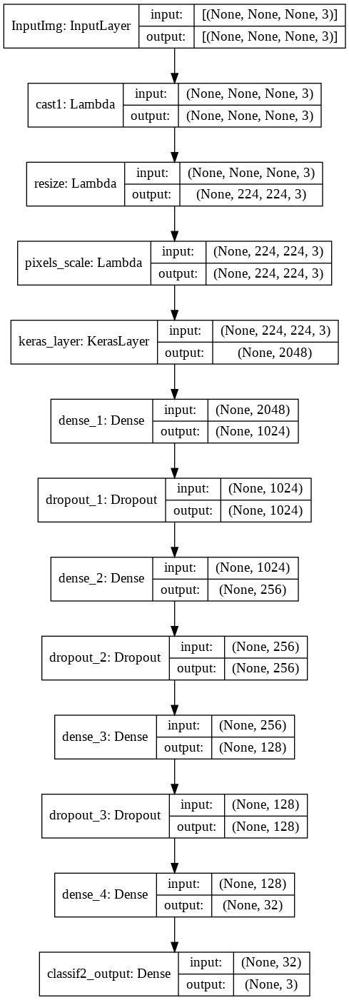

In [ ]:
tf.keras.utils.plot_model(model_classifier, show_shapes = True)

Sidenote: how to test a Keras layer separately

In [ ]:
#how it works - usin Keras Functional API, we build a small model with input and the layer to test

inp_ = tf.keras.layers.Input((None, None, 3))

#the layer we want to test, whose functionality is: "The inputs pixel values are scaled between -1 and 1, sample-wise."(docs)
outp_ = tf.keras.applications.resnet_v2.preprocess_input(inp_)

model_ = tf.keras.Model(inp_, outp_)

#-----------------------------------

#explicitly placement on cpu
with tf.device("/cpu:0"):
    #generate tensor with random values
    tf_random_gen = tf.random.Generator.from_seed(seed=234)
    tens_inp =  tf_random_gen.uniform(shape = [500, 400, 3], minval=0, maxval=255, dtype=tf.int32)

    print("input tensor:", tens_inp.shape, tens_inp.dtype)
    print(tens_inp[0][0:20])

    print("----------------------------------------------------")

    result_ = model_.predict(tens_inp)

    print("output tensor:", result_.shape, result_.dtype)
    print(result_[0][0:20])

input tensor: (500, 400, 3) <dtype: 'int32'>
tf.Tensor(
[[199 190  67]
 [245 119 130]
 [ 50  21  49]
 [190 177  63]
 [169 247 226]
 [199 124 176]
 [175 206 233]
 [122  69 120]
 [190 208 182]
 [ 14  25  42]
 [116  98 178]
 [175 214 162]
 [ 70 145  71]
 [135 166 209]
 [226 160 193]
 [181 252 187]
 [  8  73 242]
 [ 71 193 171]
 [100 201  37]
 [220 154 218]], shape=(20, 3), dtype=int32)
----------------------------------------------------
output tensor: (500, 400, 3) float32
[[ 0.56078446  0.4901961  -0.47450978]
 [ 0.92156875 -0.0666666   0.0196079 ]
 [-0.6078431  -0.8352941  -0.61568624]
 [ 0.4901961   0.38823533 -0.5058823 ]
 [ 0.32549024  0.937255    0.77254915]
 [ 0.56078446 -0.02745092  0.3803922 ]
 [ 0.37254906  0.6156864   0.8274511 ]
 [-0.04313719 -0.4588235  -0.05882347]
 [ 0.4901961   0.6313727   0.427451  ]
 [-0.8901961  -0.8039216  -0.67058825]
 [-0.09019601 -0.23137248  0.39607847]
 [ 0.37254906  0.6784315   0.27058828]
 [-0.45098037  0.13725495 -0.44313723]
 [ 0.05882359  0.

In [ ]:
#how it works - usin Keras Functional API, we build a small model with input and the layer to test

inp_ = tf.keras.layers.Input((None, None, 3))

#the layer we want to test
#note: here we use linear activation, i.e. f(x)=x, but in the model we use relu, i.e. f(x) = max(0,x)
outp_ = tf.keras.layers.Dense(units = 100, activation = "linear", kernel_initializer="glorot_uniform")(inp_)

model_ = tf.keras.Model(inp_, outp_)

#-----------------------------------

#explicitly placement on cpu
with tf.device("/cpu:0"):
    #generate tensor with random values
    tf_random_gen = tf.random.Generator.from_seed(seed=234)
    tens_inp =  tf_random_gen.uniform(shape = [500, 400, 3], minval=0, maxval=255, dtype=tf.int32)

    print("input tensor:", tens_inp.shape, tens_inp.dtype)
    print(tens_inp[0][0:20])

    print("----------------------------------------------------")

    result_ = model_.predict(tens_inp)

    print("output tensor:", result_.shape, result_.dtype)
    print(result_[0][0:20])

input tensor: (500, 400, 3) <dtype: 'int32'>
tf.Tensor(
[[199 190  67]
 [245 119 130]
 [ 50  21  49]
 [190 177  63]
 [169 247 226]
 [199 124 176]
 [175 206 233]
 [122  69 120]
 [190 208 182]
 [ 14  25  42]
 [116  98 178]
 [175 214 162]
 [ 70 145  71]
 [135 166 209]
 [226 160 193]
 [181 252 187]
 [  8  73 242]
 [ 71 193 171]
 [100 201  37]
 [220 154 218]], shape=(20, 3), dtype=int32)
----------------------------------------------------
output tensor: (500, 400, 100) float32
[[ -6.273718   -50.147034    -8.331374   ...  22.559452    44.433884
   69.94297   ]
 [ -7.81212    -29.329462    24.107195   ...  13.684178    35.219852
   68.996704  ]
 [  0.52291226  -2.1239288    8.889426   ...   0.31654984   6.3728304
   17.331108  ]
 ...
 [ 17.82551    -25.555517   -12.2765255  ...   3.870528    34.65513
   78.82649   ]
 [  1.6435139  -48.43004    -29.096636   ...  19.662474    39.64704
   59.179844  ]
 [  5.1463075  -22.843088    24.63637    ...   6.2085576   38.144737
   90.366806  ]]


## Training

### Configurations files

#### For image generator

In [ ]:
%%writefile /tmp/imagegenerator_config1.yml
brightness: 
  min: 0.8
  max: 1.2
shift:
  vertical: 0.1
  horizontal: 0.1
flip:
  vertical: no
  horizontal: yes
batch_size: 8

Overwriting /tmp/imagegenerator_config1.yml


In [ ]:
%%writefile /tmp/imagegenerator_config2.yml
brightness: 
  min: 0.8
  max: 1.2
shift:
  vertical: 0.1
  horizontal: 0.1
flip:
  vertical: no
  horizontal: yes
batch_size: 16

Writing /tmp/imagegenerator_config2.yml


In [ ]:
%%writefile /tmp/imagegenerator_config3.yml
brightness: 
  min: 0.8
  max: 1.2
shift:
  vertical: 0.1
  horizontal: 0.1
flip:
  vertical: no
  horizontal: yes
batch_size: 4

Writing /tmp/imagegenerator_config3.yml


In [ ]:
%%writefile /tmp/imagegenerator_config4.yml
brightness: 
  min: 0.8
  max: 1.2
shift:
  vertical: 0.1
  horizontal: 0.1
flip:
  vertical: no
  horizontal: no
batch_size: 8

Writing /tmp/imagegenerator_config4.yml


#### For learning rate schedule 

In [ ]:
%%writefile /tmp/lrschedule_config1.yml
schedule_stage1: 
  epoch_start: 5
  learning_rate: 0.001 
schedule_stage2: 
  epoch_start: 15
  learning_rate: 0.0001

Overwriting /tmp/lrschedule_config1.yml


In [ ]:
%%writefile /tmp/lrschedule_config2.yml
schedule_stage1: 
  epoch_start: 10
  learning_rate: 0.001 
schedule_stage2: 
  epoch_start: 35
  learning_rate: 0.0001

Writing /tmp/lrschedule_config2.yml


#### For model architecture

In [ ]:
%%writefile /tmp/model_config1.yml
pretrained_module:
  architecture: "resnet_v2_50"
  source: "tfhub"

classification_head:
    layer1:
      layer_type: "Dense"
      layer_units: 1024
      layer_activation : "relu"
      layer_name: "dense_1"
    dropout1: 
      layer_type: "Dropout"
      dropout_rate: 0.2
      layer_name: "dropout_1"
    layer2:
      layer_type: "Dense"
      layer_units: 256
      layer_activation : "relu"
      layer_name: "dense_2"
    dropout2: 
      layer_type: "Dropout"
      dropout_rate: 0.2
      layer_name: "dropout_2"
    layer3:
      layer_type: "Dense"
      layer_units: 128
      layer_activation : "relu"
      layer_name: "dense_3"
    dropout3: 
      layer_type: "Dropout"
      dropout_rate: 0.2
      layer_name: "dropout_3"
    layer4:
      layer_type: "Dense"
      layer_units: 32
      layer_activation : "relu"
      layer_name: "dense_4"

optimizer: "adamax"
init_lr: 0.01

Overwriting /tmp/model_config1.yml


In [ ]:
%%writefile /tmp/model_config2.yml
pretrained_module:
  architecture: "resnet_v2_50"
  source: "app"
  num_trainable_layers: 0

classification_head:
    layer1:
      layer_type: "Dense"
      layer_units: 1024
      layer_activation : "relu"
      layer_name: "dense_1"
    dropout1: 
      layer_type: "Dropout"
      dropout_rate: 0.2
      layer_name: "dropout_1"
    layer2:
      layer_type: "Dense"
      layer_units: 256
      layer_activation : "relu"
      layer_name: "dense_2"
    dropout2: 
      layer_type: "Dropout"
      dropout_rate: 0.2
      layer_name: "dropout_2"
    layer3:
      layer_type: "Dense"
      layer_units: 128
      layer_activation : "relu"
      layer_name: "dense_3"
    dropout3: 
      layer_type: "Dropout"
      dropout_rate: 0.2
      layer_name: "dropout_3"
    layer4:
      layer_type: "Dense"
      layer_units: 32
      layer_activation : "relu"
      layer_name: "dense_4"

optimizer: "adamax"
init_lr: 0.01

Writing /tmp/model_config2.yml


In [ ]:
%%writefile /tmp/model_config2b.yml
pretrained_module:
  architecture: "resnet_v2_50"
  source: "app"
  num_trainable_layers: 10

classification_head:
    layer1:
      layer_type: "Dense"
      layer_units: 1024
      layer_activation : "relu"
      layer_name: "dense_1"
    dropout1: 
      layer_type: "Dropout"
      dropout_rate: 0.2
      layer_name: "dropout_1"
    layer2:
      layer_type: "Dense"
      layer_units: 256
      layer_activation : "relu"
      layer_name: "dense_2"
    dropout2: 
      layer_type: "Dropout"
      dropout_rate: 0.2
      layer_name: "dropout_2"
    layer3:
      layer_type: "Dense"
      layer_units: 128
      layer_activation : "relu"
      layer_name: "dense_3"
    dropout3: 
      layer_type: "Dropout"
      dropout_rate: 0.2
      layer_name: "dropout_3"
    layer4:
      layer_type: "Dense"
      layer_units: 32
      layer_activation : "relu"
      layer_name: "dense_4"

optimizer: "adamax"
init_lr: 0.001


Writing /tmp/model_config2b.yml


In [ ]:
%%writefile /tmp/model_config3.yml
pretrained_module:
  architecture: "resnet_v2_50"
  source: "tfhub"

classification_head:
    layer1:
      layer_type: "Dense"
      layer_units: 1024
      layer_activation : "relu"
      layer_name: "dense_1"
    dropout1: 
      layer_type: "Dropout"
      dropout_rate: 0.2
      layer_name: "dropout_1"
    layer2:
      layer_type: "Dense"
      layer_units: 256
      layer_activation : "relu"
      layer_name: "dense_2"
    dropout2: 
      layer_type: "Dropout"
      dropout_rate: 0.2
      layer_name: "dropout_2"
    layer3:
      layer_type: "Dense"
      layer_units: 128
      layer_activation : "relu"
      layer_name: "dense_3"
    dropout3: 
      layer_type: "Dropout"
      dropout_rate: 0.2
      layer_name: "dropout_3"
    layer4:
      layer_type: "Dense"
      layer_units: 32
      layer_activation : "relu"
      layer_name: "dense_4"

optimizer: "adagrad"
init_lr: 0.01

Writing /tmp/model_config3.yml


In [ ]:
%%writefile /tmp/model_config4.yml
pretrained_module:
  architecture: "resnet_v2_50"
  source: "tfhub"

classification_head:
    layer1:
      layer_type: "Dense"
      layer_units: 1024
      layer_activation : "relu"
      layer_name: "dense_1"
    dropout1: 
      layer_type: "Dropout"
      dropout_rate: 0.2
      layer_name: "dropout_1"
    layer2:
      layer_type: "Dense"
      layer_units: 256
      layer_activation : "relu"
      layer_name: "dense_2"
    dropout2: 
      layer_type: "Dropout"
      dropout_rate: 0.2
      layer_name: "dropout_2"
    layer3:
      layer_type: "Dense"
      layer_units: 128
      layer_activation : "relu"
      layer_name: "dense_3"
    dropout3: 
      layer_type: "Dropout"
      dropout_rate: 0.2
      layer_name: "dropout_3"
    layer4:
      layer_type: "Dense"
      layer_units: 32
      layer_activation : "relu"
      layer_name: "dense_4"

optimizer: "adadelta"
init_lr: 0.01

Writing /tmp/model_config4.yml


In [ ]:
%%writefile /tmp/model_config5.yml
pretrained_module:
  architecture: "inceptionv3"
  source: "tfhub"

classification_head:
    layer1:
      layer_type: "Dense"
      layer_units: 1024
      layer_activation : "relu"
      layer_name: "dense_1"
    dropout1: 
      layer_type: "Dropout"
      dropout_rate: 0.2
      layer_name: "dropout_1"
    layer2:
      layer_type: "Dense"
      layer_units: 256
      layer_activation : "relu"
      layer_name: "dense_2"
    dropout2: 
      layer_type: "Dropout"
      dropout_rate: 0.2
      layer_name: "dropout_2"
    layer3:
      layer_type: "Dense"
      layer_units: 128
      layer_activation : "relu"
      layer_name: "dense_3"
    dropout3: 
      layer_type: "Dropout"
      dropout_rate: 0.2
      layer_name: "dropout_3"
    layer4:
      layer_type: "Dense"
      layer_units: 32
      layer_activation : "relu"
      layer_name: "dense_4"

optimizer: "adamax"
init_lr: 0.01

Writing /tmp/model_config5.yml


In [ ]:
%%writefile /tmp/model_config6.yml
pretrained_module:
  architecture: "inception_resnet_v2"
  source: "tfhub"

classification_head:
    layer1:
      layer_type: "Dense"
      layer_units: 1024
      layer_activation : "relu"
      layer_name: "dense_1"
    dropout1: 
      layer_type: "Dropout"
      dropout_rate: 0.2
      layer_name: "dropout_1"
    layer2:
      layer_type: "Dense"
      layer_units: 256
      layer_activation : "relu"
      layer_name: "dense_2"
    dropout2: 
      layer_type: "Dropout"
      dropout_rate: 0.2
      layer_name: "dropout_2"
    layer3:
      layer_type: "Dense"
      layer_units: 128
      layer_activation : "relu"
      layer_name: "dense_3"
    dropout3: 
      layer_type: "Dropout"
      dropout_rate: 0.2
      layer_name: "dropout_3"
    layer4:
      layer_type: "Dense"
      layer_units: 32
      layer_activation : "relu"
      layer_name: "dense_4"

optimizer: "adamax"
init_lr: 0.01

Writing /tmp/model_config6.yml


In [ ]:
%%writefile /tmp/model_config7.yml
pretrained_module:
  architecture: "resnet_v2_50"
  source: "tfhub"

classification_head:
    layer1:
      layer_type: "Dense"
      layer_units: 512
      layer_activation : "relu"
      layer_name: "dense_1"
    dropout1: 
      layer_type: "Dropout"
      dropout_rate: 0.2
      layer_name: "dropout_1"
    layer2:
      layer_type: "Dense"
      layer_units: 128
      layer_activation : "relu"
      layer_name: "dense_2"
    dropout2: 
      layer_type: "Dropout"
      dropout_rate: 0.2
      layer_name: "dropout_2"
    layer3:
      layer_type: "Dense"
      layer_units: 32
      layer_activation : "relu"
      layer_name: "dense_3"

optimizer: "adamax"
init_lr: 0.01

Writing /tmp/model_config7.yml


In [ ]:
%%writefile /tmp/model_config8.yml
pretrained_module:
  architecture: "resnet_v2_50"
  source: "tfhub"

classification_head:
    layer1:
      layer_type: "Dense"
      layer_units: 512
      layer_activation : "relu"
      layer_name: "dense_1"
    dropout1: 
      layer_type: "Dropout"
      dropout_rate: 0.2
      layer_name: "dropout_1"
    layer2:
      layer_type: "Dense"
      layer_units: 64
      layer_activation : "relu"
      layer_name: "dense_2"


optimizer: "adamax"
init_lr: 0.01

Writing /tmp/model_config8.yml


In [ ]:
%%writefile /tmp/model_config9.yml
pretrained_module:
  architecture: "resnet_v2_50"
  source: "tfhub"

classification_head:
    layer1:
      layer_type: "Dense"
      layer_units: 1024
      layer_activation : "relu"
      layer_name: "dense_1"
    dropout1: 
      layer_type: "Dropout"
      dropout_rate: 0.2
      layer_name: "dropout_1"
    layer2:
      layer_type: "Dense"
      layer_units: 512
      layer_activation : "relu"
      layer_name: "dense_2"
    dropout2: 
      layer_type: "Dropout"
      dropout_rate: 0.2
      layer_name: "dropout_2"
    layer3:
      layer_type: "Dense"
      layer_units: 256
      layer_activation : "relu"
      layer_name: "dense_3"
    dropout3: 
      layer_type: "Dropout"
      dropout_rate: 0.2
      layer_name: "dropout_3"
    layer4:
      layer_type: "Dense"
      layer_units: 128
      layer_activation : "relu"
      layer_name: "dense_4"
    dropout4: 
      layer_type: "Dropout"
      dropout_rate: 0.2
      layer_name: "dropout_4"
    layer5:
      layer_type: "Dense"
      layer_units: 32
      layer_activation : "relu"
      layer_name: "dense_5"

optimizer: "adamax"
init_lr: 0.01

Writing /tmp/model_config9.yml


In [ ]:
%%writefile /tmp/model_config10.yml
pretrained_module:
  architecture: "resnet_v2_50"
  source: "tfhub"

classification_head:
    layer1:
      layer_type: "Dense"
      layer_units: 1024
      layer_activation : "elu"
      layer_name: "dense_1"
    dropout1: 
      layer_type: "Dropout"
      dropout_rate: 0.2
      layer_name: "dropout_1"
    layer2:
      layer_type: "Dense"
      layer_units: 256
      layer_activation : "elu"
      layer_name: "dense_2"
    dropout2: 
      layer_type: "Dropout"
      dropout_rate: 0.2
      layer_name: "dropout_2"
    layer3:
      layer_type: "Dense"
      layer_units: 128
      layer_activation : "elu"
      layer_name: "dense_3"
    dropout3: 
      layer_type: "Dropout"
      dropout_rate: 0.2
      layer_name: "dropout_3"
    layer4:
      layer_type: "Dense"
      layer_units: 32
      layer_activation : "elu"
      layer_name: "dense_4"

optimizer: "adamax"
init_lr: 0.01

Writing /tmp/model_config10.yml


In [ ]:
%%writefile /tmp/model_config11.yml
pretrained_module:
  architecture: "resnet_v2_50"
  source: "tfhub"

classification_head:
    layer1:
      layer_type: "Dense"
      layer_units: 1024
      layer_activation : "elu"
      layer_name: "dense_1"
    dropout1: 
      layer_type: "Dropout"
      dropout_rate: 0.2
      layer_name: "dropout_1"
    layer2:
      layer_type: "Dense"
      layer_units: 256
      layer_activation : "elu"
      layer_name: "dense_2"
    dropout2: 
      layer_type: "Dropout"
      dropout_rate: 0.2
      layer_name: "dropout_2"
    layer3:
      layer_type: "Dense"
      layer_units: 128
      layer_activation : "elu"
      layer_name: "dense_3"
    dropout3: 
      layer_type: "Dropout"
      dropout_rate: 0.2
      layer_name: "dropout_3"
    layer4:
      layer_type: "Dense"
      layer_units: 32
      layer_activation : "elu"
      layer_name: "dense_4"

optimizer: "adagrad"
init_lr: 0.01

Overwriting /tmp/model_config11.yml


In [ ]:
%%writefile /tmp/model_config12.yml
pretrained_module:
  architecture: "resnet_v2_50"
  source: "tfhub"

classification_head:
    layer1:
      layer_type: "Dense"
      layer_units: 1024
      layer_activation : "elu"
      layer_name: "dense_1"
    dropout1: 
      layer_type: "Dropout"
      dropout_rate: 0.2
      layer_name: "dropout_1"
    layer2:
      layer_type: "Dense"
      layer_units: 256
      layer_activation : "elu"
      layer_name: "dense_2"
    dropout2: 
      layer_type: "Dropout"
      dropout_rate: 0.2
      layer_name: "dropout_2"
    layer3:
      layer_type: "Dense"
      layer_units: 128
      layer_activation : "elu"
      layer_name: "dense_3"
    dropout3: 
      layer_type: "Dropout"
      dropout_rate: 0.2
      layer_name: "dropout_3"
    layer4:
      layer_type: "Dense"
      layer_units: 32
      layer_activation : "elu"
      layer_name: "dense_4"

optimizer: "adamax"
init_lr: 0.001

Writing /tmp/model_config12.yml


In [ ]:
%%writefile /tmp/model_config13.yml
pretrained_module:
  architecture: "resnet_v2_50"
  source: "tfhub"

classification_head:
    layer1:
      layer_type: "Dense"
      layer_units: 1024
      layer_activation : "relu"
      layer_name: "dense_1"
    dropout1: 
      layer_type: "Dropout"
      dropout_rate: 0.2
      layer_name: "dropout_1"
    layer2:
      layer_type: "Dense"
      layer_units: 256
      layer_activation : "relu"
      layer_name: "dense_2"
    dropout2: 
      layer_type: "Dropout"
      dropout_rate: 0.2
      layer_name: "dropout_2"
    layer3:
      layer_type: "Dense"
      layer_units: 128
      layer_activation : "relu"
      layer_name: "dense_3"
    dropout3: 
      layer_type: "Dropout"
      dropout_rate: 0.2
      layer_name: "dropout_3"
    layer4:
      layer_type: "Dense"
      layer_units: 32
      layer_activation : "relu"
      layer_name: "dense_4"

optimizer: "adamax"
init_lr: 0.001

Writing /tmp/model_config13.yml


### Functions for post-training plots

In [ ]:
def plot_losses_and_accuracy(hist):
    """plot the evolution of loss and val_loss"""
    
    fig, ax = plt.subplots(1, 4, figsize = (30, 6))
    ax[0].plot(hist.history['loss'])
    ax[1].plot(hist.history['Acc'], color = "red")
    ax[2].plot(hist.history['val_loss'])
    ax[3].plot(hist.history['val_Acc'], color = "red")

    ax[0].set_ylabel('loss')
    ax[0].set_xlabel('epoch')

    ax[1].set_ylabel('accuracy')
    ax[1].set_xlabel('epoch')

    ax[2].set_ylabel('val_loss')
    ax[2].set_xlabel('epoch')

    ax[3].set_ylabel('val_accuracy')
    ax[3].set_xlabel('epoch');

In [ ]:
def plots_per_class(hist):
    """plot the evolution of precision and recall per class"""
    
    fig, ax = plt.subplots(1, 3, figsize = (30, 6))
    ax[0].plot(hist.history['prec_culture'], color= "green", label= "precision")
    ax[0].plot(hist.history['rec_culture'], color= "orange", label= "recall")
    ax[0].set_title("culture")

    ax[1].plot(hist.history['prec_retail'], color= "green", label= "precision")
    ax[1].plot(hist.history['rec_retail'], color= "orange", label= "recall")
    ax[1].set_title("retail")

    ax[2].plot(hist.history['prec_tourism'], color= "green", label= "precision")
    ax[2].plot(hist.history['rec_tourism'], color= "orange", label= "recall")
    ax[2].set_title("tourism")

    ax[0].set_ylabel('ratio')
    ax[0].set_xlabel('epoch')
    ax[0].set_ylim(0,1)
    ax[0].legend()

    ax[1].set_ylabel('ratio')
    ax[1].set_xlabel('epoch')
    ax[1].set_ylim(0,1)
    ax[1].legend()

    ax[2].set_ylabel('ratio')
    ax[2].set_xlabel('epoch')
    ax[2].set_ylim(0,1)
    ax[2].legend();

**READING CLASS WEIGHTS**

In preamble of the experiments configs, we prepare a function to rearrange the possibly unsorted keys of class_weights

In [ ]:
%%writefile /tmp/aux1.yml
class_weights:
    retail: 3.0
    culture: 1.0
    tourism: 2.0

Writing /tmp/aux1.yml


In [ ]:
def prepare_classweights(dict_classweights):
    """reorganize a dict of weights by reordering the keys and converting to class ids"""
    #sort dict by keys (because the labels are also sorted in ohe)
    #the result will be a list of tuples [(k1,v1), (k2,v2), ...]
    list_classweights_sorted = sorted(dict_classweights.items(), key=lambda t: t[0]) 
    list_weights = [el[1] for el in list_classweights_sorted]
    dict_weights_ = dict(zip(range(num_classes), list_weights))
    return dict_weights_

In [ ]:
#test case

class TestPrepareClassweight(unittest.TestCase):

    config_file_yaml = "/tmp/experiment_config1.yml"

    def test1(self):
        """ test1 - test unordered"""
        config_file_yaml = "/tmp/aux1.yml"
        #loading config from YAML file
        with open(config_file_yaml) as f:    
            config = yaml.load(f)
        dict_classweights_expected = {0: 1.0, 1: 3.0, 2: 2.0}
        dict_classweights = prepare_classweights(config["class_weights"])
        self.assertEqual(dict_classweights, dict_classweights_expected)  


unittest.main(argv=[''], verbosity=1, exit=False)

......
----------------------------------------------------------------------
Ran 6 tests in 0.015s

OK


### Experiment 1

The experiment is also described in a YAML file, which includes, among others, the filepath of the json file with dataset metadata (annotated label, role, path) 

In [ ]:
%%writefile /tmp/experiment_config1.yml
experiment_id: "exp1"
experiment_description: "resnet50v2 with adamax optimizer and custom lrschedule"
data_annotations_with_roles: "/content/gdrive/My Drive/belle_epoque/labels_affiches_train_valid_test.json"                     
checkpoint_filepath: "/tmp/checkpoint_model1" 
monitored_metric_bestmodel: "val_Acc"
objective: "max"

yaml_config_file_imagegen: "/tmp/imagegenerator_config1.yml"
yaml_config_file_model: "/tmp/model_config1.yml"
yaml_config_lrschedule: "/tmp/lrschedule_config1.yml"

captured_prints_filepath: "/tmp/captured_prints.txt"
num_epochs_training: 20

class_weights:
    retail: 1.0
    culture: 1.0
    tourism: 1.0

Writing /tmp/experiment_config1.yml


In [ ]:
def run_experiment(config_file_yaml, list_metrics):
    """ create and carry out training for an experiment described in yaml file. """


    #loading config from YAML file
    with open(config_file_yaml) as f:    
        config = yaml.load(f)

    print("RUNNING EXPERIMENT ", config["experiment_id"])
    print("EXPERIMENT DESCRIPTION: ", config["experiment_description"])

    #---------------------------ANNOTATED DATASET WITH ROLES-------------------------------

    df_train, df_valid, df_test = read_annotations_to_dataframe(json_filepath = config["data_annotations_with_roles"])


    #-------------------------- IMAGE GENERATOR FROM CONFIG ------------------------------------
    train_data_generator, valid_data_generator = create_augmented_image_generators(
                                                        df_train, df_valid,
                                                        config_file_yaml = config["yaml_config_file_imagegen"])
    
    num_steps_train = train_data_generator.samples//train_data_generator.batch_size
    num_steps_valid = valid_data_generator.samples//valid_data_generator.batch_size
    print(train_data_generator.samples, " samples --> ", num_steps_train, " steps per epoch")
    print(valid_data_generator.samples, " samples --> ", num_steps_valid, " steps per epoch")

    #-------------------------- CLASSES WEIGHTS ------------------------------------

    dict_weights_ = prepare_classweights(dict_classweights = config["class_weights"])
    print("Dictionary of classweights:", dict_weights_)

    #---------------------------OUR MODEL---------------------------------------
    model_classifier = build_classifier(config_file_yaml = config["yaml_config_file_model"],
                                        list_metrics = list_metrics)
    
    #-------------------------CALLBACKS ----------------------------------------
    list_callbacks = prepare_callbacks(**config, df_test = df_test)

    #--------------------------TRAINING ----------------------------------------
    #redirect all output to file
    try:
        os.remove(config["captured_prints_filepath"])
    except:
        pass
        
    with open(config["captured_prints_filepath"], 'a') as f:
        with contextlib.redirect_stdout(f):
            hist = model_classifier.fit_generator(
                        train_data_generator, 
                        epochs = config["num_epochs_training"],  
                        steps_per_epoch = num_steps_train,
                        validation_data = valid_data_generator,
                        validation_steps = num_steps_valid,
                        verbose = 1,
                        callbacks = list_callbacks,
                        class_weight = dict_weights_,
                        use_multiprocessing=False, 
                        shuffle = False,  #we already do shuffling on the imagegenerator
                        initial_epoch = 0
                    )
    
    #--------------------POST-TRAINING PLOTS-----------------------------------
    plot_losses_and_accuracy(hist)
    plots_per_class(hist)

RUNNING EXPERIMENT  exp1
EXPERIMENT DESCRIPTION:  resnet50v2 with adamax optimizer and custom lrschedule
role   label  
test   culture     37
       retail      32
       tourism     11
train  culture    567
       retail     478
       tourism    163
valid  culture    142
       retail     120
       tourism     41
Name: filename, dtype: int64
Found 1208 validated image filenames belonging to 3 classes.
Found 303 validated image filenames belonging to 3 classes.
1208  samples -->  151  steps per epoch
303  samples -->  37  steps per epoch
Dictionary of classweights: {0: 1.0, 1: 1.0, 2: 1.0}


/usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/engine/training.py:1844: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


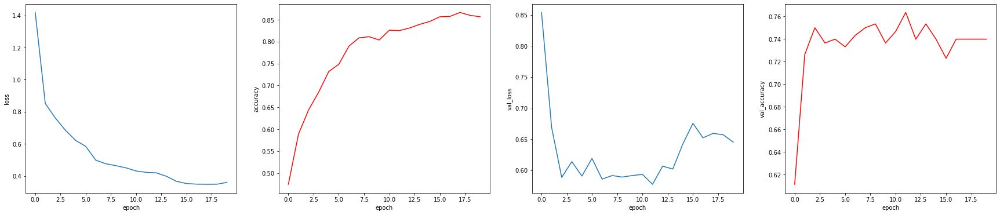

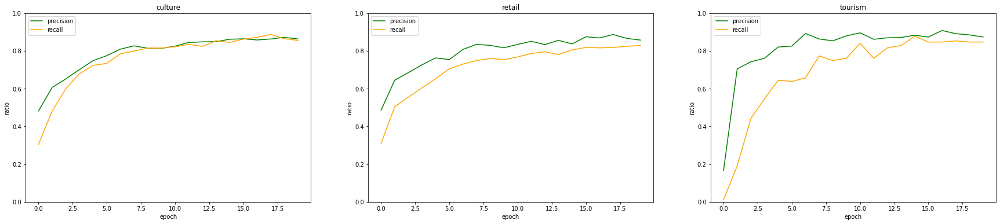

In [ ]:
run_experiment(config_file_yaml = "/tmp/experiment_config1.yml",                
               list_metrics = list_metrics)

**Inspect the artefacts:**

In [ ]:
#load pickled file
with open("/content/gdrive/My Drive/belle_epoque/experiments/exp1.pickle", 'rb') as f:
    dict_tracking = pickle.load(f)
pprint.pprint(dict_tracking)

{'best_epoch': 11,
 'captured_prints_filepath': '/tmp/captured_prints.txt',
 'checkpoint_filepath': '/tmp/checkpoint_model1',
 'class_weights': {},
 'experiment_id': 'exp1',
 'logs': {'Acc': 0.8253311514854431,
          'auc': 0.9505780339241028,
          'confussmatrix': array([[485.,  65.,  17.],
       [ 84., 385.,   9.],
       [ 25.,  11., 127.]]),
          'f1_macro': 0.819768488407135,
          'f1_micro': 0.8253312110900879,
          'loss': 0.42199957370758057,
          'prec_culture': 0.8446428775787354,
          'prec_retail': 0.8506787419319153,
          'prec_tourism': 0.8611111044883728,
          'rec_culture': 0.8342151641845703,
          'rec_retail': 0.7866109013557434,
          'rec_tourism': 0.7607361674308777,
          'val_Acc': 0.7635135054588318,
          'val_auc': 0.9110151529312134,
          'val_confussmatrix': array([[102.,  30.,   7.],
       [ 24.,  92.,   2.],
       [  3.,   4.,  32.]]),
          'val_f1_macro': 0.7717640995979309,
       

In [ ]:
s_filepath = dict_tracking["captured_prints_filepath"]
s_filepath

'/tmp/captured_prints.txt'

In [ ]:
%%bash -s $s_filepath
cat $1

Started training with learning rate: 0.009999999776482582  and will do changes according to schedule: {5: 0.001, 15: 0.0001}
Epoch 1/20
151/151 [==============================] - 696s 5s/step - loss: 2.7206 - Acc: 0.4428 - confussmatrix: 67.9942 - prec_culture: 0.4736 - rec_culture: 0.3094 - prec_retail: 0.4407 - rec_retail: 0.3417 - prec_tourism: 0.1597 - rec_tourism: 0.0380 - f1_micro: 0.4428 - f1_macro: 0.3435 - auc: 0.6217 - val_loss: 0.8540 - val_Acc: 0.6115 - val_confussmatrix: 32.8889 - val_prec_culture: 0.7350 - val_rec_culture: 0.6187 - val_prec_retail: 0.9630 - val_rec_retail: 0.2222 - val_prec_tourism: 0.0000e+00 - val_rec_tourism: 0.0000e+00 - val_f1_micro: 0.6115 - val_f1_macro: 0.4169 - val_auc: 0.8063

Epoch 00001: val_Acc improved from -inf to 0.61149, saving model to /tmp/checkpoint_model1
---------------------------------------------------------------
in callback confussion matrix on training data:
 [[342. 216.   9.]
 [239. 227.  12.]
 [107.  52.   4.]]
--------------

In [ ]:
s2_filepath = dict_tracking["checkpoint_filepath"]
s2_filepath

'/tmp/checkpoint_model1'

In [ ]:
%%bash -s $s2_filepath
tree du -h $1

du [error opening dir]
/tmp/checkpoint_model1
├── [4.0K]  assets
├── [2.4M]  saved_model.pb
└── [4.0K]  variables
    ├── [117M]  variables.data-00000-of-00001
    └── [ 23K]  variables.index

2 directories, 3 files


In [ ]:
FOLDER_BACKUP_CHECKPOINTS = "/content/gdrive/My Drive/belle_epoque/checkpoints_experiments/"
FOLDER_BACKUP_CONFIGS = "/content/gdrive/My Drive/belle_epoque/configs_experiments/"
FOLDER_BACKUP_PRINTS = "/content/gdrive/My Drive/belle_epoque/capturedprints_experiments/"

In [ ]:
%%bash -s "$FOLDER_BACKUP_CHECKPOINTS" "$FOLDER_BACKUP_CONFIGS" "$FOLDER_BACKUP_PRINTS"
mkdir -p "$1"
mkdir -p "$2"
mkdir -p "$3"

In [ ]:
def backup_experiment_artefacts(pickled_filepath):
    #load pickled file
    with open(pickled_filepath, 'rb') as f:
        dict_tracking = pickle.load(f)

    s_expid = dict_tracking["experiment_id"]
    s_ckpt = dict_tracking["checkpoint_filepath"]

    s_ig_yaml = dict_tracking['yaml_config_file_imagegen']
    s_m_yaml =  dict_tracking['yaml_config_file_model']
    s_lr_yaml = dict_tracking['yaml_config_lrschedule']

    s_prints = dict_tracking["captured_prints_filepath"]

    print("BACKUP for experiment:", s_expid)

    #create folders
    backup_path_ckpt = FOLDER_BACKUP_CHECKPOINTS + s_expid + "/"
    backup_path_config = FOLDER_BACKUP_CONFIGS + s_expid + "/"
    backup_path_prints = FOLDER_BACKUP_PRINTS + s_expid + "/"

    #os.mkdir(backup_path_ckpt)  #shouldn't be created
    os.mkdir(backup_path_config)
    os.mkdir(backup_path_prints)

    #copy files to backup locations
    print("Copying ",  s_ckpt)
    shutil.copytree(s_ckpt, backup_path_ckpt)

    print("Copying ",  s_prints)
    shutil.copyfile(src = s_prints, 
                    dst = backup_path_prints + s_prints.split("/")[-1])

    print("Copying ",  s_ig_yaml)
    shutil.copyfile(src = s_ig_yaml, 
                    dst = backup_path_config + s_ig_yaml.split("/")[-1])
    print("Copying ",  s_m_yaml)
    shutil.copyfile(src = s_m_yaml, 
                    dst = backup_path_config + s_m_yaml.split("/")[-1])

    if s_lr_yaml != "":
        print("Copying ",  s_lr_yaml)
        shutil.copyfile(src = s_lr_yaml, 
                        dst = backup_path_config + s_lr_yaml.split("/")[-1])



In [ ]:
backup_experiment_artefacts(pickled_filepath = "/content/gdrive/My Drive/belle_epoque/experiments/exp1.pickle")

BACKUP for experiment: exp1
Copying  /tmp/checkpoint_model1
Copying  /tmp/captured_prints.txt
Copying  /tmp/imagegenerator_config1.yml
Copying  /tmp/model_config1.yml
Copying  /tmp/lrschedule_config1.yml


---------

### Experiment 2

In [ ]:
%%writefile /tmp/experiment_config2.yml
experiment_id: "exp2"
experiment_description: "resnet50v2 with adamax optimizer and custom lrschedule, from keras apps"
data_annotations_with_roles: "/content/gdrive/My Drive/belle_epoque/labels_affiches_train_valid_test.json"                     
checkpoint_filepath: "/tmp/checkpoint_model2" 
monitored_metric_bestmodel: "val_Acc"
objective: "max"

yaml_config_file_imagegen: "/tmp/imagegenerator_config1.yml"
yaml_config_file_model: "/tmp/model_config2.yml"
yaml_config_lrschedule: "/tmp/lrschedule_config1.yml"

captured_prints_filepath: "/tmp/captured_prints2.txt"
num_epochs_training: 20

class_weights:
    retail: 1.0
    culture: 1.0
    tourism: 1.0

Overwriting /tmp/experiment_config2.yml


RUNNING EXPERIMENT  exp2
EXPERIMENT DESCRIPTION:  resnet50v2 with adamax optimizer and custom lrschedule, from keras apps
role   label  
test   culture     37
       retail      32
       tourism     11
train  culture    567
       retail     478
       tourism    163
valid  culture    142
       retail     120
       tourism     41
Name: filename, dtype: int64
Found 1208 validated image filenames belonging to 3 classes.
Found 303 validated image filenames belonging to 3 classes.
1208  samples -->  151  steps per epoch
303  samples -->  37  steps per epoch
Dictionary of classweights: {0: 1.0, 1: 1.0, 2: 1.0}


/usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/engine/training.py:1844: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


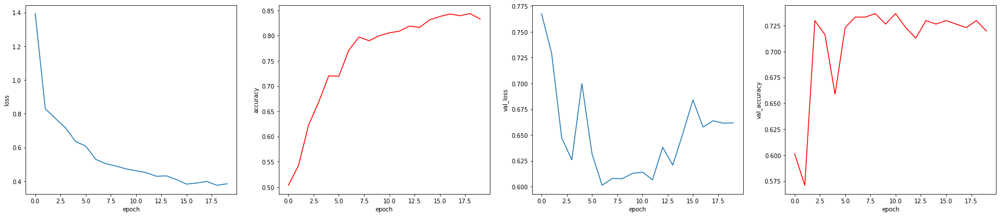

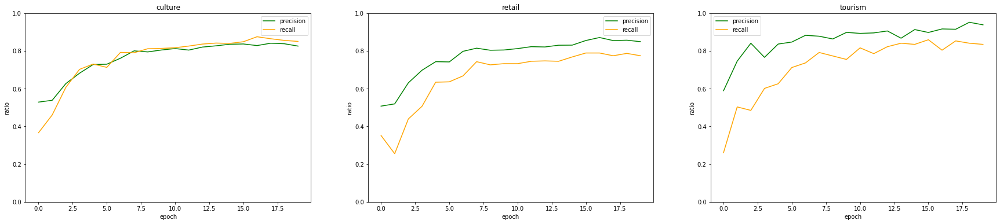

In [ ]:
run_experiment(config_file_yaml = "/tmp/experiment_config2.yml",                
               list_metrics = list_metrics)

In [ ]:
backup_experiment_artefacts(pickled_filepath = "/content/gdrive/My Drive/belle_epoque/experiments/exp2.pickle")

BACKUP for experiment: exp2
Copying  /tmp/checkpoint_model2
Copying  /tmp/captured_prints2.txt
Copying  /tmp/imagegenerator_config1.yml
Copying  /tmp/model_config2.yml
Copying  /tmp/lrschedule_config1.yml


---------

### Experiment 3

In [ ]:
%%writefile /tmp/experiment_config3.yml
experiment_id: "exp3"
experiment_description: "resnet50v2 with adagrad optimizer"
data_annotations_with_roles: "/content/gdrive/My Drive/belle_epoque/labels_affiches_train_valid_test.json"                     
checkpoint_filepath: "/tmp/checkpoint_model3" 
monitored_metric_bestmodel: "val_Acc"
objective: "max"

yaml_config_file_imagegen: "/tmp/imagegenerator_config1.yml"
yaml_config_file_model: "/tmp/model_config3.yml"
yaml_config_lrschedule: ""

captured_prints_filepath: "/tmp/captured_prints3.txt"
num_epochs_training: 20

class_weights:
    retail: 1.0
    culture: 1.0
    tourism: 1.0

Overwriting /tmp/experiment_config3.yml


RUNNING EXPERIMENT  exp3
EXPERIMENT DESCRIPTION:  resnet50v2 with adagrad optimizer
role   label  
test   culture     37
       retail      32
       tourism     11
train  culture    567
       retail     478
       tourism    163
valid  culture    142
       retail     120
       tourism     41
Name: filename, dtype: int64
Found 1208 validated image filenames belonging to 3 classes.
Found 303 validated image filenames belonging to 3 classes.
1208  samples -->  151  steps per epoch
303  samples -->  37  steps per epoch
Dictionary of classweights: {0: 1.0, 1: 1.0, 2: 1.0}


/usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/engine/training.py:1844: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


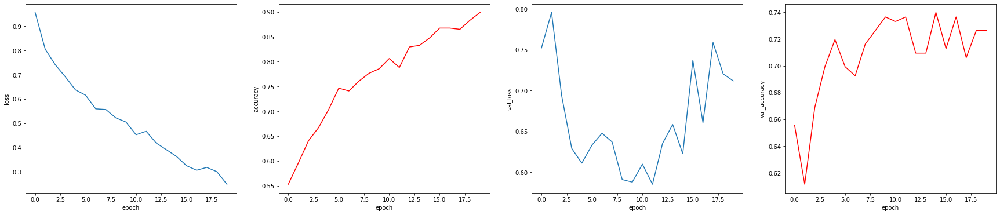

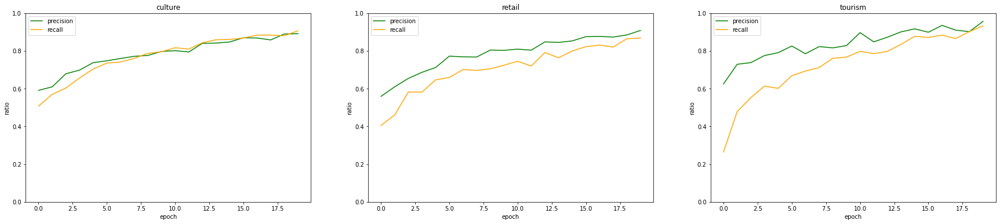

In [ ]:
run_experiment(config_file_yaml = "/tmp/experiment_config3.yml",                
               list_metrics = list_metrics)

In [ ]:
backup_experiment_artefacts(pickled_filepath = "/content/gdrive/My Drive/belle_epoque/experiments/exp3.pickle")

BACKUP for experiment: exp3
Copying  /tmp/checkpoint_model3
Copying  /tmp/captured_prints3.txt
Copying  /tmp/imagegenerator_config1.yml
Copying  /tmp/model_config3.yml


---------

### Experiment 4

In [ ]:
%%writefile /tmp/experiment_config4.yml
experiment_id: "exp4"
experiment_description: "resnet50v2 with adadelta optimizer"
data_annotations_with_roles: "/content/gdrive/My Drive/belle_epoque/labels_affiches_train_valid_test.json"                     
checkpoint_filepath: "/tmp/checkpoint_model4" 
monitored_metric_bestmodel: "val_Acc"
objective: "max"

yaml_config_file_imagegen: "/tmp/imagegenerator_config1.yml"
yaml_config_file_model: "/tmp/model_config4.yml"
yaml_config_lrschedule: ""

captured_prints_filepath: "/tmp/captured_prints4.txt"
num_epochs_training: 20

class_weights:
    retail: 1.0
    culture: 1.0
    tourism: 1.0

Writing /tmp/experiment_config4.yml


RUNNING EXPERIMENT  exp4
EXPERIMENT DESCRIPTION:  resnet50v2 with adadelta optimizer
role   label  
test   culture     37
       retail      32
       tourism     11
train  culture    567
       retail     478
       tourism    163
valid  culture    142
       retail     120
       tourism     41
Name: filename, dtype: int64
Found 1208 validated image filenames belonging to 3 classes.
Found 303 validated image filenames belonging to 3 classes.
1208  samples -->  151  steps per epoch
303  samples -->  37  steps per epoch
Dictionary of classweights: {0: 1.0, 1: 1.0, 2: 1.0}


/usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/engine/training.py:1844: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedM

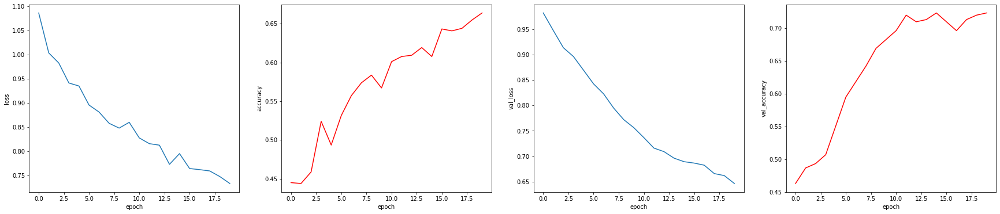

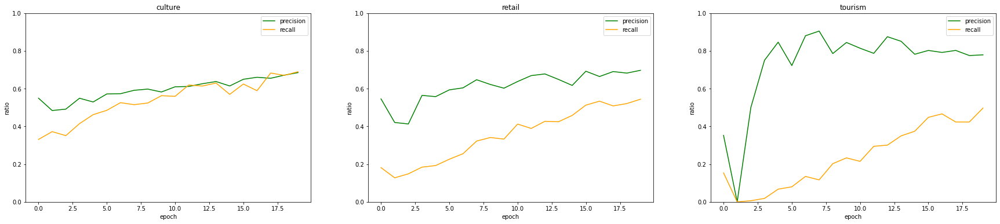

In [ ]:
run_experiment(config_file_yaml = "/tmp/experiment_config4.yml",                
               list_metrics = list_metrics)

In [ ]:
backup_experiment_artefacts(pickled_filepath = "/content/gdrive/My Drive/belle_epoque/experiments/exp4.pickle")

BACKUP for experiment: exp4
Copying  /tmp/checkpoint_model4
Copying  /tmp/captured_prints4.txt
Copying  /tmp/imagegenerator_config1.yml
Copying  /tmp/model_config4.yml


---------

### Experiment 5

In [ ]:
%%writefile /tmp/experiment_config5.yml
experiment_id: "exp5"
experiment_description: "inceptionv3 with adamax optimizer"
data_annotations_with_roles: "/content/gdrive/My Drive/belle_epoque/labels_affiches_train_valid_test.json"                     
checkpoint_filepath: "/tmp/checkpoint_model5" 
monitored_metric_bestmodel: "val_Acc"
objective: "max"

yaml_config_file_imagegen: "/tmp/imagegenerator_config1.yml"
yaml_config_file_model: "/tmp/model_config5.yml"
yaml_config_lrschedule: "/tmp/lrschedule_config1.yml"

captured_prints_filepath: "/tmp/captured_prints5.txt"
num_epochs_training: 20

class_weights:
    retail: 1.0
    culture: 1.0
    tourism: 1.0

Overwriting /tmp/experiment_config5.yml


RUNNING EXPERIMENT  exp5
EXPERIMENT DESCRIPTION:  inceptionv3 with adamax optimizer
role   label  
test   culture     37
       retail      32
       tourism     11
train  culture    567
       retail     478
       tourism    163
valid  culture    142
       retail     120
       tourism     41
Name: filename, dtype: int64
Found 1208 validated image filenames belonging to 3 classes.
Found 303 validated image filenames belonging to 3 classes.
1208  samples -->  151  steps per epoch
303  samples -->  37  steps per epoch
Dictionary of classweights: {0: 1.0, 1: 1.0, 2: 1.0}


/usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/engine/training.py:1844: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


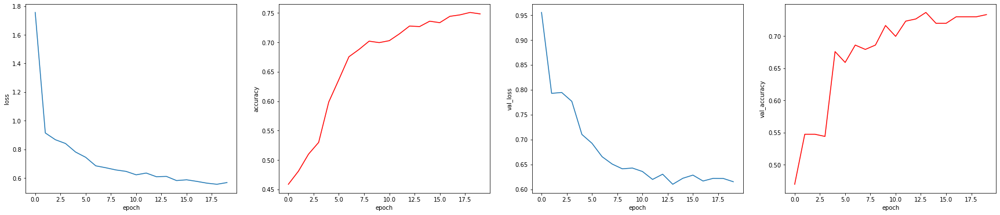

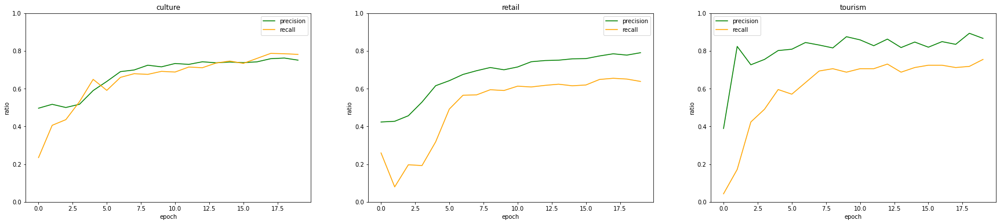

In [ ]:
run_experiment(config_file_yaml = "/tmp/experiment_config5.yml",                
               list_metrics = list_metrics)

In [ ]:
backup_experiment_artefacts(pickled_filepath = "/content/gdrive/My Drive/belle_epoque/experiments/exp5.pickle")

BACKUP for experiment: exp5
Copying  /tmp/checkpoint_model5
Copying  /tmp/captured_prints5.txt
Copying  /tmp/imagegenerator_config1.yml
Copying  /tmp/model_config5.yml
Copying  /tmp/lrschedule_config1.yml


------------------

### Experiment 6

In [ ]:
%%writefile /tmp/experiment_config6.yml
experiment_id: "exp6"
experiment_description: "inception_resnetv2 with adamax optimizer"
data_annotations_with_roles: "/content/gdrive/My Drive/belle_epoque/labels_affiches_train_valid_test.json"                     
checkpoint_filepath: "/tmp/checkpoint_model6" 
monitored_metric_bestmodel: "val_Acc"
objective: "max"

yaml_config_file_imagegen: "/tmp/imagegenerator_config1.yml"
yaml_config_file_model: "/tmp/model_config6.yml"
yaml_config_lrschedule: "/tmp/lrschedule_config1.yml"

captured_prints_filepath: "/tmp/captured_prints6.txt"
num_epochs_training: 20

class_weights:
    retail: 1.0
    culture: 1.0
    tourism: 1.0

Overwriting /tmp/experiment_config6.yml


RUNNING EXPERIMENT  exp6
EXPERIMENT DESCRIPTION:  inception_resnetv2 with adamax optimizer
role   label  
test   culture     37
       retail      32
       tourism     11
train  culture    567
       retail     478
       tourism    163
valid  culture    142
       retail     120
       tourism     41
Name: filename, dtype: int64
Found 1208 validated image filenames belonging to 3 classes.
Found 303 validated image filenames belonging to 3 classes.
1208  samples -->  151  steps per epoch
303  samples -->  37  steps per epoch
Dictionary of classweights: {0: 1.0, 1: 1.0, 2: 1.0}


/usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/engine/training.py:1844: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


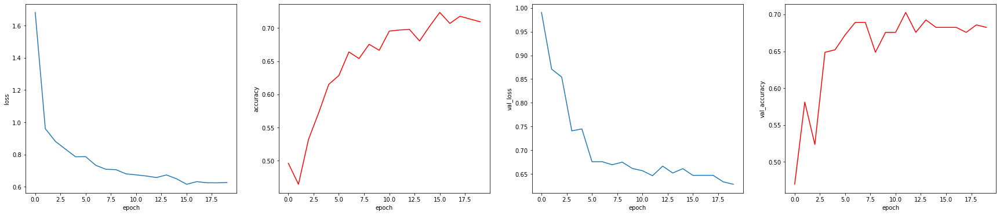

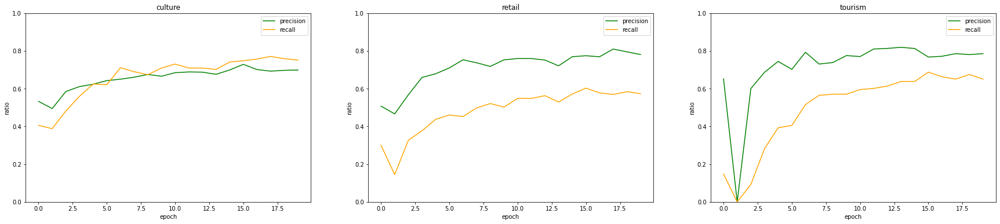

In [ ]:
run_experiment(config_file_yaml = "/tmp/experiment_config6.yml",                
               list_metrics = list_metrics)

In [ ]:
backup_experiment_artefacts(pickled_filepath = "/content/gdrive/My Drive/belle_epoque/experiments/exp6.pickle")

BACKUP for experiment: exp6
Copying  /tmp/checkpoint_model6
Copying  /tmp/captured_prints6.txt
Copying  /tmp/imagegenerator_config1.yml
Copying  /tmp/model_config6.yml
Copying  /tmp/lrschedule_config1.yml


--------------------------------

### Experiment 7

Now we experiment with unequal class weights.   


In [ ]:
%%writefile /tmp/experiment_config7.yml
experiment_id: "exp7"
experiment_description: "resnet50v2 with adamax optimizer, unequal class weights"
data_annotations_with_roles: "/content/gdrive/My Drive/belle_epoque/labels_affiches_train_valid_test.json"                     
checkpoint_filepath: "/tmp/checkpoint_model7" 
monitored_metric_bestmodel: "val_Acc"
objective: "max"

yaml_config_file_imagegen: "/tmp/imagegenerator_config1.yml"
yaml_config_file_model: "/tmp/model_config1.yml"
yaml_config_lrschedule: "/tmp/lrschedule_config1.yml"

captured_prints_filepath: "/tmp/captured_prints7.txt"
num_epochs_training: 20

class_weights:
    retail: 3.0
    tourism: 2.0
    culture: 1.0

Overwriting /tmp/experiment_config7.yml


RUNNING EXPERIMENT  exp7
EXPERIMENT DESCRIPTION:  resnet50v2 with adamax optimizer, unequal class weights
role   label  
test   culture     37
       retail      32
       tourism     11
train  culture    567
       retail     478
       tourism    163
valid  culture    142
       retail     120
       tourism     41
Name: filename, dtype: int64
Found 1208 validated image filenames belonging to 3 classes.
Found 303 validated image filenames belonging to 3 classes.
1208  samples -->  151  steps per epoch
303  samples -->  37  steps per epoch
Dictionary of classweights: {0: 1.0, 1: 3.0, 2: 2.0}


/usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/engine/training.py:1844: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


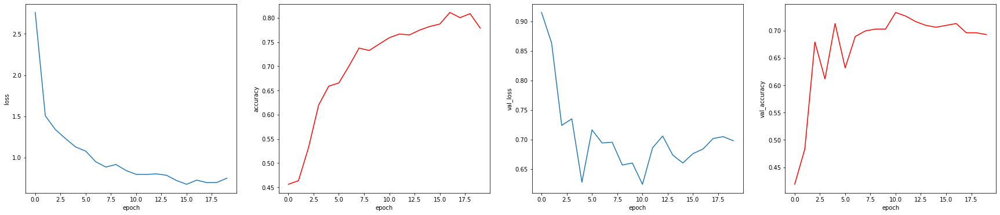

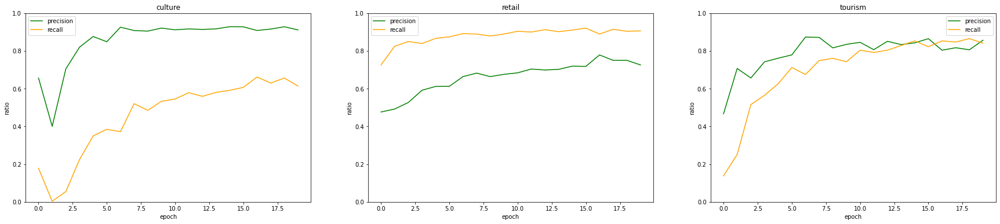

In [ ]:
run_experiment(config_file_yaml = "/tmp/experiment_config7.yml",                
               list_metrics = list_metrics)

In [ ]:
backup_experiment_artefacts(pickled_filepath = "/content/gdrive/My Drive/belle_epoque/experiments/exp7.pickle")

BACKUP for experiment: exp7
Copying  /tmp/checkpoint_model7
Copying  /tmp/captured_prints7.txt
Copying  /tmp/imagegenerator_config1.yml
Copying  /tmp/model_config1.yml
Copying  /tmp/lrschedule_config1.yml


--------------------------------

### Experiment 8

Now we experiment with unequal class weights.   


In [ ]:
%%writefile /tmp/experiment_config8.yml
experiment_id: "exp8"
experiment_description: "resnet50v2 with adamax optimizer, unequal class weights"
data_annotations_with_roles: "/content/gdrive/My Drive/belle_epoque/labels_affiches_train_valid_test.json"                     
checkpoint_filepath: "/tmp/checkpoint_model8" 
monitored_metric_bestmodel: "val_Acc"
objective: "max"

yaml_config_file_imagegen: "/tmp/imagegenerator_config1.yml"
yaml_config_file_model: "/tmp/model_config1.yml"
yaml_config_lrschedule: "/tmp/lrschedule_config1.yml"

captured_prints_filepath: "/tmp/captured_prints8.txt"
num_epochs_training: 20

class_weights:
    retail: 1.0
    tourism: 2.0
    culture: 3.0

Overwriting /tmp/experiment_config8.yml


RUNNING EXPERIMENT  exp8
EXPERIMENT DESCRIPTION:  resnet50v2 with adamax optimizer, unequal class weights
role   label  
test   culture     37
       retail      32
       tourism     11
train  culture    567
       retail     478
       tourism    163
valid  culture    142
       retail     120
       tourism     41
Name: filename, dtype: int64
Found 1208 validated image filenames belonging to 3 classes.
Found 303 validated image filenames belonging to 3 classes.
1208  samples -->  151  steps per epoch
303  samples -->  37  steps per epoch
Dictionary of classweights: {0: 3.0, 1: 1.0, 2: 2.0}


/usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/engine/training.py:1844: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedM

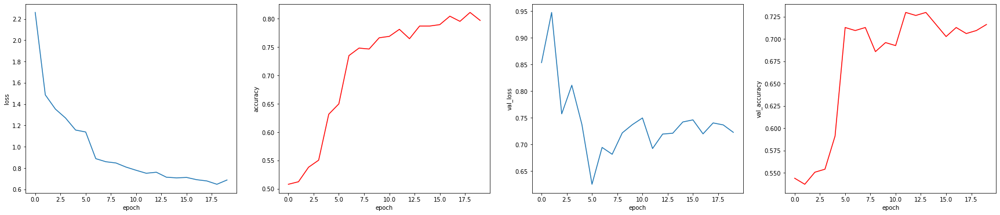

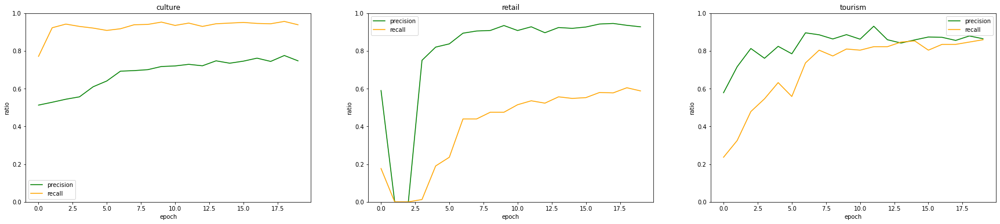

In [ ]:
run_experiment(config_file_yaml = "/tmp/experiment_config8.yml",                
               list_metrics = list_metrics)

In [ ]:
backup_experiment_artefacts(pickled_filepath = "/content/gdrive/My Drive/belle_epoque/experiments/exp8.pickle")

BACKUP for experiment: exp8
Copying  /tmp/checkpoint_model8
Copying  /tmp/captured_prints8.txt
Copying  /tmp/imagegenerator_config1.yml
Copying  /tmp/model_config1.yml
Copying  /tmp/lrschedule_config1.yml


--------------------------------

### Experiment 9

Now we experiment with equal class weights, but another learning rate scheduler.   


In [ ]:
%%writefile /tmp/experiment_config9.yml
experiment_id: "exp9"
experiment_description: "resnet50v2 with adamax optimizer, second lr schedule"
data_annotations_with_roles: "/content/gdrive/My Drive/belle_epoque/labels_affiches_train_valid_test.json"                     
checkpoint_filepath: "/tmp/checkpoint_model9" 
monitored_metric_bestmodel: "val_Acc"
objective: "max"

yaml_config_file_imagegen: "/tmp/imagegenerator_config1.yml"
yaml_config_file_model: "/tmp/model_config1.yml"
yaml_config_lrschedule: "/tmp/lrschedule_config2.yml"

captured_prints_filepath: "/tmp/captured_prints9.txt"
num_epochs_training: 50

class_weights:
    retail: 1.0
    tourism: 1.0
    culture: 1.0

Overwriting /tmp/experiment_config9.yml


RUNNING EXPERIMENT  exp9
EXPERIMENT DESCRIPTION:  resnet50v2 with adamax optimizer, second lr schedule
role   label  
test   culture     37
       retail      32
       tourism     11
train  culture    567
       retail     478
       tourism    163
valid  culture    142
       retail     120
       tourism     41
Name: filename, dtype: int64
Found 1208 validated image filenames belonging to 3 classes.
Found 303 validated image filenames belonging to 3 classes.
1208  samples -->  151  steps per epoch
303  samples -->  37  steps per epoch
Dictionary of classweights: {0: 1.0, 1: 1.0, 2: 1.0}


/usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/engine/training.py:1844: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


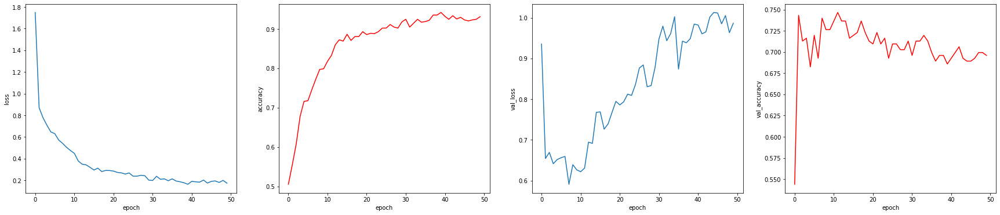

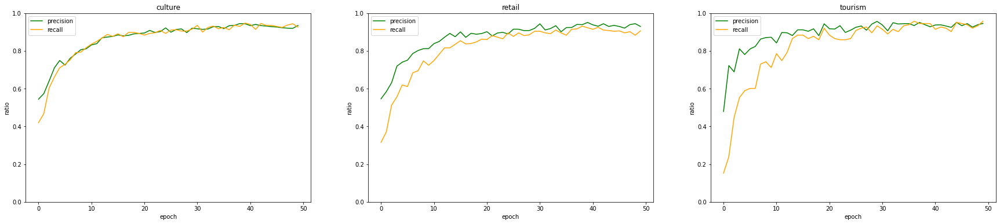

In [ ]:
run_experiment(config_file_yaml = "/tmp/experiment_config9.yml",                
               list_metrics = list_metrics)

In [ ]:
backup_experiment_artefacts(pickled_filepath = "/content/gdrive/My Drive/belle_epoque/experiments/exp9.pickle")

BACKUP for experiment: exp9
Copying  /tmp/checkpoint_model9
Copying  /tmp/captured_prints9.txt
Copying  /tmp/imagegenerator_config1.yml
Copying  /tmp/model_config1.yml
Copying  /tmp/lrschedule_config2.yml


--------------------------------

### Experiment 10

Now we experiment with larger batch size.   


In [ ]:
%%writefile /tmp/experiment_config10.yml
experiment_id: "exp10"
experiment_description: "resnet50v2 with adamax optimizer, larger batch size"
data_annotations_with_roles: "/content/gdrive/My Drive/belle_epoque/labels_affiches_train_valid_test.json"                     
checkpoint_filepath: "/tmp/checkpoint_model10" 
monitored_metric_bestmodel: "val_Acc"
objective: "max"

yaml_config_file_imagegen: "/tmp/imagegenerator_config2.yml"
yaml_config_file_model: "/tmp/model_config1.yml"
yaml_config_lrschedule: "/tmp/lrschedule_config1.yml"

captured_prints_filepath: "/tmp/captured_prints10.txt"
num_epochs_training: 20

class_weights:
    retail: 1.0
    tourism: 1.0
    culture: 1.0

Overwriting /tmp/experiment_config10.yml


RUNNING EXPERIMENT  exp10
EXPERIMENT DESCRIPTION:  resnet50v2 with adamax optimizer, larger batch size
role   label  
test   culture     37
       retail      32
       tourism     11
train  culture    567
       retail     478
       tourism    163
valid  culture    142
       retail     120
       tourism     41
Name: filename, dtype: int64
Found 1208 validated image filenames belonging to 3 classes.
Found 303 validated image filenames belonging to 3 classes.
1208  samples -->  75  steps per epoch
303  samples -->  18  steps per epoch
Dictionary of classweights: {0: 1.0, 1: 1.0, 2: 1.0}


/usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/engine/training.py:1844: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


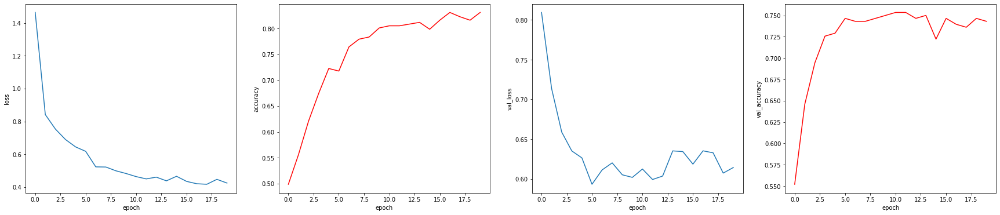

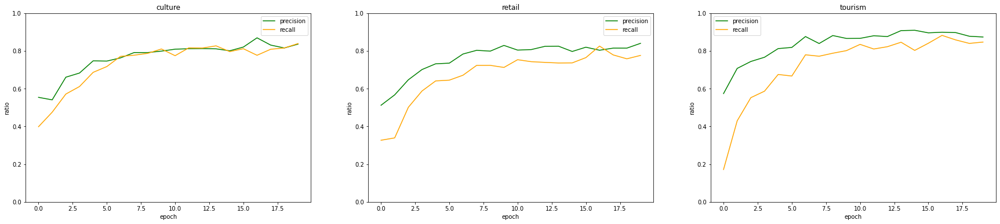

In [ ]:
run_experiment(config_file_yaml = "/tmp/experiment_config10.yml",                
               list_metrics = list_metrics)

In [ ]:
backup_experiment_artefacts(pickled_filepath = "/content/gdrive/My Drive/belle_epoque/experiments/exp10.pickle")

BACKUP for experiment: exp10
Copying  /tmp/checkpoint_model10
Copying  /tmp/captured_prints10.txt
Copying  /tmp/imagegenerator_config2.yml
Copying  /tmp/model_config1.yml
Copying  /tmp/lrschedule_config1.yml


--------------------------------

### Experiment 11

Now we experiment with smaller batch size.   


In [ ]:
%%writefile /tmp/experiment_config11.yml
experiment_id: "exp11"
experiment_description: "resnet50v2 with adamax optimizer, smaller batch size"
data_annotations_with_roles: "/content/gdrive/My Drive/belle_epoque/labels_affiches_train_valid_test.json"                     
checkpoint_filepath: "/tmp/checkpoint_model11" 
monitored_metric_bestmodel: "val_Acc"
objective: "max"

yaml_config_file_imagegen: "/tmp/imagegenerator_config3.yml"
yaml_config_file_model: "/tmp/model_config1.yml"
yaml_config_lrschedule: "/tmp/lrschedule_config1.yml"

captured_prints_filepath: "/tmp/captured_prints11.txt"
num_epochs_training: 20

class_weights:
    retail: 1.0
    tourism: 1.0
    culture: 1.0

Writing /tmp/experiment_config11.yml


RUNNING EXPERIMENT  exp11
EXPERIMENT DESCRIPTION:  resnet50v2 with adamax optimizer, smaller batch size
role   label  
test   culture     37
       retail      32
       tourism     11
train  culture    567
       retail     478
       tourism    163
valid  culture    142
       retail     120
       tourism     41
Name: filename, dtype: int64
Found 1208 validated image filenames belonging to 3 classes.
Found 303 validated image filenames belonging to 3 classes.
1208  samples -->  302  steps per epoch
303  samples -->  75  steps per epoch
Dictionary of classweights: {0: 1.0, 1: 1.0, 2: 1.0}


/usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/engine/training.py:1844: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


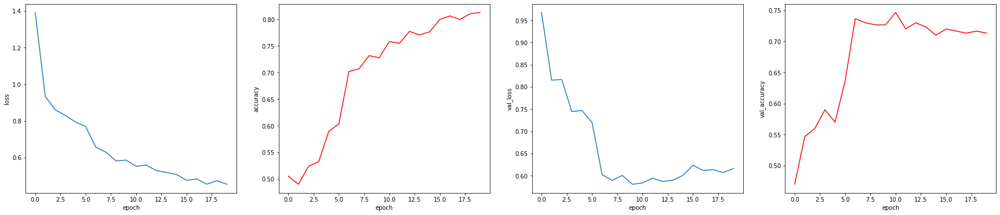

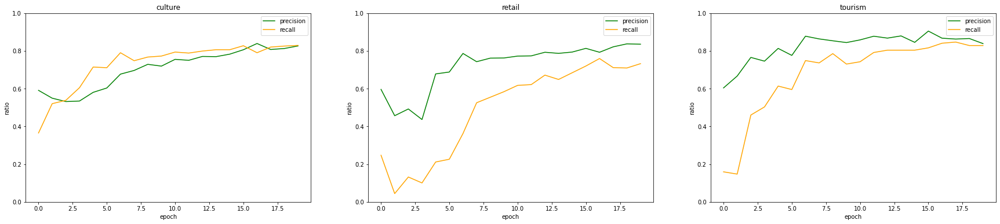

In [ ]:
run_experiment(config_file_yaml = "/tmp/experiment_config11.yml",                
               list_metrics = list_metrics)

In [ ]:
backup_experiment_artefacts(pickled_filepath = "/content/gdrive/My Drive/belle_epoque/experiments/exp11.pickle")

BACKUP for experiment: exp11
Copying  /tmp/checkpoint_model11
Copying  /tmp/captured_prints11.txt
Copying  /tmp/imagegenerator_config3.yml
Copying  /tmp/model_config1.yml
Copying  /tmp/lrschedule_config1.yml


--------------------------------

### Experiment 12

Now we experiment with a different classif head.   


In [ ]:
%%writefile /tmp/experiment_config12.yml
experiment_id: "exp12"
experiment_description: "resnet50v2 with adamax optimizer, shallower classif head"
data_annotations_with_roles: "/content/gdrive/My Drive/belle_epoque/labels_affiches_train_valid_test.json"                     
checkpoint_filepath: "/tmp/checkpoint_model12" 
monitored_metric_bestmodel: "val_Acc"
objective: "max"

yaml_config_file_imagegen: "/tmp/imagegenerator_config1.yml"
yaml_config_file_model: "/tmp/model_config7.yml"
yaml_config_lrschedule: "/tmp/lrschedule_config1.yml"

captured_prints_filepath: "/tmp/captured_prints12.txt"
num_epochs_training: 20

class_weights:
    retail: 1.0
    tourism: 1.0
    culture: 1.0

Writing /tmp/experiment_config12.yml


RUNNING EXPERIMENT  exp12
EXPERIMENT DESCRIPTION:  resnet50v2 with adamax optimizer, shallower classif head
role   label  
test   culture     37
       retail      32
       tourism     11
train  culture    567
       retail     478
       tourism    163
valid  culture    142
       retail     120
       tourism     41
Name: filename, dtype: int64
Found 1208 validated image filenames belonging to 3 classes.
Found 303 validated image filenames belonging to 3 classes.
1208  samples -->  151  steps per epoch
303  samples -->  37  steps per epoch
Dictionary of classweights: {0: 1.0, 1: 1.0, 2: 1.0}


/usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/engine/training.py:1844: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


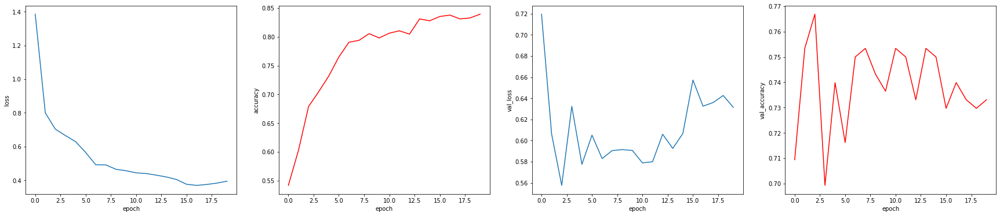

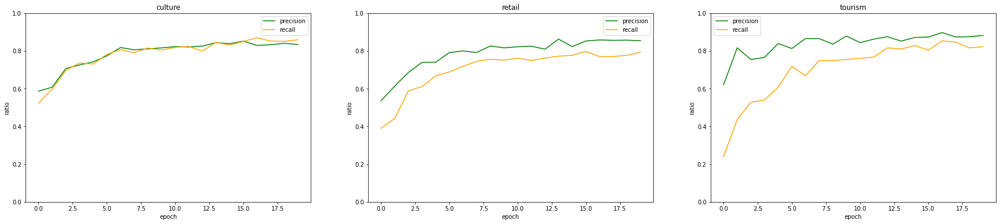

In [ ]:
run_experiment(config_file_yaml = "/tmp/experiment_config12.yml",                
               list_metrics = list_metrics)

In [ ]:
backup_experiment_artefacts(pickled_filepath = "/content/gdrive/My Drive/belle_epoque/experiments/exp12.pickle")

BACKUP for experiment: exp12
Copying  /tmp/checkpoint_model12
Copying  /tmp/captured_prints12.txt
Copying  /tmp/imagegenerator_config1.yml
Copying  /tmp/model_config7.yml
Copying  /tmp/lrschedule_config1.yml


--------------------------------

### Experiment 13

Now we experiment with a different classif head.   


In [ ]:
%%writefile /tmp/experiment_config13.yml
experiment_id: "exp13"
experiment_description: "resnet50v2 with adamax optimizer, shallower classif head"
data_annotations_with_roles: "/content/gdrive/My Drive/belle_epoque/labels_affiches_train_valid_test.json"                     
checkpoint_filepath: "/tmp/checkpoint_model13" 
monitored_metric_bestmodel: "val_Acc"
objective: "max"

yaml_config_file_imagegen: "/tmp/imagegenerator_config1.yml"
yaml_config_file_model: "/tmp/model_config8.yml"
yaml_config_lrschedule: "/tmp/lrschedule_config1.yml"

captured_prints_filepath: "/tmp/captured_prints13.txt"
num_epochs_training: 20

class_weights:
    retail: 1.0
    tourism: 1.0
    culture: 1.0

Overwriting /tmp/experiment_config13.yml


RUNNING EXPERIMENT  exp13
EXPERIMENT DESCRIPTION:  resnet50v2 with adamax optimizer, shallower classif head
role   label  
test   culture     37
       retail      32
       tourism     11
train  culture    567
       retail     478
       tourism    163
valid  culture    142
       retail     120
       tourism     41
Name: filename, dtype: int64
Found 1208 validated image filenames belonging to 3 classes.
Found 303 validated image filenames belonging to 3 classes.
1208  samples -->  151  steps per epoch
303  samples -->  37  steps per epoch
Dictionary of classweights: {0: 1.0, 1: 1.0, 2: 1.0}


/usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/engine/training.py:1844: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


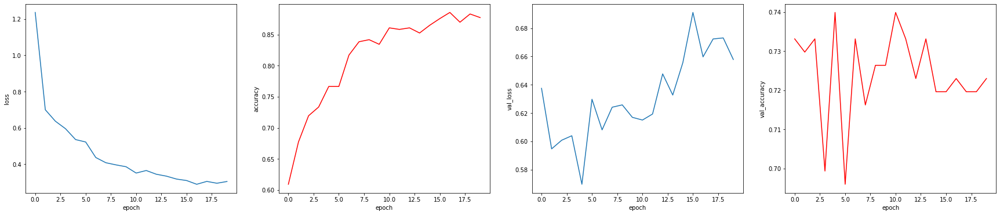

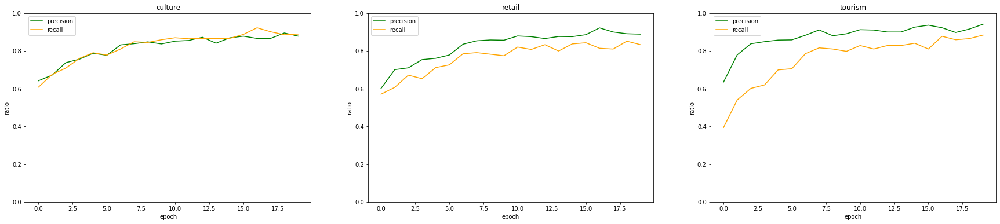

In [ ]:
run_experiment(config_file_yaml = "/tmp/experiment_config13.yml",                
               list_metrics = list_metrics)

In [ ]:
backup_experiment_artefacts(pickled_filepath = "/content/gdrive/My Drive/belle_epoque/experiments/exp13.pickle")

BACKUP for experiment: exp13
Copying  /tmp/checkpoint_model13
Copying  /tmp/captured_prints13.txt
Copying  /tmp/imagegenerator_config1.yml
Copying  /tmp/model_config8.yml
Copying  /tmp/lrschedule_config1.yml


---------------------------------

### Experiment 14

Now we experiment with deeper classification head.   


In [ ]:
%%writefile /tmp/experiment_config14.yml
experiment_id: "exp14"
experiment_description: "resnet50v2 with adamax optimizer, deeper classif head"
data_annotations_with_roles: "/content/gdrive/My Drive/belle_epoque/labels_affiches_train_valid_test.json"                     
checkpoint_filepath: "/tmp/checkpoint_model14" 
monitored_metric_bestmodel: "val_Acc"
objective: "max"

yaml_config_file_imagegen: "/tmp/imagegenerator_config1.yml"
yaml_config_file_model: "/tmp/model_config9.yml"
yaml_config_lrschedule: "/tmp/lrschedule_config1.yml"

captured_prints_filepath: "/tmp/captured_prints14.txt"
num_epochs_training: 20

class_weights:
    retail: 1.0
    tourism: 1.0
    culture: 1.0

Writing /tmp/experiment_config14.yml


RUNNING EXPERIMENT  exp14
EXPERIMENT DESCRIPTION:  resnet50v2 with adamax optimizer, deeper classif head
role   label  
test   culture     37
       retail      32
       tourism     11
train  culture    567
       retail     478
       tourism    163
valid  culture    142
       retail     120
       tourism     41
Name: filename, dtype: int64
Found 1208 validated image filenames belonging to 3 classes.
Found 303 validated image filenames belonging to 3 classes.
1208  samples -->  151  steps per epoch
303  samples -->  37  steps per epoch
Dictionary of classweights: {0: 1.0, 1: 1.0, 2: 1.0}


/usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/engine/training.py:1844: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


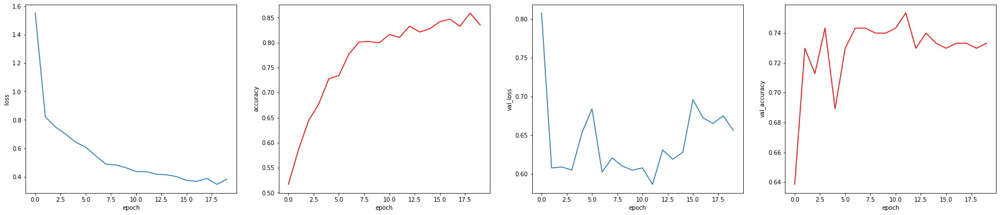

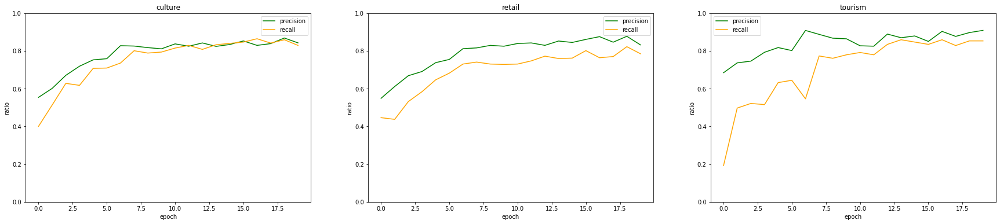

In [ ]:
run_experiment(config_file_yaml = "/tmp/experiment_config14.yml",                
               list_metrics = list_metrics)

In [ ]:
backup_experiment_artefacts(pickled_filepath = "/content/gdrive/My Drive/belle_epoque/experiments/exp14.pickle")

BACKUP for experiment: exp14
Copying  /tmp/checkpoint_model14
Copying  /tmp/captured_prints14.txt
Copying  /tmp/imagegenerator_config1.yml
Copying  /tmp/model_config9.yml
Copying  /tmp/lrschedule_config1.yml


--------------------------------

### Experiment 15

Now we experiment with a trainable layers in the pretrained model.   


In [ ]:
%%writefile /tmp/experiment_config15.yml
experiment_id: "exp15"
experiment_description: "resnet50v2 with adamax optimizer, trainable layers in pretrained model, constant lr"
data_annotations_with_roles: "/content/gdrive/My Drive/belle_epoque/labels_affiches_train_valid_test.json"                     
checkpoint_filepath: "/tmp/checkpoint_model15" 
monitored_metric_bestmodel: "val_Acc"
objective: "max"

yaml_config_file_imagegen: "/tmp/imagegenerator_config1.yml"
yaml_config_file_model: "/tmp/model_config2b.yml"
yaml_config_lrschedule: ""

captured_prints_filepath: "/tmp/captured_prints15.txt"
num_epochs_training: 20

class_weights:
    retail: 1.0
    tourism: 1.0
    culture: 1.0

Overwriting /tmp/experiment_config15.yml


RUNNING EXPERIMENT  exp15
EXPERIMENT DESCRIPTION:  resnet50v2 with adamax optimizer, trainable layers in pretrained model, constant lr
role   label  
test   culture     37
       retail      32
       tourism     11
train  culture    567
       retail     478
       tourism    163
valid  culture    142
       retail     120
       tourism     41
Name: filename, dtype: int64
Found 1208 validated image filenames belonging to 3 classes.
Found 303 validated image filenames belonging to 3 classes.
1208  samples -->  151  steps per epoch
303  samples -->  37  steps per epoch
Dictionary of classweights: {0: 1.0, 1: 1.0, 2: 1.0}


/usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/engine/training.py:1844: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


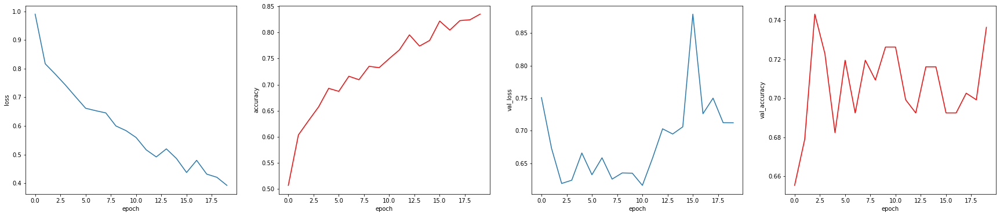

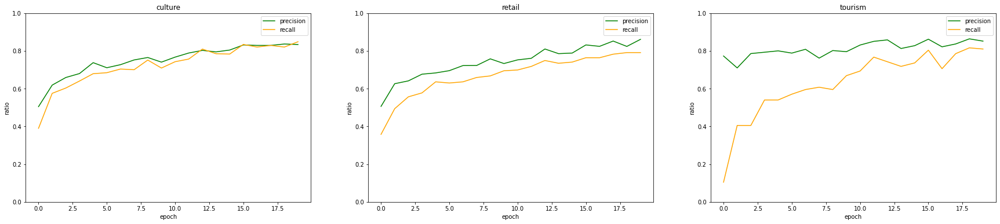

In [ ]:
run_experiment(config_file_yaml = "/tmp/experiment_config15.yml",                
               list_metrics = list_metrics)

In [ ]:
backup_experiment_artefacts(pickled_filepath = "/content/gdrive/My Drive/belle_epoque/experiments/exp15.pickle")

BACKUP for experiment: exp15
Copying  /tmp/checkpoint_model15
Copying  /tmp/captured_prints15.txt
Copying  /tmp/imagegenerator_config1.yml
Copying  /tmp/model_config2b.yml


----------------------------------

### Experiment 16

Now we experiment with augmentation without horizontal flip.   


In [ ]:
%%writefile /tmp/experiment_config16.yml
experiment_id: "exp16"
experiment_description: "resnet50v2 with adamax optimizer, no horizontal flip"
data_annotations_with_roles: "/content/gdrive/My Drive/belle_epoque/labels_affiches_train_valid_test.json"                     
checkpoint_filepath: "/tmp/checkpoint_model16" 
monitored_metric_bestmodel: "val_Acc"
objective: "max"

yaml_config_file_imagegen: "/tmp/imagegenerator_config4.yml"
yaml_config_file_model: "/tmp/model_config1.yml"
yaml_config_lrschedule: "/tmp/lrschedule_config1.yml"

captured_prints_filepath: "/tmp/captured_prints16.txt"
num_epochs_training: 20

class_weights:
    retail: 1.0
    tourism: 1.0
    culture: 1.0

Writing /tmp/experiment_config16.yml


RUNNING EXPERIMENT  exp16
EXPERIMENT DESCRIPTION:  resnet50v2 with adamax optimizer, no horizontal flip
role   label  
test   culture     37
       retail      32
       tourism     11
train  culture    567
       retail     478
       tourism    163
valid  culture    142
       retail     120
       tourism     41
Name: filename, dtype: int64
Found 1208 validated image filenames belonging to 3 classes.
Found 303 validated image filenames belonging to 3 classes.
1208  samples -->  151  steps per epoch
303  samples -->  37  steps per epoch
Dictionary of classweights: {0: 1.0, 1: 1.0, 2: 1.0}


/usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/engine/training.py:1844: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


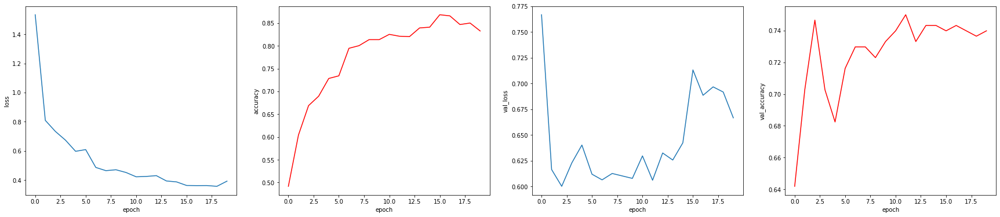

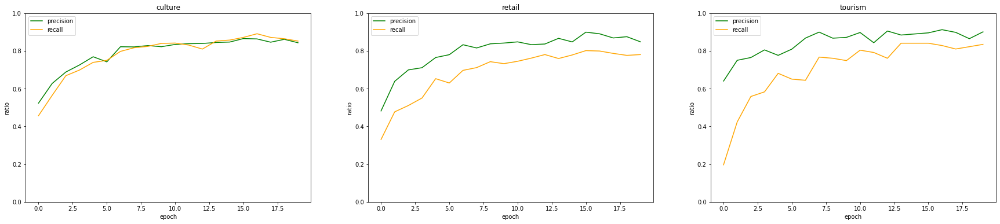

In [ ]:
run_experiment(config_file_yaml = "/tmp/experiment_config16.yml",                
               list_metrics = list_metrics)

In [ ]:
backup_experiment_artefacts(pickled_filepath = "/content/gdrive/My Drive/belle_epoque/experiments/exp16.pickle")

BACKUP for experiment: exp16
Copying  /tmp/checkpoint_model16
Copying  /tmp/captured_prints16.txt
Copying  /tmp/imagegenerator_config4.yml
Copying  /tmp/model_config1.yml
Copying  /tmp/lrschedule_config1.yml


----------------------------------

### Experiment 17

Now we experiment with elu activation(instead of relu) on the ense layers in the classif head.   


In [ ]:
%%writefile /tmp/experiment_config17.yml
experiment_id: "exp17"
experiment_description: "resnet50v2 with adamax optimizer, elu instead of relu"
data_annotations_with_roles: "/content/gdrive/My Drive/belle_epoque/labels_affiches_train_valid_test.json"                     
checkpoint_filepath: "/tmp/checkpoint_model17" 
monitored_metric_bestmodel: "val_Acc"
objective: "max"

yaml_config_file_imagegen: "/tmp/imagegenerator_config1.yml"
yaml_config_file_model: "/tmp/model_config10.yml"
yaml_config_lrschedule: "/tmp/lrschedule_config1.yml"

captured_prints_filepath: "/tmp/captured_prints17.txt"
num_epochs_training: 20

class_weights:
    retail: 1.0
    tourism: 1.0
    culture: 1.0

Writing /tmp/experiment_config17.yml


RUNNING EXPERIMENT  exp17
EXPERIMENT DESCRIPTION:  resnet50v2 with adamax optimizer, elu instead of relu
role   label  
test   culture     37
       retail      32
       tourism     11
train  culture    567
       retail     478
       tourism    163
valid  culture    142
       retail     120
       tourism     41
Name: filename, dtype: int64
Found 1208 validated image filenames belonging to 3 classes.
Found 303 validated image filenames belonging to 3 classes.
1208  samples -->  151  steps per epoch
303  samples -->  37  steps per epoch
Dictionary of classweights: {0: 1.0, 1: 1.0, 2: 1.0}


/usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/engine/training.py:1844: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


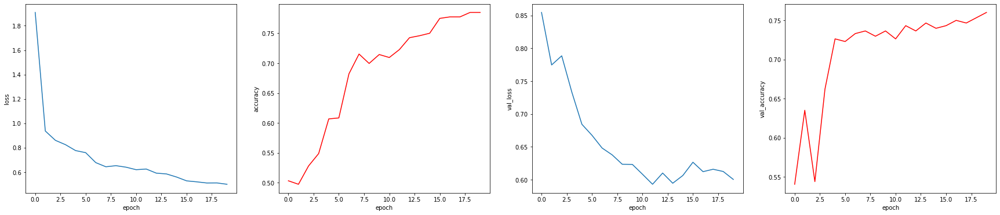

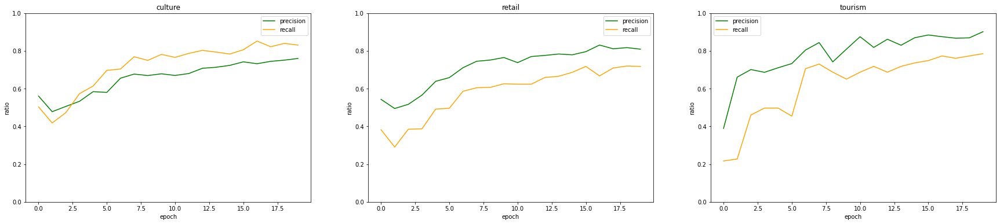

In [ ]:
run_experiment(config_file_yaml = "/tmp/experiment_config17.yml",                
               list_metrics = list_metrics)

In [ ]:
backup_experiment_artefacts(pickled_filepath = "/content/gdrive/My Drive/belle_epoque/experiments/exp17.pickle")

BACKUP for experiment: exp17
Copying  /tmp/checkpoint_model17
Copying  /tmp/captured_prints17.txt
Copying  /tmp/imagegenerator_config1.yml
Copying  /tmp/model_config10.yml
Copying  /tmp/lrschedule_config1.yml


----------------------------------

### Experiment 18

Now we experiment with elu activation(instead of relu) on the ense layers in the classif head.   


In [ ]:
%%writefile /tmp/experiment_config18.yml
experiment_id: "exp18"
experiment_description: "resnet50v2 with adagrad optimizer, elu instead of relu"
data_annotations_with_roles: "/content/gdrive/My Drive/belle_epoque/labels_affiches_train_valid_test.json"                     
checkpoint_filepath: "/tmp/checkpoint_model18" 
monitored_metric_bestmodel: "val_Acc"
objective: "max"

yaml_config_file_imagegen: "/tmp/imagegenerator_config1.yml"
yaml_config_file_model: "/tmp/model_config11.yml"
yaml_config_lrschedule: ""

captured_prints_filepath: "/tmp/captured_prints18.txt"
num_epochs_training: 20

class_weights:
    retail: 1.0
    tourism: 1.0
    culture: 1.0

Overwriting /tmp/experiment_config18.yml


RUNNING EXPERIMENT  exp18
EXPERIMENT DESCRIPTION:  resnet50v2 with adagrad optimizer, elu instead of relu
role   label  
test   culture     37
       retail      32
       tourism     11
train  culture    567
       retail     478
       tourism    163
valid  culture    142
       retail     120
       tourism     41
Name: filename, dtype: int64
Found 1208 validated image filenames belonging to 3 classes.
Found 303 validated image filenames belonging to 3 classes.
1208  samples -->  151  steps per epoch
303  samples -->  37  steps per epoch
Dictionary of classweights: {0: 1.0, 1: 1.0, 2: 1.0}


/usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/engine/training.py:1844: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


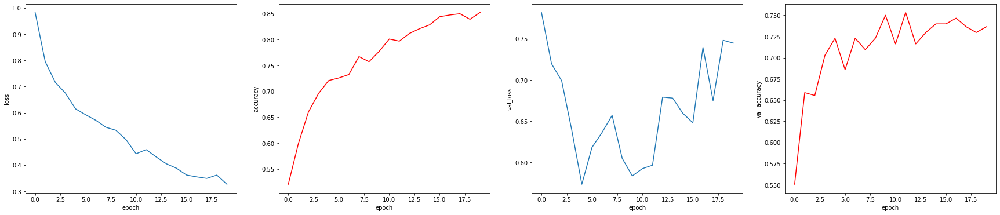

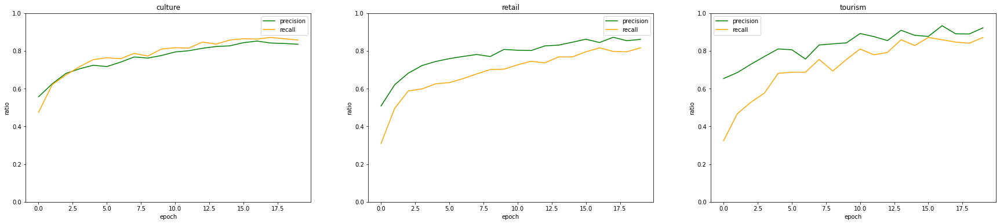

In [ ]:
run_experiment(config_file_yaml = "/tmp/experiment_config18.yml",                
               list_metrics = list_metrics)

In [ ]:
backup_experiment_artefacts(pickled_filepath = "/content/gdrive/My Drive/belle_epoque/experiments/exp18.pickle")

BACKUP for experiment: exp18
Copying  /tmp/checkpoint_model18
Copying  /tmp/captured_prints18.txt
Copying  /tmp/imagegenerator_config1.yml
Copying  /tmp/model_config11.yml


----------------------------------

### Experiment 19

Now we experiment with elu activation(instead of relu) on the ense layers in the classif head.   


In [ ]:
%%writefile /tmp/experiment_config19.yml
experiment_id: "exp19"
experiment_description: "resnet50v2 with adamax optimizer, elu instead of relu, constant lr"
data_annotations_with_roles: "/content/gdrive/My Drive/belle_epoque/labels_affiches_train_valid_test.json"                     
checkpoint_filepath: "/tmp/checkpoint_model19" 
monitored_metric_bestmodel: "val_Acc"
objective: "max"

yaml_config_file_imagegen: "/tmp/imagegenerator_config1.yml"
yaml_config_file_model: "/tmp/model_config12.yml"
yaml_config_lrschedule: ""

captured_prints_filepath: "/tmp/captured_prints19.txt"
num_epochs_training: 20

class_weights:
    retail: 1.0
    tourism: 1.0
    culture: 1.0

Writing /tmp/experiment_config19.yml


RUNNING EXPERIMENT  exp19
EXPERIMENT DESCRIPTION:  resnet50v2 with adamax optimizer, elu instead of relu, constant lr
role   label  
test   culture     37
       retail      32
       tourism     11
train  culture    567
       retail     478
       tourism    163
valid  culture    142
       retail     120
       tourism     41
Name: filename, dtype: int64
Found 1208 validated image filenames belonging to 3 classes.
Found 303 validated image filenames belonging to 3 classes.
1208  samples -->  151  steps per epoch
303  samples -->  37  steps per epoch
Dictionary of classweights: {0: 1.0, 1: 1.0, 2: 1.0}


/usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/engine/training.py:1844: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


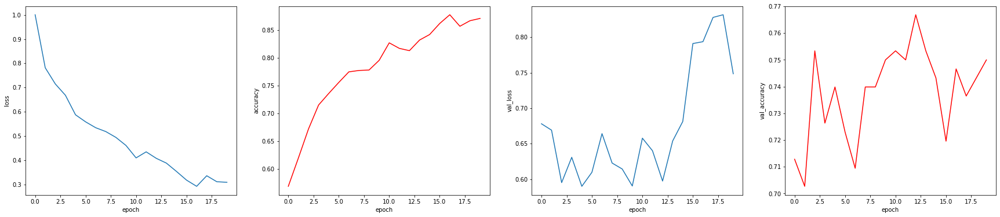

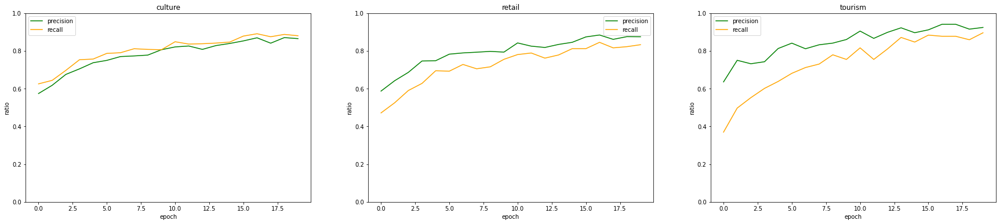

In [ ]:
run_experiment(config_file_yaml = "/tmp/experiment_config19.yml",                
               list_metrics = list_metrics)

In [ ]:
backup_experiment_artefacts(pickled_filepath = "/content/gdrive/My Drive/belle_epoque/experiments/exp19.pickle")

BACKUP for experiment: exp19
Copying  /tmp/checkpoint_model19
Copying  /tmp/captured_prints19.txt
Copying  /tmp/imagegenerator_config1.yml
Copying  /tmp/model_config12.yml


----------------------------------

### Experiment 20

Now we experiment with elu activation(instead of relu) on the ense layers in the classif head.   


In [ ]:
%%writefile /tmp/experiment_config20.yml
experiment_id: "exp20"
experiment_description: "resnet50v2 with adamax optimizer, constant lr"
data_annotations_with_roles: "/content/gdrive/My Drive/belle_epoque/labels_affiches_train_valid_test.json"                     
checkpoint_filepath: "/tmp/checkpoint_model20" 
monitored_metric_bestmodel: "val_Acc"
objective: "max"

yaml_config_file_imagegen: "/tmp/imagegenerator_config1.yml"
yaml_config_file_model: "/tmp/model_config13.yml"
yaml_config_lrschedule: ""

captured_prints_filepath: "/tmp/captured_prints20.txt"
num_epochs_training: 20

class_weights:
    retail: 1.0
    tourism: 1.0
    culture: 1.0

Writing /tmp/experiment_config20.yml


RUNNING EXPERIMENT  exp20
EXPERIMENT DESCRIPTION:  resnet50v2 with adamax optimizer, constant lr
role   label  
test   culture     37
       retail      32
       tourism     11
train  culture    567
       retail     478
       tourism    163
valid  culture    142
       retail     120
       tourism     41
Name: filename, dtype: int64
Found 1208 validated image filenames belonging to 3 classes.
Found 303 validated image filenames belonging to 3 classes.
1208  samples -->  151  steps per epoch
303  samples -->  37  steps per epoch
Dictionary of classweights: {0: 1.0, 1: 1.0, 2: 1.0}


/usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/engine/training.py:1844: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


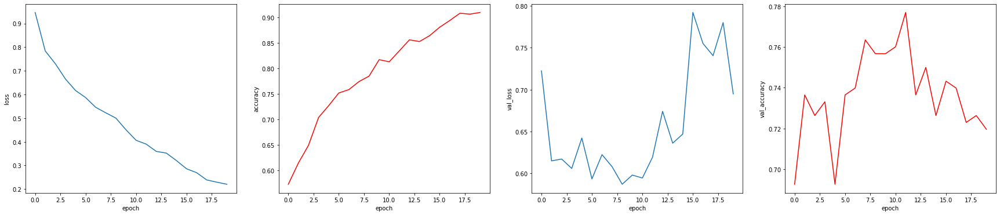

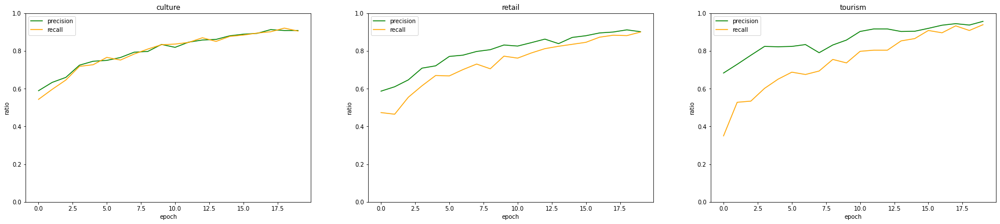

In [ ]:
run_experiment(config_file_yaml = "/tmp/experiment_config20.yml",                
               list_metrics = list_metrics)

In [ ]:
backup_experiment_artefacts(pickled_filepath = "/content/gdrive/My Drive/belle_epoque/experiments/exp20.pickle")

BACKUP for experiment: exp20
Copying  /tmp/checkpoint_model20
Copying  /tmp/captured_prints20.txt
Copying  /tmp/imagegenerator_config1.yml
Copying  /tmp/model_config13.yml


----------------------------------

## Comparison among tracked experiments

### Performance comparison

In [ ]:
def compare_tracked_experiments():
    list_recorded_experiments_metrics = []

    #collect all experiments pickled summaries
    list_pickled = glob.glob("/content/gdrive/My Drive/belle_epoque/experiments/*.pickle")
    
    for pickled_filepath in list_pickled:
        #load pickled file
        with open(pickled_filepath, 'rb') as f:
            dict_tracking = pickle.load(f)

        s_expid = dict_tracking["experiment_id"]
        s_ckpt = dict_tracking["checkpoint_filepath"] 

        dict_aux = dict_tracking["logs"]
        #remove some keys from the dict
        del dict_aux['confussmatrix']
        del dict_aux['val_confussmatrix']
        #add some new keys to dict
        dict_aux["expid"] = s_expid
        dict_aux["ckpt_path"] = s_ckpt

        list_recorded_experiments_metrics.append(dict_aux)
    
    df_recorded_experiments_metrics = pd.DataFrame(list_recorded_experiments_metrics)
    return df_recorded_experiments_metrics

In [ ]:
df_recorded_experiments_metrics = compare_tracked_experiments()

df_recorded_experiments_metrics

,loss,Acc,prec_culture,rec_culture,prec_retail,rec_retail,prec_tourism,rec_tourism,f1_micro,f1_macro,auc,val_loss,val_Acc,val_prec_culture,val_rec_culture,val_prec_retail,val_rec_retail,val_prec_tourism,val_rec_tourism,val_f1_micro,val_f1_macro,val_auc,expid,ckpt_path
0,0.422000,0.825331,0.844643,0.834215,0.850679,0.786611,0.861111,0.760736,0.825331,0.819768,0.950578,0.577166,0.763514,0.800000,0.719424,0.741667,0.754237,0.833333,0.769231,0.763514,0.771764,0.911015,exp1,/tmp/checkpoint_model1
1,0.461516,0.805464,0.812281,0.816579,0.812065,0.732218,0.892617,0.815951,0.805464,0.816486,0.940105,0.613927,0.736486,0.721854,0.795620,0.795918,0.655462,0.750000,0.675000,0.736486,0.722600,0.897767,exp2,/tmp/checkpoint_model2
2,0.363443,0.847682,0.847222,0.860670,0.852679,0.799163,0.916667,0.877301,0.847682,0.858263,0.963083,0.622675,0.739865,0.734694,0.794118,0.759259,0.683333,0.818182,0.675000,0.739865,0.742506,0.904452,exp3,/tmp/checkpoint_model3
3,0.732968,0.663907,0.684764,0.689594,0.697051,0.543933,0.778846,0.496933,0.663907,0.654245,0.845410,0.646322,0.722973,0.717391,0.707143,0.703704,0.655172,1.000000,0.525000,0.722973,0.723644,0.889310,exp4,/tmp/checkpoint_model4
4,0.610854,0.726821,0.736749,0.735450,0.750630,0.623431,0.817518,0.687117,0.726821,0.733217,0.892539,0.610085,0.736486,0.752000,0.671429,0.728155,0.652174,0.787879,0.634146,0.736486,0.736342,0.891652,exp5,/tmp/checkpoint_model5
5,0.666160,0.697020,0.688356,0.708995,0.759420,0.548117,0.809917,0.601227,0.697020,0.696302,0.869275,0.646563,0.702703,0.691781,0.731884,0.764045,0.571429,0.733333,0.564103,0.702703,0.695840,0.876395,exp6,/tmp/checkpoint_model6
6,0.794743,0.759106,0.911504,0.544974,0.683544,0.903766,0.845161,0.803681,0.759106,0.771553,0.918606,0.624055,0.733108,0.857143,0.569343,0.687943,0.815126,0.743590,0.725000,0.733108,0.743264,0.894614,exp7,/tmp/checkpoint_model7
7,0.714406,0.787252,0.747207,0.943563,0.923611,0.556485,0.841463,0.846626,0.787252,0.787457,0.934247,0.721192,0.729730,0.679775,0.864286,0.867647,0.513043,0.743590,0.707317,0.729730,0.720625,0.885169,exp8,/tmp/checkpoint_model8
8,0.378520,0.832781,0.838261,0.850088,0.850000,0.782427,0.897059,0.748466,0.832781,0.829338,0.959632,0.630707,0.746622,0.764286,0.769784,0.759259,0.694915,0.810811,0.769231,0.746622,0.751727,0.901023,exp9,/tmp/checkpoint_model9
9,0.449994,0.805000,0.811388,0.815742,0.806818,0.742678,0.880000,0.809816,0.805000,0.817620,0.942717,0.599161,0.753472,0.750000,0.772059,0.808511,0.666667,0.775000,0.815789,0.753472,0.756840,0.901427,exp10,/tmp/checkpoint_model10


In [ ]:
list_cols_val = [c for c in list(df_recorded_experiments_metrics.columns) if c.startswith("val_")]
list_cols_val.append("expid")
df_recorded_experiments_metrics_val = df_recorded_experiments_metrics[list_cols_val]

df_recorded_experiments_metrics_val.sort_values(by="val_Acc", ascending = False, inplace=True)
df_recorded_experiments_metrics_val

,val_loss,val_Acc,val_prec_culture,val_rec_culture,val_prec_retail,val_rec_retail,val_prec_tourism,val_rec_tourism,val_f1_micro,val_f1_macro,val_auc,expid
19,0.619176,0.777027,0.750000,0.798561,0.842105,0.677966,0.775000,0.794872,0.777027,0.781595,0.900027,exp20
11,0.557674,0.766892,0.760000,0.820144,0.804348,0.632479,0.960000,0.600000,0.766892,0.765612,0.919535,exp12
18,0.597481,0.766892,0.760000,0.808511,0.793814,0.663793,0.800000,0.717949,0.766892,0.764132,0.906179,exp19
0,0.577166,0.763514,0.800000,0.719424,0.741667,0.754237,0.833333,0.769231,0.763514,0.771764,0.911015,exp1
16,0.600492,0.760135,0.731250,0.835714,0.784314,0.689655,0.933333,0.700000,0.760135,0.761927,0.907183,exp17
9,0.599161,0.753472,0.750000,0.772059,0.808511,0.666667,0.775000,0.815789,0.753472,0.756840,0.901427,exp10
14,0.586711,0.753378,0.813559,0.690647,0.718750,0.779661,0.800000,0.717949,0.753378,0.759363,0.907243,exp14
17,0.596521,0.753378,0.724359,0.812950,0.829545,0.618644,0.810811,0.769231,0.753378,0.754436,0.906846,exp18
15,0.605945,0.750000,0.789916,0.676259,0.706349,0.754237,0.818182,0.692308,0.750000,0.756514,0.902635,exp16
10,0.583683,0.746667,0.782946,0.721429,0.730435,0.705882,0.906250,0.707317,0.746667,0.751243,0.906014,exp11


In [ ]:
help(parallel_coordinates)

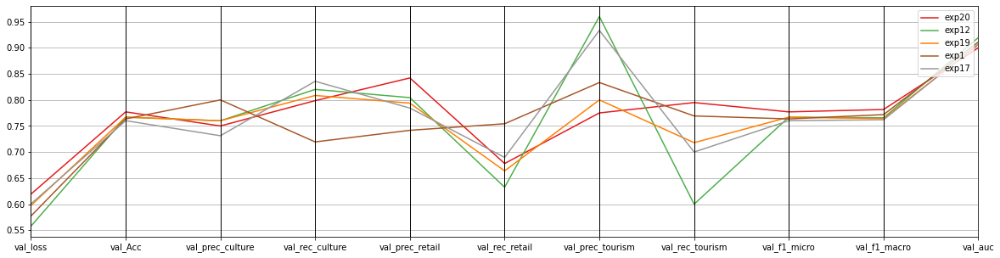

In [ ]:
fig,ax = plt.subplots(1,1, figsize=(20,5))

#plot only for top 5 best models
parallel_coordinates(frame = df_recorded_experiments_metrics_val.head(5), 
                     class_column = 'expid',
                     colormap = plt.get_cmap("Set1"),
                     ax = ax)

## Load saved model and make predictions


For experiment1, load model saved on the best training epoch:

In [ ]:
!tree "/content/gdrive/My Drive/belle_epoque/checkpoints_experiments/exp20"


/content/gdrive/My Drive/belle_epoque/checkpoints_experiments/exp20
├── assets
├── saved_model.pb
└── variables
    ├── variables.data-00000-of-00001
    └── variables.index

2 directories, 3 files


In [ ]:
tf.keras.backend.clear_session()

loaded_model_classif = tf.keras.models.load_model(
                         "/content/gdrive/My Drive/belle_epoque/checkpoints_experiments/exp20",
                         custom_objects = {"MyConfussionMatrixMetric": MyConfussionMatrixMetric},
                         compile=False)

In [ ]:
type(loaded_model_classif)

tensorflow.python.keras.engine.functional.Functional

### Inspect model's inputs and outputs

In [ ]:
loaded_model_classif.signatures

_SignatureMap({'serving_default': <ConcreteFunction signature_wrapper(*, InputImg) at 0x7F12B74D9DD8>})

In [ ]:
loaded_model_classif_func = loaded_model_classif.signatures["serving_default"]

print(type(loaded_model_classif_func))

print("========================================================================")

#we can see here as well the input(s) and output(s)  of the saved model
print("INPUTS:")
print("===========")
#pprint.pprint(loaded_model_classif_func.inputs)
pprint.pprint(loaded_model_classif_func.structured_input_signature)
print("-----------------------------------------------------------------")
print("OUTPUTS:")
print("===========")
pprint.pprint(loaded_model_classif_func.outputs)
pprint.pprint(loaded_model_classif_func.structured_outputs)

<class 'tensorflow.python.saved_model.load._WrapperFunction'>
INPUTS:
((),
 {'InputImg': TensorSpec(shape=(None, None, None, 3), dtype=tf.uint8, name='InputImg')})
-----------------------------------------------------------------
OUTPUTS:
[<tf.Tensor 'Identity:0' shape=(None, 3) dtype=float32>]
{'classif2_output': TensorSpec(shape=(None, 3), dtype=tf.float32, name='classif2_output')}


### Inference on batch from test image generator

In [ ]:
datagen_test = tf.keras.preprocessing.image.ImageDataGenerator( )

#target_size is not set, since we manage resizing as paty o the model
test_data_generator = datagen_test.flow_from_dataframe(
                            dataframe = df_test, 
                            directory = FOLDER_IMAGES_CROP, 
                            x_col = "filename", 
                            y_col = "label", 
                            class_mode = "categorical", 
                            color_mode = 'rgb',
                            batch_size = 8,
                            seed = 10,
                            shuffle = True)

Found 80 validated image filenames belonging to 3 classes.


In [ ]:
candid_batch = next(test_data_generator)

print("batch index:", test_data_generator.batch_index)
print("batch size:", test_data_generator.batch_size)
idx = (test_data_generator.batch_index - 1) * test_data_generator.batch_size


print("----------------------------------------------------------")

#candid_batch is a tuple of (images, ys)
print("candid_batch[0].shape = ", candid_batch[0].shape)
print("candid_batch[1].shape = ", candid_batch[1].shape)

print(candid_batch[1], "\n")
print("----------------------------------------------------------")

pred_batch = loaded_model_classif.predict(candid_batch[0])
print("****** PREDICTION FOR THE ENTIRE BATCH:")
pred_batch

batch index: 5
batch size: 8
----------------------------------------------------------
candid_batch[0].shape =  (8, 256, 256, 3)
candid_batch[1].shape =  (8, 3)
[[1. 0. 0.]
 [1. 0. 0.]
 [1. 0. 0.]
 [0. 1. 0.]
 [1. 0. 0.]
 [1. 0. 0.]
 [1. 0. 0.]
 [1. 0. 0.]] 

----------------------------------------------------------
****** PREDICTION FOR THE ENTIRE BATCH:


array([[6.1344063e-01, 2.7761775e-01, 1.0894158e-01],
       [9.3300152e-01, 6.4324267e-02, 2.6742411e-03],
       [9.4186825e-01, 5.6741688e-02, 1.3901721e-03],
       [1.7793787e-01, 8.2174736e-01, 3.1476887e-04],
       [2.4413064e-01, 7.5487834e-01, 9.9103362e-04],
       [9.2076004e-01, 6.3439928e-02, 1.5800100e-02],
       [9.3837887e-01, 6.1501533e-02, 1.1960889e-04],
       [6.8107879e-01, 2.5075498e-01, 6.8166234e-02]], dtype=float32)

We need to take argmax to convert probability to predicted class ids

In [ ]:
pred_classes_batch = pred_batch.argmax(axis=1)
pred_classes_batch

array([0, 0, 0, 1, 1, 0, 0, 0])

which needs to be compared with the groundtruth:

In [ ]:
actual_classes_batch = candid_batch[1].argmax(axis=1)
actual_classes_batch

array([0, 0, 0, 1, 0, 0, 0, 0])

In [ ]:
#recap
dict_decode = test_data_generator.class_indices
print(dict_decode)

#inverse 
dict_decode_ = {v:k for k,v in dict_decode.items()}
print(dict_decode_)


{'culture': 0, 'retail': 1, 'tourism': 2}
{0: 'culture', 1: 'retail', 2: 'tourism'}


In [ ]:
#make a dataframe
df_batch_predictions = pd.DataFrame({"prediction": pred_classes_batch,
                                     "actual": actual_classes_batch,
                                     })

df_batch_predictions["label"] = df_batch_predictions["actual"].apply(lambda x: dict_decode_[x])
df_batch_predictions["pred_label"] = df_batch_predictions["prediction"].apply(lambda x: dict_decode_[x])

df_batch_predictions

,prediction,actual,label,pred_label
0,0,0,culture,culture
1,0,0,culture,culture
2,0,0,culture,culture
3,1,1,retail,retail
4,1,0,culture,retail
5,0,0,culture,culture
6,0,0,culture,culture
7,0,0,culture,culture


In [ ]:
def visualize_sample_predictions(df_batch_predictions, candid_batch, num_cols_plot = 6, target_file = None):
    num_imgs_plot = df_batch_predictions.shape[0]
    num_rows_plot = math.ceil(num_imgs_plot / num_cols_plot)
    #print("fig of:", num_rows_plot, " x ", num_cols_plot)

    fig = plt.figure(figsize=(num_cols_plot * 5, 5 * num_rows_plot))
    ii = 0

    for i, row in df_batch_predictions.iterrows():
        ax = fig.add_subplot(num_rows_plot, num_cols_plot, ii+1)
        #take the image contents directly from the batch
        im = candid_batch[0][ii]
        the_label = "real: {}  /pred: {}".format(row["label"], row["pred_label"])
        ax.imshow(np.array(im, dtype=np.uint8), alpha = 1)
        ax.set_title(the_label)
        ii+=1

    fig.tight_layout()

    if target_file is not None:
        fig.savefig(target_file)

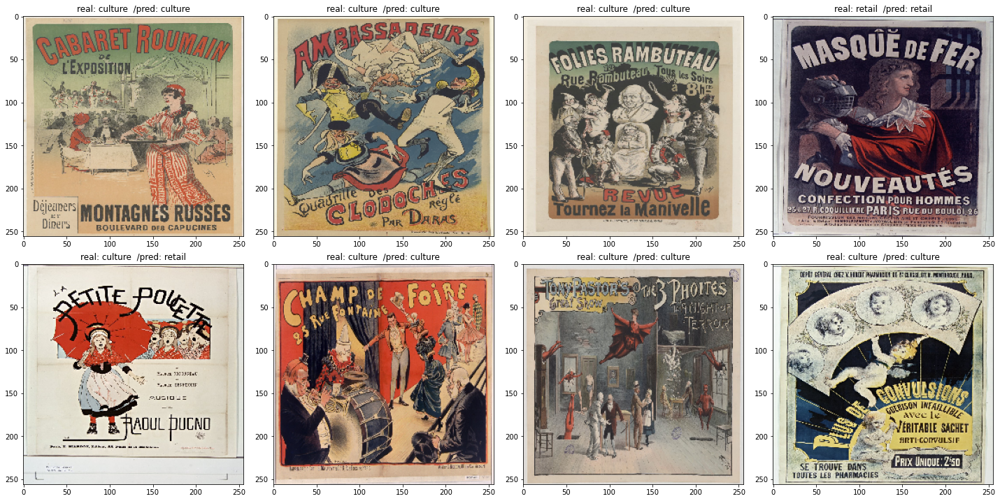

In [ ]:
visualize_sample_predictions(df_batch_predictions, candid_batch, num_cols_plot = 4)

### Inference on ad-hoc test image

In [ ]:
img_filepath = FOLDER_IMAGES_CROP + "3a8a9ae8-ea84-453a-92ae-674760f5f1b6.Hugo.jpg"

In [ ]:
def get_image(file_path):
    """ read image from specified location, which can be the 
        local filesystem path or a GCP Storage blob URI"""
    with file_io.FileIO(file_path, 'rb') as f:
        im = tf.io.decode_image(f.read())
        #since we're in eager execution mode in TF, we can easily convert tensor to numpy
        im_arr = im.numpy()
    return im, im_arr

In [ ]:
im1_tens, im1_arr = get_image(file_path = img_filepath)
print("im_tens:".ljust(20), im1_tens.shape, im1_tens.dtype, type(im1_tens))
print("im_arr:".ljust(20), im1_arr.shape, im1_arr.dtype, type(im1_arr))

im_tens:             (1335, 1005, 3) <dtype: 'uint8'> <class 'tensorflow.python.framework.ops.EagerTensor'>
im_arr:              (1335, 1005, 3) uint8 <class 'numpy.ndarray'>


In [ ]:
def predict_image(loaded_model_classif, file_path, true_label = "n.a.", flag_vis = False):
    im1_tens, im1_arr = get_image(file_path = file_path)

    #the following 2 lines of code are not needed because the division by 255 is done in the lambda layer of the model
    #im1_tens_float = tf.cast(im1_tens, dtype = tf.float32)
    #im1_tens_float = im1_tens_float / 255.0

    im1_tens_batch = tf.expand_dims(im1_tens, 0)
    pred_batch_of_one = loaded_model_classif.predict(im1_tens_batch)
    pred_probab = pred_batch_of_one.max(axis=1)
    pred_class = pred_batch_of_one.argmax(axis=1)

    if flag_vis is True:
        fig,ax = plt.subplots(1,1, figsize = (6,6))
        ax.imshow(im1_arr)
        #take [0] because we have a batch of 1 image
        ax.set_title("real : {} /pred: {} ({:.3f})".format(true_label, dict_decode_[pred_class[0]], pred_probab[0]))
    return pred_class[0], pred_probab[0]

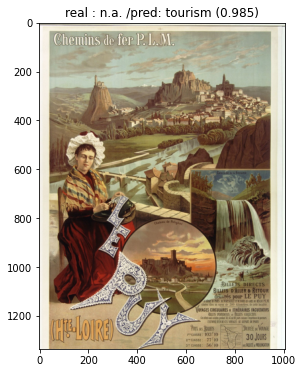

In [ ]:
img_filepath = FOLDER_IMAGES_CROP + "3a8a9ae8-ea84-453a-92ae-674760f5f1b6.Hugo.jpg"

pred_class = predict_image(loaded_model_classif = loaded_model_classif, file_path = img_filepath, flag_vis = True)


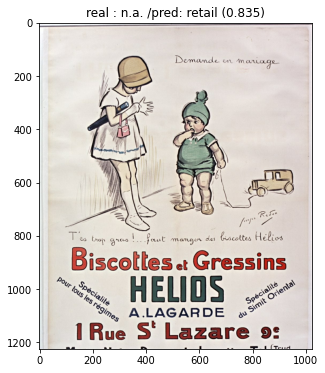

In [ ]:
img_filepath = FOLDER_IMAGES_CROP +  "11e04904-30cc-4a43-9d60-8afdc980419d.Redon_Georges.jpg"

pred_class = predict_image(loaded_model_classif = loaded_model_classif, file_path = img_filepath, flag_vis = True)


# Ensemble of models

Here we train a "stacked generalization" ensemble.   
Recap: "the predictions of each individual estimator are stacked together and used as input to a final estimator to compute the prediction."[7].  
The ensemble "will use the predictions of the estimators as input, estimators which are stacked together in parallel on the input data" [7]

[7] https://scikit-learn.org/stable/modules/ensemble.html#stacked-generalization

## Inference with models in top10

Save predictions with each of the top 10 models and save them as a dataset for the ensemble training

In [ ]:
tf.keras.backend.clear_session()

list_models_topn = []
topn=10

for i, row in df_recorded_experiments_metrics_val.head(topn).iterrows():
    loaded_model_classif_ = tf.keras.models.load_model(
                                "/content/gdrive/My Drive/belle_epoque/checkpoints_experiments/" + row["expid"],
                                custom_objects = {"MyConfussionMatrixMetric": MyConfussionMatrixMetric},
                                compile=False)
    
    list_models_topn.append(loaded_model_classif_)



In [ ]:
def predict_with_top5models(df):

    df_predictions_ = df.copy()

    for ii in range(len(list_models_topn)):
        colname = "pred_{}".format(ii)
        loaded_model_classif_ =  list_models_topn[ii]
        #colect 2 results from function in apply into 2 new columns
        df_predictions_[[colname, colname + "_probab"]] = df_predictions_.apply(
                                   lambda row: 
                                      predict_image(loaded_model_classif = loaded_model_classif_,
                                                    file_path = FOLDER_IMAGES_CROP + row["filename"]),
                                    axis = 1,
                                    result_type="expand")
        
        df_predictions_[colname+"_label"] = df_predictions_[colname].apply(lambda x: dict_decode_[x])

    return df_predictions_

In [ ]:
df_train_ensemble = predict_with_top5models(df = df_train)

In [ ]:
df_valid_ensemble = predict_with_top5models(df = df_valid)

In [ ]:
df_test_ensemble = predict_with_top5models(df = df_test)

In [ ]:
df_train_ensemble.head(20)

,filename,annotations,label,role,pred_0,pred_0_probab,pred_0_label,pred_1,pred_1_probab,pred_1_label,pred_2,pred_2_probab,pred_2_label,pred_3,pred_3_probab,pred_3_label,pred_4,pred_4_probab,pred_4_label,pred_5,pred_5_probab,pred_5_label,pred_6,pred_6_probab,pred_6_label,pred_7,pred_7_probab,pred_7_label,pred_8,pred_8_probab,pred_8_label,pred_9,pred_9_probab,pred_9_label
0,eb28e21f-be7c-4035-91f4-de29c011d6e7.Meunier_Georges.jpg,[retail],retail,train,1.0,0.845019,retail,0.0,0.482511,culture,1.0,0.830649,retail,1.0,0.874708,retail,1.0,0.618732,retail,1.0,0.712341,retail,1.0,0.666935,retail,1.0,0.725090,retail,1.0,0.819201,retail,0.0,0.534097,culture
1,71f32ba3-fa92-432d-8fb9-8568e3720705.Cazaneuve_Edouard.jpg,[culture],culture,train,0.0,0.904694,culture,0.0,0.728511,culture,0.0,0.784891,culture,0.0,0.780954,culture,1.0,0.509267,retail,0.0,0.836840,culture,0.0,0.717099,culture,0.0,0.644821,culture,0.0,0.680411,culture,0.0,0.602057,culture
2,3e827ea4-210c-489b-b284-704e754bd0fc.Choubrac_Alfred.jpg,[culture],culture,train,0.0,0.963975,culture,0.0,0.809884,culture,0.0,0.906483,culture,0.0,0.945698,culture,0.0,0.845667,culture,0.0,0.905337,culture,0.0,0.909488,culture,0.0,0.955510,culture,0.0,0.896572,culture,0.0,0.879074,culture
3,d06f8bff-eac4-4423-9d78-2ee5b49a6ab7.jpg,[retail],retail,train,1.0,0.656710,retail,1.0,0.498531,retail,1.0,0.579271,retail,1.0,0.625669,retail,1.0,0.535890,retail,1.0,0.556566,retail,1.0,0.633224,retail,1.0,0.605883,retail,1.0,0.669221,retail,0.0,0.510759,culture
4,7babd914-655c-4871-9758-bfc307e11bdb.jpg,[retail],retail,train,0.0,0.550366,culture,0.0,0.766720,culture,0.0,0.735903,culture,0.0,0.570920,culture,0.0,0.800586,culture,0.0,0.762870,culture,0.0,0.561962,culture,0.0,0.699176,culture,0.0,0.604823,culture,0.0,0.797961,culture
5,5418e035-37cd-4bf3-a070-baabdd62051a.jpg,[retail],retail,train,0.0,0.897680,culture,0.0,0.711032,culture,0.0,0.684711,culture,0.0,0.830803,culture,0.0,0.843815,culture,0.0,0.851339,culture,0.0,0.774088,culture,0.0,0.913430,culture,0.0,0.819166,culture,0.0,0.710610,culture
6,0a435bf7-51cb-4cd6-bc9b-18c1f0562748.jpg,[tourism],tourism,train,2.0,0.937890,tourism,2.0,0.840974,tourism,2.0,0.992343,tourism,2.0,0.925924,tourism,2.0,0.922299,tourism,2.0,0.895423,tourism,2.0,0.951789,tourism,2.0,0.987179,tourism,2.0,0.947671,tourism,2.0,0.894748,tourism
7,234a2ba5-bee7-4984-bd6b-a7ca7fc31cd8.Hugo.jpg,[culture],culture,train,0.0,0.670486,culture,1.0,0.497488,retail,0.0,0.650667,culture,0.0,0.611262,culture,0.0,0.689339,culture,0.0,0.564821,culture,0.0,0.658416,culture,0.0,0.639985,culture,0.0,0.553621,culture,1.0,0.539211,retail
8,bd72ded3-9f3e-4a50-9062-7d05ecd4fcbc.jpg,[culture],culture,train,0.0,0.626630,culture,1.0,0.500552,retail,1.0,0.506454,retail,1.0,0.503333,retail,1.0,0.528137,retail,0.0,0.735954,culture,1.0,0.539894,retail,0.0,0.611551,culture,0.0,0.579487,culture,0.0,0.538394,culture
9,86ee6731-d489-4e01-81c7-89a5a86e5b1f.Ylen_Jean.jpg,[retail],retail,train,1.0,0.894194,retail,1.0,0.718960,retail,1.0,0.920347,retail,1.0,0.881722,retail,1.0,0.787067,retail,1.0,0.777859,retail,1.0,0.913740,retail,1.0,0.558145,retail,1.0,0.954295,retail,1.0,0.876435,retail


Example of disagreement between the classifiers:

Verdicts: [['tourism' 'culture' 'culture' 'culture' 'culture' 'tourism' 'tourism'
  'culture' 'tourism' 'culture']]
Verdicts confidence: [[0.54978603 0.62907714 0.58420151 0.5344165  0.64178973 0.41367191
  0.51089185 0.66000813 0.37889555 0.44091672]]


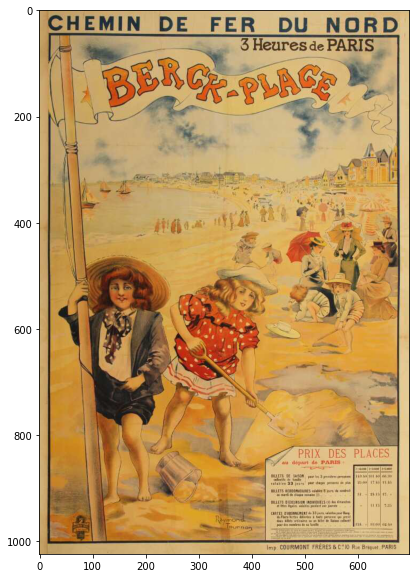

In [ ]:
fig, ax = plt.subplots(1,1,figsize=(10,10))
im = pilim.open(FOLDER_IMAGES_CROP+"09923ae5-68f5-4444-b1b7-3d4d290fd010.jpg")
ax.imshow(np.array(im))

list_cols_predictions = [el for el in list(df_train_ensemble.columns) if el.startswith("pred_") and el.endswith("_label")]
list_cols_predictions_probab = [el for el in list(df_train_ensemble.columns) if el.startswith("pred_") and el.endswith("_probab")]

print("Verdicts:", df_train_ensemble[df_train_ensemble["filename"] == "09923ae5-68f5-4444-b1b7-3d4d290fd010.jpg"][list_cols_predictions].values)
print("Verdicts confidence:", df_train_ensemble[df_train_ensemble["filename"] == "09923ae5-68f5-4444-b1b7-3d4d290fd010.jpg"][list_cols_predictions_probab].values)

In [ ]:
df_train_ensemble.to_json("/content/gdrive/My Drive/belle_epoque/train_ensemble_.json", orient="records")
df_valid_ensemble.to_json("/content/gdrive/My Drive/belle_epoque/vald_ensemble_.json", orient="records")
df_test_ensemble.to_json("/content/gdrive/My Drive/belle_epoque/test_ensemble_.json", orient="records")


## Read data

In [ ]:
df_train_ensemble = pd.read_json("/content/gdrive/My Drive/belle_epoque/train_ensemble_.json", orient="records")
df_valid_ensemble = pd.read_json("/content/gdrive/My Drive/belle_epoque/vald_ensemble_.json", orient="records")
df_test_ensemble = pd.read_json("/content/gdrive/My Drive/belle_epoque/test_ensemble_.json", orient="records")

In [ ]:
list_cols_touse = [el for el in list(df_train_ensemble.columns) if el.startswith("pred_") and (el.endswith("_label") or el.endswith("_probab"))]
list_cols_touse.append('label')

df_train_ens = df_train_ensemble[list_cols_touse]
df_valid_ens = df_valid_ensemble[list_cols_touse]
df_test_ens = df_test_ensemble[list_cols_touse]

df_train_ens.head(10)

,pred_0_probab,pred_0_label,pred_1_probab,pred_1_label,pred_2_probab,pred_2_label,pred_3_probab,pred_3_label,pred_4_probab,pred_4_label,pred_5_probab,pred_5_label,pred_6_probab,pred_6_label,pred_7_probab,pred_7_label,pred_8_probab,pred_8_label,pred_9_probab,pred_9_label,label
0,0.845019,retail,0.482511,culture,0.830649,retail,0.874708,retail,0.618732,retail,0.712341,retail,0.666935,retail,0.725090,retail,0.819201,retail,0.534097,culture,retail
1,0.904694,culture,0.728511,culture,0.784891,culture,0.780954,culture,0.509267,retail,0.836840,culture,0.717099,culture,0.644821,culture,0.680411,culture,0.602057,culture,culture
2,0.963975,culture,0.809884,culture,0.906483,culture,0.945698,culture,0.845667,culture,0.905337,culture,0.909488,culture,0.955510,culture,0.896572,culture,0.879074,culture,culture
3,0.656710,retail,0.498531,retail,0.579271,retail,0.625669,retail,0.535890,retail,0.556566,retail,0.633224,retail,0.605883,retail,0.669221,retail,0.510759,culture,retail
4,0.550366,culture,0.766720,culture,0.735903,culture,0.570920,culture,0.800586,culture,0.762870,culture,0.561962,culture,0.699176,culture,0.604823,culture,0.797961,culture,retail
5,0.897680,culture,0.711032,culture,0.684711,culture,0.830803,culture,0.843815,culture,0.851339,culture,0.774088,culture,0.913430,culture,0.819166,culture,0.710610,culture,retail
6,0.937890,tourism,0.840974,tourism,0.992343,tourism,0.925924,tourism,0.922299,tourism,0.895423,tourism,0.951789,tourism,0.987179,tourism,0.947671,tourism,0.894748,tourism,tourism
7,0.670486,culture,0.497488,retail,0.650667,culture,0.611262,culture,0.689339,culture,0.564821,culture,0.658416,culture,0.639985,culture,0.553621,culture,0.539211,retail,culture
8,0.626630,culture,0.500552,retail,0.506454,retail,0.503333,retail,0.528137,retail,0.735954,culture,0.539894,retail,0.611551,culture,0.579487,culture,0.538394,culture,culture
9,0.894194,retail,0.718960,retail,0.920347,retail,0.881722,retail,0.787067,retail,0.777859,retail,0.913740,retail,0.558145,retail,0.954295,retail,0.876435,retail,retail


##Tensorflow stacked ensemble model

### Prepare tabular TF Dataset

Basically here we deal with a tabular dataset, made of categorical columns and numeric columns, with a categorical target

In [ ]:
df_train_ens.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1208 entries, 0 to 1207
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   pred_0_probab  1208 non-null   float64
 1   pred_0_label   1208 non-null   object 
 2   pred_1_probab  1208 non-null   float64
 3   pred_1_label   1208 non-null   object 
 4   pred_2_probab  1208 non-null   float64
 5   pred_2_label   1208 non-null   object 
 6   pred_3_probab  1208 non-null   float64
 7   pred_3_label   1208 non-null   object 
 8   pred_4_probab  1208 non-null   float64
 9   pred_4_label   1208 non-null   object 
 10  pred_5_probab  1208 non-null   float64
 11  pred_5_label   1208 non-null   object 
 12  pred_6_probab  1208 non-null   float64
 13  pred_6_label   1208 non-null   object 
 14  pred_7_probab  1208 non-null   float64
 15  pred_7_label   1208 non-null   object 
 16  pred_8_probab  1208 non-null   float64
 17  pred_8_label   1208 non-null   object 
 18  pred_9_p

In [ ]:
def df_to_dataset(df, target_col_name = "label", shuffle = True, batch_size = 8):
    """ given an input dataframe, take apart the target column and transform it to OHE,
        creating a tf dataset shuffled, batched and prefetched"""

    df_tabular = df.copy()

    #take apart the target column
    labels = df_tabular.pop(target_col_name)  
    #ohe from scikit expects 2d array
    arr_labels = np.array(labels.values).reshape(-1,1)
    ohe_en = OneHotEncoder(sparse=False, handle_unknown="ignore")
    labels_ohe = ohe_en.fit_transform(arr_labels)

    #datasets for features and for labels
    ds_features = tf.data.Dataset.from_tensor_slices(dict(df_tabular))
    ds_labels = tf.data.Dataset.from_tensor_slices(labels_ohe)

    ds = tf.data.Dataset.zip((ds_features, ds_labels))

    if shuffle:
        ds = ds.shuffle(buffer_size=len(df_tabular))

    ds = ds.batch(batch_size)
    ds = ds.prefetch(buffer_size = 10)

    return ds

In [ ]:
ds_train = df_to_dataset(df = df_train_ens)
ds_valid = df_to_dataset(df = df_valid_ens)
ds_test = df_to_dataset(df = df_test_ens)

#--------------------------------------------------
ds_test

<PrefetchDataset shapes: ({pred_0_probab: (None,), pred_0_label: (None,), pred_1_probab: (None,), pred_1_label: (None,), pred_2_probab: (None,), pred_2_label: (None,), pred_3_probab: (None,), pred_3_label: (None,), pred_4_probab: (None,), pred_4_label: (None,), pred_5_probab: (None,), pred_5_label: (None,), pred_6_probab: (None,), pred_6_label: (None,), pred_7_probab: (None,), pred_7_label: (None,), pred_8_probab: (None,), pred_8_label: (None,), pred_9_probab: (None,), pred_9_label: (None,)}, (None, 3)), types: ({pred_0_probab: tf.float64, pred_0_label: tf.string, pred_1_probab: tf.float64, pred_1_label: tf.string, pred_2_probab: tf.float64, pred_2_label: tf.string, pred_3_probab: tf.float64, pred_3_label: tf.string, pred_4_probab: tf.float64, pred_4_label: tf.string, pred_5_probab: tf.float64, pred_5_label: tf.string, pred_6_probab: tf.float64, pred_6_label: tf.string, pred_7_probab: tf.float64, pred_7_label: tf.string, pred_8_probab: tf.float64, pred_8_label: tf.string, pred_9_probab

In [ ]:
#see a batch from the test dataset
for feature_batch, label_batch in ds_test.take(1):
    print("Features:")
    pprint.pprint(feature_batch)
    print("Targets:")
    pprint.pprint(label_batch)
    print("--------------------------------------------------------------")

Features:
{'pred_0_label': <tf.Tensor: shape=(8,), dtype=string, numpy=
array([b'culture', b'tourism', b'culture', b'tourism', b'culture',
       b'retail', b'culture', b'culture'], dtype=object)>,
 'pred_0_probab': <tf.Tensor: shape=(8,), dtype=float64, numpy=
array([0.45637596, 0.65101248, 0.69012451, 0.98061234, 0.50673395,
       0.77315956, 0.99548483, 0.59271479])>,
 'pred_1_label': <tf.Tensor: shape=(8,), dtype=string, numpy=
array([b'retail', b'culture', b'culture', b'tourism', b'retail',
       b'retail', b'culture', b'culture'], dtype=object)>,
 'pred_1_probab': <tf.Tensor: shape=(8,), dtype=float64, numpy=
array([0.80442387, 0.43274826, 0.63400763, 0.87883228, 0.53413141,
       0.50605708, 0.97103912, 0.48147395])>,
 'pred_2_label': <tf.Tensor: shape=(8,), dtype=string, numpy=
array([b'retail', b'culture', b'retail', b'tourism', b'retail', b'retail',
       b'culture', b'culture'], dtype=object)>,
 'pred_2_probab': <tf.Tensor: shape=(8,), dtype=float64, numpy=
array([0.8908

Noote: because we took dict(df_tabular) the columns were reordered compared to the structure of df_tabular, i.e now we have pred_x_label , pred_x_probab.

### Recipes for each column's preprocessing with TF pipelines

In [ ]:
dict_categ = {}
feature_columns = []

target_col = "label"

for c in list(df_train_ens.columns):
    if (df_train_ens[c].dtype == "object") and (c!= target_col):
        #the sorted list of uniq values in column c is sorted as value for key c in dict
        list_values_col_c = sorted(list(df_train_ens[c].unique()))
        dict_categ[c] = list_values_col_c

        cat_feat = tf.feature_column.categorical_column_with_vocabulary_list(c, list_values_col_c)
        cat_feat_ohe = tf.feature_column.indicator_column(cat_feat)
        feature_columns.append(cat_feat_ohe)

    elif (df_train_ens[c].dtype == "float64"):
        num_feat = tf.feature_column.numeric_column(c)
        feature_columns.append(num_feat)


#----------------------------------------------------------
feature_columns

[NumericColumn(key='pred_0_probab', shape=(1,), default_value=None, dtype=tf.float32, normalizer_fn=None),
 IndicatorColumn(categorical_column=VocabularyListCategoricalColumn(key='pred_0_label', vocabulary_list=('culture', 'retail', 'tourism'), dtype=tf.string, default_value=-1, num_oov_buckets=0)),
 NumericColumn(key='pred_1_probab', shape=(1,), default_value=None, dtype=tf.float32, normalizer_fn=None),
 IndicatorColumn(categorical_column=VocabularyListCategoricalColumn(key='pred_1_label', vocabulary_list=('culture', 'retail', 'tourism'), dtype=tf.string, default_value=-1, num_oov_buckets=0)),
 NumericColumn(key='pred_2_probab', shape=(1,), default_value=None, dtype=tf.float32, normalizer_fn=None),
 IndicatorColumn(categorical_column=VocabularyListCategoricalColumn(key='pred_2_label', vocabulary_list=('culture', 'retail', 'tourism'), dtype=tf.string, default_value=-1, num_oov_buckets=0)),
 NumericColumn(key='pred_3_probab', shape=(1,), default_value=None, dtype=tf.float32, normalizer_

### Keras-Tuner for hyperparameter tuning

see:
- https://keras-team.github.io/keras-tuner/
- https://www.tensorflow.org/tutorials/keras/keras_tuner
- https://blog.tensorflow.org/2020/01/hyperparameter-tuning-with-keras-tuner.html

note: here we use the functional api of keras

In [ ]:
num_classes = 3
list_metrics = [tf.keras.metrics.CategoricalAccuracy(name = "Acc"),
                tf.keras.metrics.Precision(class_id = 0, name="prec_culture"),  
                tf.keras.metrics.Recall(class_id = 0, name = "rec_culture"),
                tf.keras.metrics.Precision(class_id = 1, name="prec_retail"),  
                tf.keras.metrics.Recall(class_id = 1, name = "rec_retail"),
                tf.keras.metrics.Precision(class_id = 2, name="prec_tourism"),  
                tf.keras.metrics.Recall(class_id = 2, name = "rec_tourism"),
                tfa.metrics.F1Score(num_classes=num_classes, average= "micro", name ="f1_micro"),
                tfa.metrics.F1Score(num_classes=num_classes, average= "macro", name ="f1_macro"),
                tf.keras.metrics.AUC(curve="ROC", multi_label=False, name = "auc")                 
                ]

In [ ]:
def build_ensemble_model(hp):
    
    tf.keras.backend.clear_session()

    #--------------- INPUT ------------------------------------------------

    ensemble_inputs = {
        'pred_0_label': tf.keras.Input((1,), dtype=tf.dtypes.string, name='pred_0_label'),
        'pred_0_probab': tf.keras.Input((1,), dtype=tf.dtypes.float32, name='pred_0_probab'),
        'pred_1_label': tf.keras.Input((1,), dtype=tf.dtypes.string, name='pred_1_label'),
        'pred_1_probab': tf.keras.Input((1,), dtype=tf.dtypes.float32, name='pred_1_probab'),
        'pred_2_label': tf.keras.Input((1,), dtype=tf.dtypes.string, name='pred_2_label'),
        'pred_2_probab': tf.keras.Input((1,), dtype=tf.dtypes.float32, name='pred_2_probab'),
        'pred_3_label': tf.keras.Input((1,), dtype=tf.dtypes.string, name='pred_3_label'),
        'pred_3_probab': tf.keras.Input((1,), dtype=tf.dtypes.float32, name='pred_3_probab'),
        'pred_4_label': tf.keras.Input((1,), dtype=tf.dtypes.string, name='pred_4_label'),
        'pred_4_probab': tf.keras.Input((1,), dtype=tf.dtypes.float32, name='pred_4_probab'),
        'pred_5_label': tf.keras.Input((1,), dtype=tf.dtypes.string, name='pred_5_label'),
        'pred_5_probab': tf.keras.Input((1,), dtype=tf.dtypes.float32, name='pred_5_probab'),
        'pred_6_label': tf.keras.Input((1,), dtype=tf.dtypes.string, name='pred_6_label'),
        'pred_6_probab': tf.keras.Input((1,), dtype=tf.dtypes.float32, name='pred_6_probab'),
        'pred_7_label': tf.keras.Input((1,), dtype=tf.dtypes.string, name='pred_7_label'),
        'pred_7_probab': tf.keras.Input((1,), dtype=tf.dtypes.float32, name='pred_7_probab'),
        'pred_8_label': tf.keras.Input((1,), dtype=tf.dtypes.string, name='pred_8_label'),
        'pred_8_probab': tf.keras.Input((1,), dtype=tf.dtypes.float32, name='pred_8_probab'),
        'pred_9_label': tf.keras.Input((1,), dtype=tf.dtypes.string, name='pred_9_label'),
        'pred_9_probab': tf.keras.Input((1,), dtype=tf.dtypes.float32, name='pred_9_probab'),
    }

    #the input layer
    input_layer_recipes = tf.keras.layers.DenseFeatures(feature_columns)
    x = input_layer_recipes(ensemble_inputs)

    #add between 1 and 3 layers
    num_layers = hp.Int('num_layers', min_value = 1, max_value = 5)
    for i in range(num_layers):
        dense_i = tf.keras.layers.Dense( units=hp.Int('units_' + str(i),
                                                      min_value=8, max_value=128,
                                                      step=8),
                       activation='relu')
        x = dense_i(x)
        #add dropout after each dense layer
        x = tf.keras.layers.Dropout(rate=0.1)(x)

    #-------------------------------------OUTPUT--------------------------------
    num_classes = 3
    #output1_logits = tf.keras.layers.Dense(num_classes, activation = None, name = "classif_output")(x)
    output1_probab = tf.keras.layers.Dense(num_classes, activation = "softmax", name = "classif2_output")(x) 

    #-------------------------------------MODEL COMPILATION----------------------------------

    #instantiate model
    model_ens = tf.keras.Model(inputs = list(ensemble_inputs.values()), 
                               outputs = [output1_probab], 
                               name="ensemble_classifier")

    #when we compile the model,
    #from_logits=True  assumes output1_logits (real-values scores) tensors as model output 
    #from_logits=False assumes output1_probab (probabilities in [0,1]) as model output 
    lr = hp.Choice('learning_rate', [1e-1, 5e-1, 1e-2, 5e-2, 1e-3, 5e-3, 1e-4])
    model_ens.compile(loss = tf.keras.losses.CategoricalCrossentropy(from_logits=False),
                  optimizer = tf.keras.optimizers.Adamax(learning_rate = lr),
                  metrics = list_metrics,
                  run_eagerly=True   #this is needed because we assume eager executon (using .numpy()) in the custom metric
                  )
    
    return model_ens


#### Random search

randomly sample max_trials various hyperparameter combinations 

In [ ]:
!rm -r -f /tmp/ens_ker_tun
!mkdir -p /tmp/ens_ker_tun

In [ ]:
#note: because our metric has custom name, we need to specify its direction
kt_tuner = kt.tuners.RandomSearch(build_ensemble_model,
                    objective = kt.Objective("val_Acc", direction="max"),
                    max_trials = 5,
                    executions_per_trial = 1,
                    directory = '/tmp/ens_ker_tun',
                    project_name = 'ENS_KER_TUN')

kt_tuner.search_space_summary()

Search space summary
Default search space size: 3
num_layers (Int)
{'default': None, 'conditions': [], 'min_value': 1, 'max_value': 5, 'step': 1, 'sampling': None}
units_0 (Int)
{'default': None, 'conditions': [], 'min_value': 8, 'max_value': 128, 'step': 8, 'sampling': None}
learning_rate (Choice)
{'default': 0.1, 'conditions': [], 'values': [0.1, 0.5, 0.01, 0.05, 0.001, 0.005, 0.0001], 'ordered': True}


note: so far it only lists "units_0", but after the search it will list up to "units_4"

In [ ]:
kt_tuner.search(ds_train, 
                validation_data = ds_valid, 
                epochs = 10, 
                callbacks = [])


Trial 5 Complete [00h 02m 19s]
val_Acc: 0.4686468541622162

Best val_Acc So Far: 0.7788779139518738
Total elapsed time: 00h 11m 32s


Note: an alternative is Hyperband search, which applies early stopping in each trial, so it needs an additional parameter: max_epochs = 15

**Comment:** with best single model, val_Acc was 0.777027; with ensemble of 10 models thw val_Acc raised only to 0.778 but the complexity of managing the ensmble incremented significantly.

In [ ]:
print(type(kt_tuner))
print("------------------------------------------------------------------------")
utility_print_lists_columnized(long_list = [el  for el in dir(kt_tuner) if el[0]!="_"])

<class 'kerastuner.tuners.randomsearch.RandomSearch'>
------------------------------------------------------------------------
directory       distribution_strategy  executions_per_trial  get_best_hyperparameters  get_best_models
get_state       get_trial_dir          hypermodel            load_model                logger
on_batch_begin  on_batch_end           on_epoch_begin        on_epoch_end              on_search_begin
on_search_end   on_trial_begin         on_trial_end          oracle                    project_dir
project_name    reload                 remaining_trials      results_summary           run_trial
save            save_model             search                search_space_summary      seed
set_state       tuner_id


In [ ]:
#top 3 best trials of keras-tuner

for trial in kt_tuner.oracle.get_best_trials(3):
    metrics = trial.metrics
    hps = trial.hyperparameters
    print("trial:", trial.trial_id)
    print(trial.summary())
    print("---------------------------------------------------")

trial: 0c7eacebbb99692e17fe2cb356087f10
Trial summary
Hyperparameters:
num_layers: 5
units_0: 24
learning_rate: 0.05
units_1: 120
units_2: 8
units_3: 8
units_4: 8
Score: 0.7788779139518738
None
---------------------------------------------------
trial: b59bc602f3de4f5042c9d24143077a8c
Trial summary
Hyperparameters:
num_layers: 2
units_0: 96
learning_rate: 0.001
units_1: 80
units_2: 128
units_3: 104
units_4: 104
Score: 0.7722772359848022
None
---------------------------------------------------
trial: 2d68387c678e595d75059df9ea15292a
Trial summary
Hyperparameters:
num_layers: 2
units_0: 32
learning_rate: 0.01
units_1: 128
units_2: 56
units_3: 72
units_4: 16
Score: 0.7656765580177307
None
---------------------------------------------------


In [ ]:
#sidenote: alternatively, we can retrieve the best hyperparams with:
best_hyperparameters = kt_tuner.get_best_hyperparameters(1)[0]
best_hyperparameters.values

{'learning_rate': 0.05,
 'num_layers': 5,
 'units_0': 24,
 'units_1': 120,
 'units_2': 8,
 'units_3': 8,
 'units_4': 8}

In [ ]:
!tree /tmp/ens_ker_tun/ENS_KER_TUN/trial_0c7eacebbb99692e17fe2cb356087f10

/tmp/ens_ker_tun/ENS_KER_TUN/trial_0c7eacebbb99692e17fe2cb356087f10
├── checkpoints
│   └── epoch_0
│       ├── checkpoint
│       ├── checkpoint.data-00000-of-00001
│       └── checkpoint.index
└── trial.json

2 directories, 4 files


Note: by default only weights were saved, the graph was not.  
(see https://github.com/keras-team/keras-tuner/issues/41 )

In [ ]:
best_tf_ens_model = kt_tuner.get_best_models(1)[0]

print(type(best_tf_ens_model))


<class 'tensorflow.python.keras.engine.functional.Functional'>


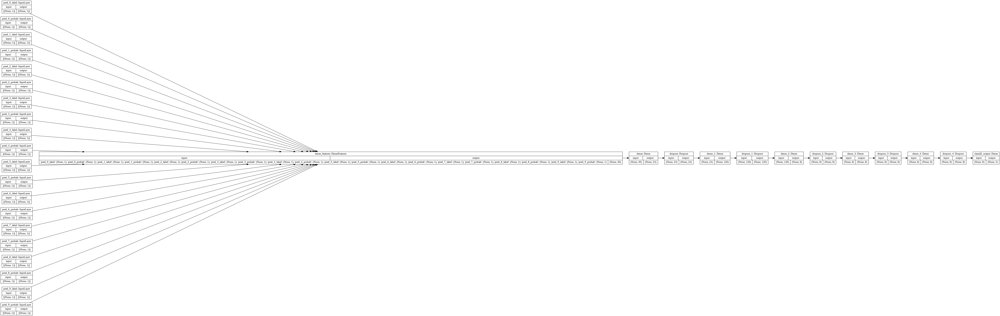

In [ ]:
#note: for diagramming we need a single combination of values
tf.keras.utils.plot_model(best_tf_ens_model, show_shapes = True, rankdir="LR", 
                          to_file="/content/gdrive/My Drive/belle_epoque/diagram_ens1.png")

Note: the 20 inputs are transformmed to a tensor of shape (40,)  because 10 inputs were floats and 10 inputs were strings that were OHE-ed on 3 "bits" each 

In [ ]:
!rm -r -f "/content/gdrive/My Drive/belle_epoque/ens_tf"
!mkdir -p "/content/gdrive/My Drive/belle_epoque/ens_tf"
!cp -r /tmp/ens_ker_tun/ENS_KER_TUN/trial_0c7eacebbb99692e17fe2cb356087f10 "/content/gdrive/My Drive/belle_epoque/ens_tf"
!tree "/content/gdrive/My Drive/belle_epoque/ens_tf"

/content/gdrive/My Drive/belle_epoque/ens_tf
└── trial_0c7eacebbb99692e17fe2cb356087f10
    ├── checkpoints
    │   └── epoch_0
    │       ├── checkpoint
    │       ├── checkpoint.data-00000-of-00001
    │       └── checkpoint.index
    └── trial.json

3 directories, 4 files


### Inference with the ensemble

Here we create a new model, consisting of the 10 submodels and the ensemble head, using Keras functional model api (because we need branching).

Recap: each model includes into its first layers the preprocessing of the input

In [ ]:
topn=10
list_expids_topn = []
for i, row in df_recorded_experiments_metrics_val.head(topn).iterrows():
    list_expids_topn.append(row["expid"])

print(list_expids_topn)

['exp20', 'exp12', 'exp19', 'exp1', 'exp17', 'exp10', 'exp14', 'exp18', 'exp16', 'exp11']


In [ ]:
#recap
dict_decode = train_data_generator.class_indices
print(dict_decode)

#inverse 
dict_decode_ = {v:k for k,v in dict_decode.items()}
print(dict_decode_)


{'culture': 0, 'retail': 1, 'tourism': 2}
{0: 'culture', 1: 'retail', 2: 'tourism'}


In [ ]:
dict_decode_ = {0: 'culture', 1: 'retail', 2: 'tourism'}

In [ ]:
#how it works - TF lookup
#note: specify type int64, otherwise by default is int32
keys_tensor = tf.constant(list(dict_decode_.keys()), dtype = tf.int64)
vals_tensor = tf.constant(list(dict_decode_.values()), dtype = tf.string)

#to use "unknown" (like an out-of-domain) if value not found in dict
lu_table = tf.lookup.StaticHashTable(
            tf.lookup.KeyValueTensorInitializer(keys_tensor, vals_tensor), 
            "unknown")


arr_example = np.array([2.0])
t_example =  tf.convert_to_tensor(arr_example, dtype=tf.int64)
print(t_example)
t_lookedup = lu_table.lookup(t_example)
print(t_lookedup)


print("------------------------------------------------------------------")

arr_example = np.array([5.0])
t_example =  tf.convert_to_tensor(arr_example, dtype=tf.int64)
print(t_example)
t_lookedup = lu_table.lookup(t_example)
print(t_lookedup)

tf.Tensor([2], shape=(1,), dtype=int64)
tf.Tensor([b'tourism'], shape=(1,), dtype=string)
------------------------------------------------------------------
tf.Tensor([5], shape=(1,), dtype=int64)
tf.Tensor([b'unknown'], shape=(1,), dtype=string)


In [ ]:
@tf.function
def func_debug_dist(x):
    """ Function is useful for inspecting the tensors as they flow through.
        Important to return the input tensor x
    """
    tf.print("  || func_debug_dist  x = ", x)
    return x


def prepare_inference_with_ensemble(list_expids_topn, best_tf_ens_model):
    tf.keras.backend.clear_session()

    #--------------------------------INPUT-----------------------------------
    #allow any size and we'll resize it in the lambda layer
    model_input1 = tf.keras.Input(shape=(None, None, 3), dtype=tf.uint8, 
                                  name = "InputImg")
    
    #----------------------PREDICTION WITH EACH OF TOP10 BEST MODELS----------
    list_outputs = []
    output_best_single_class = None
    output_best_single_probab = None
    
    for model_in_topn in list_expids_topn:
        path_single_model = "/content/gdrive/My Drive/belle_epoque/checkpoints_experiments/" + model_in_topn
        single_classifier_ii = hub.KerasLayer( path_single_model, trainable = False )

        output_ii = single_classifier_ii(model_input1)
        #note: the output_ii is a tensor with 3 probabilities 
        #now we only use lookup to convert the pos into textual label

        output_ii_max_confidence = tf.keras.layers.Lambda(lambda t: tf.math.reduce_max(t, axis = 1))(output_ii)
        output_ii_predicted_label = tf.keras.layers.Lambda(lambda t: lu_table.lookup(tf.math.argmax(t, axis = 1)) )(output_ii)

        #it's not evaluated unless it's on the flow path towards computing outputs
        output_ii_max_confidence = tf.keras.layers.Lambda(lambda x: func_debug_dist(x))(output_ii_max_confidence)
        output_ii_predicted_label = tf.keras.layers.Lambda(lambda x: func_debug_dist(x))(output_ii_predicted_label)

        #we must preserve order when we create list of outputs as in the tabular dataset
        list_outputs.append(output_ii_predicted_label)
        list_outputs.append(output_ii_max_confidence)

        if output_best_single_class is None:
            output_best_single_class = output_ii_predicted_label
            output_best_single_probab = output_ii_max_confidence

    #------------------------ STACK ALL OUTPUTS ----------------------------

    #stacked_outputs =  tf.concat(list_outputs, axis = 0)
    #stacked_outputs =  tf.keras.layers.Lambda(lambda x: func_debug_dist(x))(stacked_outputs)

    #------------------------APPLY THE ENSEMBLER ----------------------------
    #path_ensembler = "/content/gdrive/My Drive/belle_epoque/ens_tf/trial_0c7eacebbb99692e17fe2cb356087f10/checkpoints/"
    ensemble_output =  best_tf_ens_model(list_outputs)

    #-----------------------INSTANTIATE MODEL ---------------------------------
    #output of this model has 3 parts; the prediction with the ensemble and the prediction with the best single classifier(cl and probab)
    model_end2end = tf.keras.Model(inputs = [model_input1], 
                                   outputs = [ensemble_output, output_best_single_class, output_best_single_probab],
                                   name = "end2end")
    return model_end2end

    


In [ ]:
model_end2end = prepare_inference_with_ensemble(list_expids_topn, best_tf_ens_model)

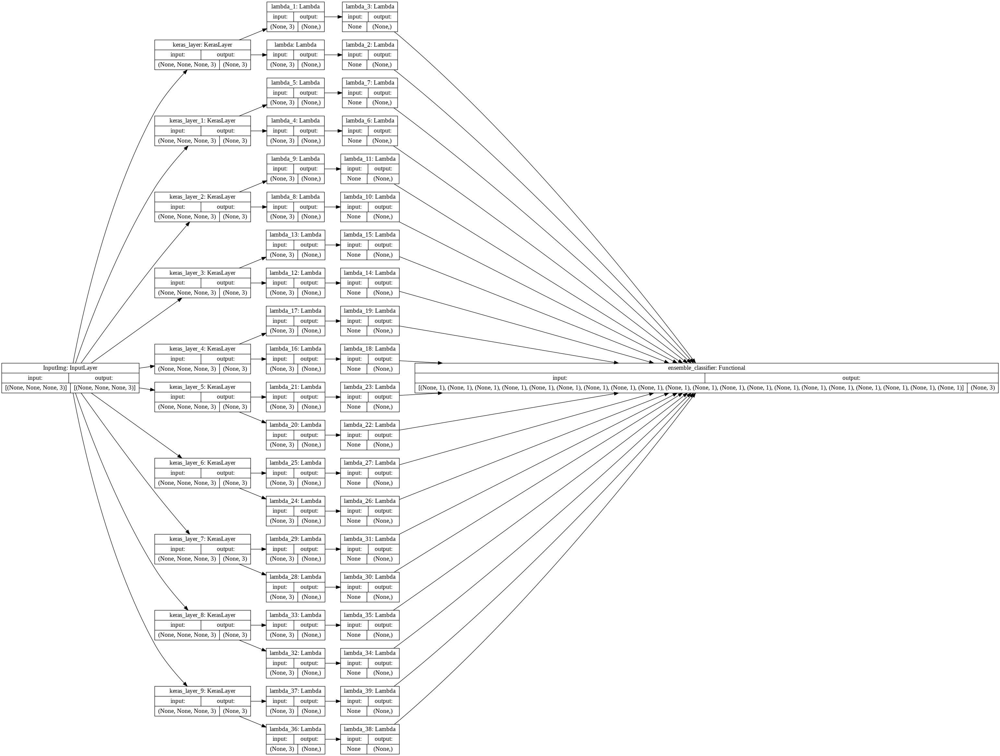

In [ ]:
tf.keras.utils.plot_model(model_end2end, show_shapes = True, rankdir="LR", 
                          to_file="/content/gdrive/My Drive/belle_epoque/diagram_end2end.png")

In [ ]:
def predict_image_ens(file_path):
    im1_tens, im1_arr = get_image(file_path = file_path)

    #make batch of 1 image
    im1_tens_batch = tf.expand_dims(im1_tens, 0)
    pred_batch_of_one = model_end2end.predict(im1_tens_batch)
    print(pred_batch_of_one)
    #take the first component of the answer, which is an array with 3 probab

    pred_probab_ens = pred_batch_of_one[0].max(axis=1)
    pred_class_ens = pred_batch_of_one[0].argmax(axis=1)

    res = {"class_predict_singlebestmodel": pred_batch_of_one[1][0],
           "probab_predict_singlebestmodel": pred_batch_of_one[2][0],
           "class_predict_ens": dict_decode_[pred_class_ens[0]],
           "probab_class_pred_ens": pred_probab_ens[0]
    }
    
    return res
            

In [ ]:
%%time
img_filepath = FOLDER_IMAGES_CROP + "3a8a9ae8-ea84-453a-92ae-674760f5f1b6.Hugo.jpg"

res = predict_image_ens(img_filepath)

print("-------------------------------------------")
pprint.pprint(res)
print("-------------------------------------------")

  || func_debug_dist  x =  ["tourism"]
  || func_debug_dist  x =  [0.985438108]
  || func_debug_dist  x =  ["tourism"]
  || func_debug_dist  x =  [0.934145331]
  || func_debug_dist  x =  ["tourism"]
  || func_debug_dist  x =  [0.918511152]
  || func_debug_dist  x =  ["tourism"]
  || func_debug_dist  x =  [0.951224148]
  || func_debug_dist  x =  ["tourism"]
  || func_debug_dist  x =  [0.970339596]
  || func_debug_dist  x =  ["tourism"]
  || func_debug_dist  x =  [0.967207611]
  || func_debug_dist  x =  ["tourism"]
  || func_debug_dist  x =  [0.94934231]
  || func_debug_dist  x =  ["tourism"]
  || func_debug_dist  x =  [0.972892523]
  || func_debug_dist  x =  ["tourism"]
  || func_debug_dist  x =  [0.923924804]
  || func_debug_dist  x =  ["tourism"]
  || func_debug_dist  x =  [0.842013717]
[array([[0.18371736, 0.10287787, 0.7134047 ]], dtype=float32), array([b'tourism'], dtype=object), array([0.9854381], dtype=float32)]
-------------------------------------------
{'class_predict_ens': 't

---------------------------

## CatBoost stacked ensemble model

In [ ]:
categorical_features_indices = list(range(1,df_train_ens.shape[1]-1,2))
categorical_features_indices

[1, 3, 5, 7, 9, 11, 13, 15, 17, 19]

Note: the label is also categorical


In [ ]:
train_pool = cb.Pool(data = df_train_ens.drop(columns=["label"], inplace = False), 
                    label = df_train_ens["label"].values,
                    cat_features = categorical_features_indices)

validation_pool = cb.Pool(data = df_valid_ens.drop(columns=["label"], inplace = False), 
                          label = df_valid_ens["label"].values,
                          cat_features = categorical_features_indices)

#-------------------------------------------
train_pool.get_feature_names()

['pred_0_probab',
 'pred_0_label',
 'pred_1_probab',
 'pred_1_label',
 'pred_2_probab',
 'pred_2_label',
 'pred_3_probab',
 'pred_3_label',
 'pred_4_probab',
 'pred_4_label',
 'pred_5_probab',
 'pred_5_label',
 'pred_6_probab',
 'pred_6_label',
 'pred_7_probab',
 'pred_7_label',
 'pred_8_probab',
 'pred_8_label',
 'pred_9_probab',
 'pred_9_label']

In [ ]:
help(cb.CatBoostClassifier.__init__)

In [ ]:
#od = overfitting detector-new
ensemble_catboost = cb.CatBoostClassifier(iterations=100, 
                                          learning_rate=0.7, 
                                          depth=6, 
                                          loss_function= 'MultiClass', 
                                          eval_metric='Accuracy', 
                                          use_best_model=True, 
                                          l2_leaf_reg = 4, 
                                          od_type="Iter",
                                          od_wait= 30)
print(ensemble_catboost.get_params())

ensemble_catboost.fit(train_pool, eval_set=validation_pool, verbose=True)

{'eval_metric': 'Accuracy', 'use_best_model': True, 'od_type': 'Iter', 'od_wait': 30, 'loss_function': 'MultiClass', 'l2_leaf_reg': 4, 'depth': 6, 'learning_rate': 0.7, 'iterations': 100}
0:	learn: 0.8766556	test: 0.7458746	best: 0.7458746 (0)	total: 25.4ms	remaining: 2.52s
1:	learn: 0.8766556	test: 0.7491749	best: 0.7491749 (1)	total: 37.2ms	remaining: 1.82s
2:	learn: 0.8758278	test: 0.7491749	best: 0.7491749 (1)	total: 49.2ms	remaining: 1.59s
3:	learn: 0.8791391	test: 0.7458746	best: 0.7491749 (1)	total: 68.3ms	remaining: 1.64s
4:	learn: 0.8849338	test: 0.7458746	best: 0.7491749 (1)	total: 79.6ms	remaining: 1.51s
5:	learn: 0.8857616	test: 0.7458746	best: 0.7491749 (1)	total: 90.9ms	remaining: 1.42s
6:	learn: 0.8915563	test: 0.7458746	best: 0.7491749 (1)	total: 102ms	remaining: 1.35s
7:	learn: 0.8899007	test: 0.7491749	best: 0.7491749 (1)	total: 113ms	remaining: 1.3s
8:	learn: 0.8956954	test: 0.7425743	best: 0.7491749 (1)	total: 125ms	remaining: 1.26s
9:	learn: 0.8956954	test: 0.73927

Note: the accuracy of the ensemble model is superior to every model's single accuracy

In [ ]:
ensemble_catboost.save_model("/content/gdrive/My Drive/belle_epoque/model_ensemble_catboost.cbm")

In [ ]:
!du -h "/content/gdrive/My Drive/belle_epoque/model_ensemble_catboost.cbm"

13K	/content/gdrive/My Drive/belle_epoque/model_ensemble_catboost.cbm


### Optunity for CatBoost hyperparameter tuning 

In [ ]:
solvers = opty.available_solvers()
solvers

['grid search',
 'random search',
 'nelder-mead',
 'sobol',
 'particle swarm',
 'tpe']

In [ ]:
def create_objective_function(the_metric = "ACCURACY"):
    def catboost_ensemble(lr, md, regul):
        #od = overfitting detector-new
        ensemble_catboost = cb.CatBoostClassifier(iterations=100, 
                                                learning_rate=lr, 
                                                max_depth= int(md), 
                                                loss_function= 'MultiClass', 
                                                eval_metric='Accuracy', 
                                                use_best_model=True, 
                                                l2_leaf_reg = int(regul), 
                                                od_type="Iter",
                                                od_wait= 50)
        #print(ensemble_catboost.get_params())

        ensemble_catboost.fit(train_pool, eval_set=validation_pool, verbose=False)
        
        #pprint.pprint(ensemble_catboost.best_score_)
        #print("-----------------------------------------------------------------")

        return ensemble_catboost.best_score_["validation"]["Accuracy"]

    return catboost_ensemble

In [ ]:
f = create_objective_function(the_metric = "ACCURACY")

optimiz = opty.maximize(f, num_evals=2000, 
                        solver_name="particle swarm",
                        lr = [0.01, 1.0], md = [3,10], regul = [1, 10])

In [ ]:
#best accuracy was achieved with params
optimiz[0]

{'lr': 0.6112990207206035,
 'md': 3.7798884314322927,
 'regul': 7.062304218273827}

In [ ]:
#od = overfitting detector-new
ensemble_catboost = cb.CatBoostClassifier(iterations=100, 
                                        learning_rate=optimiz[0]["lr"], 
                                        max_depth= int(optimiz[0]["md"]), 
                                        loss_function= 'MultiClass', 
                                        eval_metric='Accuracy', 
                                        use_best_model=True, 
                                        l2_leaf_reg = int(optimiz[0]["regul"]), 
                                        od_type="Iter",
                                        od_wait= 50)
print(ensemble_catboost.get_params())

ensemble_catboost.fit(train_pool, eval_set=validation_pool, verbose=True)

pprint.pprint(ensemble_catboost.best_score_)
print("-----------------------------------------------------------------")

ensemble_catboost.best_score_["validation"]["Accuracy"]

{'max_depth': 3, 'eval_metric': 'Accuracy', 'use_best_model': True, 'od_type': 'Iter', 'od_wait': 50, 'loss_function': 'MultiClass', 'l2_leaf_reg': 7, 'learning_rate': 0.6112990207206035, 'iterations': 100}
0:	learn: 0.8758278	test: 0.7491749	best: 0.7491749 (0)	total: 5.1ms	remaining: 505ms
1:	learn: 0.8758278	test: 0.7491749	best: 0.7491749 (0)	total: 9.73ms	remaining: 477ms
2:	learn: 0.8758278	test: 0.7491749	best: 0.7491749 (0)	total: 14ms	remaining: 454ms
3:	learn: 0.8758278	test: 0.7491749	best: 0.7491749 (0)	total: 18.4ms	remaining: 441ms
4:	learn: 0.8758278	test: 0.7491749	best: 0.7491749 (0)	total: 22.4ms	remaining: 426ms
5:	learn: 0.8758278	test: 0.7491749	best: 0.7491749 (0)	total: 26.6ms	remaining: 417ms
6:	learn: 0.8758278	test: 0.7491749	best: 0.7491749 (0)	total: 30.5ms	remaining: 406ms
7:	learn: 0.8774834	test: 0.7491749	best: 0.7491749 (0)	total: 34.5ms	remaining: 396ms
8:	learn: 0.8783113	test: 0.7491749	best: 0.7491749 (0)	total: 38.7ms	remaining: 391ms
9:	learn: 0.8

0.7821782178217822

In [ ]:
ensemble_catboost.save_model("/content/gdrive/My Drive/belle_epoque/best_model_ensemble_catboost.cbm")

### Load saved ensemble model

In [ ]:
loaded_ensemble_catboost = cb.CatBoostClassifier()  
loaded_ensemble_catboost.load_model("/content/gdrive/My Drive/belle_epoque/best_model_ensemble_catboost.cbm")

#### Features importance

In [ ]:
features_importance_ = loaded_ensemble_catboost.get_feature_importance(data = train_pool)
features_names_ = train_pool.get_feature_names()
dict(zip(features_names_, features_importance_))

{'pred_0_label': 69.48364683410598,
 'pred_0_probab': 5.406603942861124,
 'pred_1_label': 0.0,
 'pred_1_probab': 1.8315291494724455,
 'pred_2_label': 3.808046582774495,
 'pred_2_probab': 4.541757610206378,
 'pred_3_label': 0.0,
 'pred_3_probab': 1.556758708438415,
 'pred_4_label': 0.0,
 'pred_4_probab': 2.168210006153499,
 'pred_5_label': 0.0,
 'pred_5_probab': 2.523322472697422,
 'pred_6_label': 0.0,
 'pred_6_probab': 2.121068427174629,
 'pred_7_label': 0.0,
 'pred_7_probab': 1.8219260691034458,
 'pred_8_label': 0.0,
 'pred_8_probab': 0.9756797519195204,
 'pred_9_label': 2.4561042905589416,
 'pred_9_probab': 1.30534615453374}

### Inference with the ensemble model

In [ ]:
predictions_ens = ensemble_catboost.predict(df_test_ens.drop(columns="label", inplace=False))  
predictions_ens_probab = ensemble_catboost.predict_proba(df_test_ens.drop(columns="label", inplace=False))

print(type(predictions_ens), predictions_ens.shape, predictions_ens[0:10])
print(type(predictions_ens_probab), predictions_ens_probab.shape, predictions_ens_probab[0:10])

<class 'numpy.ndarray'> (80, 1) [['tourism']
 ['culture']
 ['tourism']
 ['culture']
 ['tourism']
 ['culture']
 ['retail']
 ['culture']
 ['culture']
 ['culture']]
<class 'numpy.ndarray'> (80, 3) [[0.00804805 0.01486965 0.97708231]
 [0.97122921 0.02503997 0.00373082]
 [0.00622152 0.0109839  0.98279458]
 [0.94944435 0.0370656  0.01349005]
 [0.00617937 0.01546253 0.9783581 ]
 [0.89263231 0.09676158 0.01060611]
 [0.34423446 0.61146833 0.04429721]
 [0.48783568 0.47612465 0.03603967]
 [0.88391865 0.10842359 0.00765777]
 [0.97138686 0.02130594 0.0073072 ]]


In [ ]:
df_test_ens_results = df_test_ens.copy()
df_test_ens_results["pred_ens_label"] = predictions_ens.flatten()

df_test_ens_results.head()

,pred_0_probab,pred_0_label,pred_1_probab,pred_1_label,pred_2_probab,pred_2_label,pred_3_probab,pred_3_label,pred_4_probab,pred_4_label,pred_5_probab,pred_5_label,pred_6_probab,pred_6_label,pred_7_probab,pred_7_label,pred_8_probab,pred_8_label,pred_9_probab,pred_9_label,label,pred_ens_label
0,0.942427,tourism,0.652430,tourism,0.944784,tourism,0.881238,tourism,0.864284,tourism,0.784271,tourism,0.892018,tourism,0.925562,tourism,0.904411,tourism,0.836712,tourism,tourism,tourism
1,0.964468,culture,0.835605,culture,0.900679,culture,0.995279,culture,0.854072,culture,0.969718,culture,0.965608,culture,0.972277,culture,0.996812,culture,0.963837,culture,retail,culture
2,0.888218,tourism,0.775787,culture,0.910253,tourism,0.569237,tourism,0.753170,culture,0.468630,culture,0.583291,culture,0.484703,tourism,0.611509,culture,0.472593,culture,culture,tourism
3,0.972824,culture,0.466031,retail,0.900555,culture,0.951805,culture,0.555529,culture,0.970478,culture,0.562741,culture,0.967831,culture,0.967642,culture,0.754676,culture,retail,culture
4,0.996430,tourism,0.970772,tourism,0.985894,tourism,0.997781,tourism,0.992162,tourism,0.985875,tourism,0.999599,tourism,0.998067,tourism,0.999049,tourism,0.998963,tourism,tourism,tourism


#### Sample of misclassified images

In [ ]:
df_test_misclassif = df_test_ens_results[df_test_ens_results["pred_ens_label"]!=df_test_ens_results["label"]]

print("{} misclassified by the ensemble".format(df_test_misclassif.shape[0]))
df_test_misclassif.head(10)

28 misclassified by the ensemble


,pred_0_probab,pred_0_label,pred_1_probab,pred_1_label,pred_2_probab,pred_2_label,pred_3_probab,pred_3_label,pred_4_probab,pred_4_label,pred_5_probab,pred_5_label,pred_6_probab,pred_6_label,pred_7_probab,pred_7_label,pred_8_probab,pred_8_label,pred_9_probab,pred_9_label,label,pred_ens_label
1,0.964468,culture,0.835605,culture,0.900679,culture,0.995279,culture,0.854072,culture,0.969718,culture,0.965608,culture,0.972277,culture,0.996812,culture,0.963837,culture,retail,culture
2,0.888218,tourism,0.775787,culture,0.910253,tourism,0.569237,tourism,0.753170,culture,0.468630,culture,0.583291,culture,0.484703,tourism,0.611509,culture,0.472593,culture,culture,tourism
3,0.972824,culture,0.466031,retail,0.900555,culture,0.951805,culture,0.555529,culture,0.970478,culture,0.562741,culture,0.967831,culture,0.967642,culture,0.754676,culture,retail,culture
5,0.899965,culture,0.597342,culture,0.618551,culture,0.608492,culture,0.626052,culture,0.767153,culture,0.670275,culture,0.785318,culture,0.878874,culture,0.753974,culture,retail,culture
7,0.664102,retail,0.496847,retail,0.547373,retail,0.544829,retail,0.725483,culture,0.652741,culture,0.512490,retail,0.601500,culture,0.752657,retail,0.599990,retail,retail,culture
10,0.651012,tourism,0.432748,culture,0.463750,culture,0.764320,tourism,0.556521,tourism,0.612669,tourism,0.683230,tourism,0.498374,tourism,0.562718,tourism,0.577448,tourism,tourism,culture
13,0.505904,retail,0.563774,culture,0.534998,retail,0.503653,culture,0.568121,culture,0.632999,culture,0.505901,culture,0.522131,retail,0.572761,culture,0.603831,culture,culture,retail
23,0.830395,retail,0.562377,culture,0.707191,retail,0.855097,retail,0.656521,retail,0.618110,culture,0.792686,retail,0.690916,retail,0.739803,retail,0.595605,retail,culture,retail
29,0.785198,retail,0.584248,retail,0.801169,retail,0.884780,retail,0.810891,retail,0.793137,retail,0.706832,retail,0.807887,retail,0.817026,retail,0.659491,retail,culture,retail
31,0.679623,culture,0.545500,retail,0.574137,culture,0.543955,retail,0.640332,culture,0.511830,culture,0.743701,culture,0.701382,culture,0.529570,culture,0.612348,retail,retail,culture


Int64Index([5, 3, 23, 10, 34, 7, 56, 2, 65, 52], dtype='int64') 



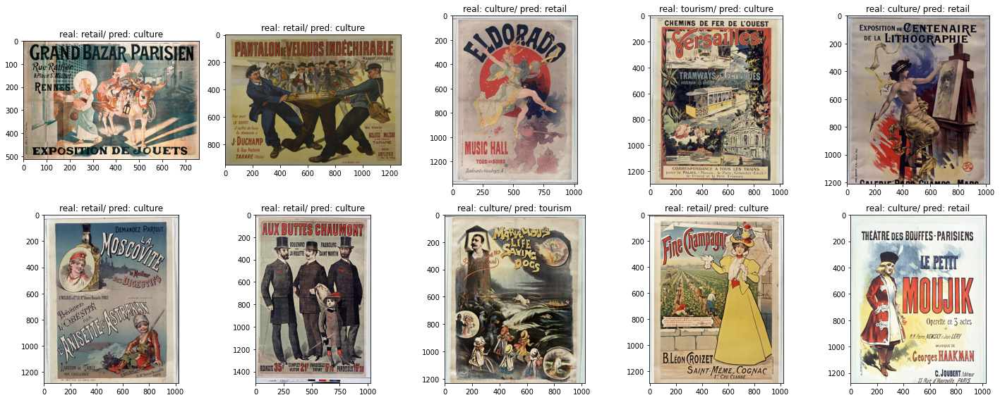

In [ ]:
df_aux = df_test_misclassif.sample(10) 
list_labels_misclass = list(df_aux[["label","pred_ens_label"]].values)

#get the filnames from the other dataframe, based on same index
print(df_aux.index, "\n")
df_aux2 = df_test_ensemble.loc[df_aux.index]
list_images_misclass = list(df_aux2["filename"].values)


s = "real: {}/ pred: {}"
list_titles = [s.format(el[0], el[1]) for el in list_labels_misclass]
#print(list_titles)

visualize_list_images(list_images = [FOLDER_IMAGES_CROP + el for el in list_images_misclass], 
                      list_titles = list_titles, images_per_row = 5)

#### Sample of correctly classified images (with ensemble, but not with best TF model)

In [ ]:
df_ens_improved = df_test_ens_results[(df_test_ens_results["pred_ens_label"]==df_test_ens_results["label"])& \
                                      (df_test_ens_results["pred_0_label"]!=df_test_ens_results["label"])]
df_ens_improved

,pred_0_probab,pred_0_label,pred_1_probab,pred_1_label,pred_2_probab,pred_2_label,pred_3_probab,pred_3_label,pred_4_probab,pred_4_label,pred_5_probab,pred_5_label,pred_6_probab,pred_6_label,pred_7_probab,pred_7_label,pred_8_probab,pred_8_label,pred_9_probab,pred_9_label,label,pred_ens_label
25,0.690125,culture,0.634008,culture,0.515384,retail,0.641030,culture,0.512974,retail,0.857063,culture,0.562812,culture,0.537687,culture,0.577863,culture,0.625353,culture,retail,retail
67,0.568861,retail,0.521946,culture,0.644805,retail,0.869499,retail,0.910047,retail,0.749885,retail,0.900324,retail,0.555803,retail,0.678832,retail,0.666233,retail,culture,culture


Int64Index([25, 67], dtype='int64') 



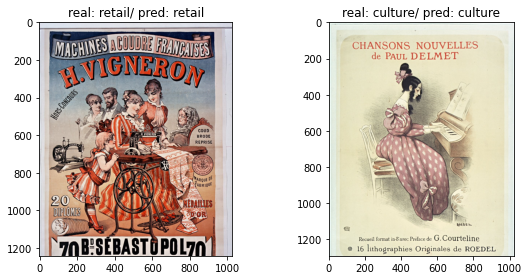

In [ ]:
df_aux = df_ens_improved
list_labels_misclass = list(df_aux[["label","pred_ens_label"]].values)

#get the filnames from the other dataframe, based on same index
print(df_aux.index, "\n")
df_aux2 = df_test_ensemble.loc[df_aux.index]
list_images_misclass = list(df_aux2["filename"].values)


s = "real: {}/ pred: {}"
list_titles = [s.format(el[0], el[1]) for el in list_labels_misclass]
#print(list_titles)

visualize_list_images(list_images = [FOLDER_IMAGES_CROP + el for el in list_images_misclass], 
                      list_titles = list_titles, images_per_row = 5)

### Compute confusion matrix

In [ ]:
predictions_ens = ensemble_catboost.predict(df_valid_ens.drop(columns="label", inplace=False))  

df_valid_ens_results = df_valid_ens.copy()
df_valid_ens_results["pred_ens_label"] = predictions_ens.flatten()

df_valid_ens_results.head()

,pred_0_probab,pred_0_label,pred_1_probab,pred_1_label,pred_2_probab,pred_2_label,pred_3_probab,pred_3_label,pred_4_probab,pred_4_label,pred_5_probab,pred_5_label,pred_6_probab,pred_6_label,pred_7_probab,pred_7_label,pred_8_probab,pred_8_label,pred_9_probab,pred_9_label,label,pred_ens_label
0,0.814682,culture,0.541242,culture,0.811966,culture,0.888726,culture,0.583433,retail,0.805573,culture,0.530944,culture,0.852871,culture,0.844515,culture,0.669025,culture,culture,culture
1,0.999080,retail,0.940831,retail,0.999933,retail,0.999672,retail,0.994930,retail,0.994706,retail,0.999638,retail,0.999876,retail,0.999884,retail,0.992709,retail,retail,retail
2,0.456577,tourism,0.456994,tourism,0.669838,culture,0.788328,tourism,0.666021,tourism,0.555360,tourism,0.562998,tourism,0.718925,culture,0.434167,tourism,0.520528,tourism,tourism,tourism
3,0.536549,retail,0.541170,retail,0.516170,culture,0.718795,retail,0.549306,culture,0.506908,retail,0.524667,retail,0.634241,retail,0.589136,retail,0.571693,retail,tourism,culture
4,0.596295,retail,0.629574,culture,0.528986,retail,0.583126,culture,0.529138,culture,0.761989,culture,0.562394,retail,0.575353,culture,0.551661,culture,0.552340,culture,retail,retail


In [ ]:
df_predictions = df_valid_ens_results[["label", "pred_ens_label"]]
df_predictions.columns = ["label", "pred_label"]
df_predictions.head()

,label,pred_label
0,culture,culture
1,retail,retail
2,tourism,tourism
3,tourism,culture
4,retail,retail


In [ ]:
predictions_grouped_counts = pd.DataFrame(df_predictions.groupby(by=["label","pred_label"]).size())
predictions_grouped_counts.columns = ["c"]
predictions_grouped_counts

c
label   pred_label     
culture culture     112
        retail       19
        tourism      11
retail  culture      22
        retail       94
        tourism       4
tourism culture       6
        retail        4
        tourism      31

In [ ]:
#convert to percentages
predictions_grouped_perc = predictions_grouped_counts.groupby(level=0).apply(lambda x: 100 * x / float(x.sum()))

predictions_grouped_perc

c
label   pred_label           
culture culture     78.873239
        retail      13.380282
        tourism      7.746479
retail  culture     18.333333
        retail      78.333333
        tourism      3.333333
tourism culture     14.634146
        retail       9.756098
        tourism     75.609756

In [ ]:
predictions_grouped_pivot = pd.pivot_table(predictions_grouped_perc, index=["label"], columns = "pred_label", values="c")
predictions_grouped_pivot.fillna(0, inplace=True)

order_index = predictions_grouped_pivot.index.values
print(order_index)
order_columns = list(predictions_grouped_pivot.columns)
print(order_columns)

predictions_grouped_pivot[order_index]

['culture' 'retail' 'tourism']
['culture', 'retail', 'tourism']


pred_label,culture,retail,tourism
label,,,
culture,78.873239,13.380282,7.746479
retail,18.333333,78.333333,3.333333
tourism,14.634146,9.756098,75.609756


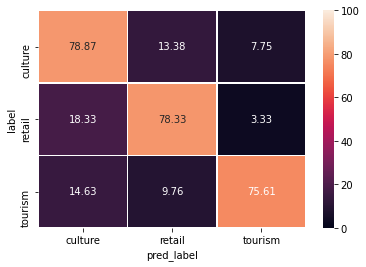

In [ ]:
sns.heatmap(predictions_grouped_pivot[order_index], annot = True, fmt =".2f", vmin=0.0, vmax=100.0, linewidths=.5);